# Final Project - Stage 1
## Exploratory Data Analysis - Data Set Dana
## FD23-01 : Fraud Busters
**Group Member:**
- (ML) M118DKX4597 	- Dharma Setiawan
- (ML) M181DSX0383 	- Jeremy Reeve Kurniawan
- (ML) M181DSX0495 	- Muhammad Agil Ghifari
- (CC) C181DSX0615 	- Taufik Pragusga


### Import Libraries

In [ ]:
#Data and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats.stats import kendalltau
import plotly.express as px
from tabulate import tabulate
from sklearn.impute import SimpleImputer

<ipython-input-1-f089d30426db>:6: DeprecationWarning: Please use `kendalltau` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import kendalltau


## Altering default matplotlib's parameters
Change default parameter of matplotlib


In [ ]:
from matplotlib import rcParams

rcParams['figure.figsize'] = 12, 4
rcParams['lines.linewidth'] = 3
rcParams['xtick.labelsize'] = 'x-large'
rcParams['ytick.labelsize'] = 'x-large'

## Import Data set

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Dataset features**

No.	Column name	Description
1.		**uid** This is unique id for all users that appear on this dataset
2.		**is_scammer**	This is label for fraud detection, 1 means this user is scammer, 0 is non-scammer. Be aware that there some users can be 1 or 0, it depends on what source they are appeared to be their label.
3.		**source**	This is on what channel report is user verified as scammers or non-scammers.
4.	**trx_date**	This is the date of their last transactions
5.		**report_date**	This is the date when other users report this user conducting scam.
6.		**registereddate**	This the date the user register to application
7.		**birthday**	This is user’s birthday based on their certificate id.
8.		**gender**	This is user’s gender based on their certificate id.
9.		**job_position**	This is user’s job_position based on their certificate id.
10.		**is_verified**	This is terms to marks user either is verified as valid users or not, 1 means verified (kyc) 0 means non verified.
11.		**aqc_freq_prepaid_mobile**	This is total frequency of user buying prepaid_mobile all time
12.		**aqc_mean_prepaid_mobile_amount**	This is mean total amount of user buying prepaid_mobile all time
13.		**aqc_freq_topup**	This is total frequency of user’s topup transactions all time
14.		**aqc_freq_topup_within_7d**	This is total frequency of user doing topup within 7d before their last trx_date
15.		**aqc_mean_topup_amount**	This is mean total amount of user doing topup all time
16.		**aqc_mean_topup_amount_7d**	This is mean total amount of user doing topup within 7d before their last trx_date
17.		**aqc_mean_topup_amount_30d**	This is mean total amount of user doing topup within 30d before their last trx_date
18.		**aqc_mean_topup_amount_90d**	This is mean total amount of user doing topup within 90d before their last trx_date
19.		**aqc_total_topup_amount_7d**	This is sum total amount of user doing topup within 7d before their last trx_date
20.		**aqc_total_topup_amount_90d**	This is sum total amount of user doing topup within 90d before their last trx_date
21.		**aqc_freq_x2x**	This is total frequency of user’s x2x transactions all time
22.		**aqc_freq_x2x_within_60d**	This is total frequency of user’s x2x transactions within 60d before their trx_date
23.		**aqc_freq_x2x_within_90d**	This is total frequency of user’s x2x transactions within 90d before their trx_date
24.		**aqc_mean_x2x_amount**	This is mean total amount of user’s x2x transactions all time
25.		**aqc_mean_x2x_amount_7d**	This mean total amount of user’s x2x transactions within 7d before their trx_date
26.		**aqc_mean_x2x_amount_30d**	This mean total amount of user’s x2x transactions within 30d before their trx_date
27.		**aqc_mean_x2x_amount_60d**	This mean total amount of user’s x2x transactions within 60d before their trx_date
28.		**aqc_mean_x2x_amount_90d**	This mean total amount of user’s x2x transactions within 90d before their trx_date
29.		**aqc_total_x2x_amount**	This is sum total amount of user’s x2x transactions all time
30.		**aqc_total_x2x_amount_7d**	This is sum total amount of user’s x2x transactions within 7d before their trx_date
31.		**aqc_total_x2x_amount_30d**	This is sum total amount of user’s x2x transactions within 30d before their trx_date
32.		**aqc_total_x2x_amount_60d**	This is sum total amount of user’s x2x transactions within 60d before their trx_date
33.		**aqc_total_x2x_amount_90d**	This is sum total amount of user’s x2x transactions within 90d before their trx_date
34.		**dormancy_max_gmt_pay_diff_days**	This is max days of dormant account. Dormant account means this account is rarely use our app.
35.		**dormancy_mean_gmt_pay_diff_days**	This is mean days of dormant account
36.		**dormancy_count_trx**	This is total transaction of dormant account
37.		**kyc_total_failed**	This is number of times user’s failed to register as verified user (kyc)
38.		**kyc_total_revoked**	This is number of times user’s revoked after success to register as verified user (kyc)
39.		**avg_topup_weight_1**	This is average user topup frequency per latest month multiply by weight then added by second month topup frequency multiply by half weight of latest month, so on and so on until sixth month before the latest month of trx_date then divided by six
40.		**avg_x2x_weight_1**	This is average user x2x frequency per latest month multiply by weight, then added by second month x2x frequency multiply by half weight of latest month, so on and so on until sixth month before the latest month of trx_date then divided by six
41.		**avg_other_weight_1**	This is average user other transaction frequency (beside topup and x2x) per latest month multiply by weight, then added by second month other transaction frequency (beside topup and x2x) multiply by half weight of latest month, so on and so on until sixth month before the latest month of trx_date then divided by six
42.		**centrality_outdegree_p2p**	This is value of outdegree centrality of p2p transaction per user for the latest month
43.		**centrality_indegree_p2p**	This is value of indegree centrality of p2p transaction per user for the latest month
44.		**centrality_undirected_p2p**	This is value of undirected degree centrality of p2p transaction per user for the latest month
45.		**centrality_outdegree_sendmoney**	This is value of outdegree centrality of sendmoney transaction per user for the latest month


In [ ]:
pd.set_option('display.max_columns', None)
url_dataset = "/content/drive/MyDrive/fraud_detection_for_bangkit_final.csv"
df_fraud = pd.read_csv(url_dataset)
df_fraud.head()


,uid,is_scammer,source,trx_date,report_date,registereddate,birthday,gender,job_position,is_verified,aqc_freq_prepaid_mobile,aqc_mean_prepaid_mobile_amount,aqc_freq_topup,aqc_freq_topup_within_7d,aqc_mean_topup_amount,aqc_mean_topup_amount_7d,aqc_mean_topup_amount_30d,aqc_mean_topup_amount_90d,aqc_total_topup_amount_7d,aqc_total_topup_amount_90d,aqc_freq_x2x,aqc_freq_x2x_within_60d,aqc_freq_x2x_within_90d,aqc_mean_x2x_amount,aqc_mean_x2x_amount_7d,aqc_mean_x2x_amount_30d,aqc_mean_x2x_amount_60d,aqc_mean_x2x_amount_90d,aqc_total_x2x_amount,aqc_total_x2x_amount_7d,aqc_total_x2x_amount_30d,aqc_total_x2x_amount_60d,aqc_total_x2x_amount_90d,dormancy_max_gmt_pay_diff_days,dormancy_mean_gmt_pay_diff_days,dormancy_count_trx,kyc_total_failed,kyc_total_revoked,avg_topup_weight_1,avg_x2x_weight_1,avg_other_weight_1,centrality_outdegree_p2p,centrality_indegree_p2p,centrality_undirected_p2p,centrality_outdegree_sendmoney
0,da41ba31-1fb7-4123-b4f5-49d3c93c407d,1,INCOMPLETE_CS_REPORT_SCAMMER,2023-02-10,2023-02-10,2022-10,01-1994,Female,MENGURUS RUMAH TANGGA,1,0,0.000000,15,8,1.372869e+05,6.152914e+04,8.079987e+04,1.372869e+05,47931200,106946500,762,434,762,2.566508e+07,1.026714e+07,1.541515e+07,1.541515e+07,2.566508e+07,19993100000,7998100000,12008400000,12008400000,19993100000,45.0,0.110949,685,1.0,0.0,1.125000,50.500000,0.166667,0.000014,7.343068e-05,8.078081e-05,6.530402e-08
1,39063101-67dc-4a30-8d3a-d16a388f5dbd,1,INCOMPLETE_CS_REPORT_SCAMMER,2023-02-07,2023-02-07,2023-01,04-2002,Male,PELAJAR / MAHASISWA,1,1,222222.222222,29,15,4.090556e+07,3.042222e+07,4.090556e+07,4.090556e+07,2738000000,3681500000,47,47,47,5.808222e+07,4.131111e+07,5.808222e+07,5.808222e+07,5.808222e+07,5227400000,3718000000,5227400000,5227400000,5227400000,6.0,0.242857,70,0.0,0.0,2.208333,3.041667,1.416667,0.000000,7.067437e-08,7.067437e-08,1.306080e-07
2,74196a84-6b98-475a-b01d-a4eb22c4c015,1,INCOMPLETE_CS_REPORT_SCAMMER,2023-01-16,2023-01-16,2022-12,04-1991,Male,BELUM / TIDAK BEKERJA,1,0,0.000000,3,3,2.419355e+05,2.419355e+05,2.419355e+05,2.419355e+05,15000000,15000000,40,40,40,1.928892e+08,1.928892e+08,1.928892e+08,1.928892e+08,1.928892e+08,11959127900,11959127900,11959127900,11959127900,11959127900,0.0,0.000000,18,0.0,0.0,0.375000,3.583333,2.333333,0.000000,5.300578e-05,5.300578e-05,6.530402e-08
3,640d7332-34f5-45bd-8404-65f72417fadc,1,CS_REPORT_SCAMMER,2022-04-19,2022-04-21,2022-04,NaN,NaN,NaN,0,0,0.000000,4,4,1.437500e+07,1.437500e+07,1.437500e+07,1.437500e+07,115000000,115000000,0,0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,0,0,0,0.0,0.000000,7,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00
4,640d7332-34f5-45bd-8404-65f72417fadc,1,CS_REPORT_SCAMMER,2022-04-19,2022-04-21,2022-04,NaN,NaN,NaN,0,0,0.000000,4,4,1.437500e+07,1.437500e+07,1.437500e+07,1.437500e+07,115000000,115000000,0,0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,0,0,0,0.0,0.000000,7,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00


In [ ]:
# Filter data so that the source only come from the already defined channel
channel = ['INCOMPLETE_CS_REPORT_VICTIM', 'INCOMPLETE_CS_REPORT_SCAMMER', 'CS_REPORT_SCAMMER', 'CS_REPORT_VICTIM']
df_fraud = df_fraud[df_fraud['source'].apply(lambda x : x in channel)]
df_fraud['source'].value_counts()


CS_REPORT_SCAMMER               12577
CS_REPORT_VICTIM                11353
INCOMPLETE_CS_REPORT_VICTIM     10367
INCOMPLETE_CS_REPORT_SCAMMER     8562
Name: source, dtype: int64

# Descriptive Statistics

## Informasi general variabel-variabel pada data frame

In [ ]:
#Info semua variabel secara general
df_fraud.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42859 entries, 0 to 398331
Data columns (total 45 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   uid                              42859 non-null  object 
 1   is_scammer                       42859 non-null  int64  
 2   source                           42859 non-null  object 
 3   trx_date                         42859 non-null  object 
 4   report_date                      42859 non-null  object 
 5   registereddate                   42768 non-null  object 
 6   birthday                         36944 non-null  object 
 7   gender                           37233 non-null  object 
 8   job_position                     36944 non-null  object 
 9   is_verified                      42859 non-null  int64  
 10  aqc_freq_prepaid_mobile          42859 non-null  int64  
 11  aqc_mean_prepaid_mobile_amount   42859 non-null  float64
 12  aqc_freq_topup   

In [ ]:
#Cek missing value
df_fraud.isna().sum()

uid                                   0
is_scammer                            0
source                                0
trx_date                              0
report_date                           0
registereddate                       91
birthday                           5915
gender                             5626
job_position                       5915
is_verified                           0
aqc_freq_prepaid_mobile               0
aqc_mean_prepaid_mobile_amount        0
aqc_freq_topup                        0
aqc_freq_topup_within_7d              0
aqc_mean_topup_amount                 0
aqc_mean_topup_amount_7d              0
aqc_mean_topup_amount_30d             0
aqc_mean_topup_amount_90d             0
aqc_total_topup_amount_7d             0
aqc_total_topup_amount_90d            0
aqc_freq_x2x                          0
aqc_freq_x2x_within_60d               0
aqc_freq_x2x_within_90d               0
aqc_mean_x2x_amount                   0
aqc_mean_x2x_amount_7d                0


In [ ]:
#Cek data double
df_fraud.duplicated().sum()

73

- The data consists of 32832 rows and 45 columns.
- After the filtering, we remove 90% of the data and currently we have 42859 rows.
- There are several null values in the dataset. The highest missing value is on report date.
- There are 73 duplicated columns
- There are 44 independent features and 1 targeted variable (dependent variable).
- According to its type, there are 8 categoric features and 36 numeric features.
- There is one target variable, which is `is_scammer` that is numeric.

## Statistical Summary

In [ ]:
# membagi data berdasarkan type datanya
category = df_fraud.select_dtypes(include='object')
numerical = df_fraud.select_dtypes(exclude='object')

numerical_cols = numerical.columns.to_list()
category_cols = category.columns.to_list()

print("Data numerik: ", numerical_cols)
print("Data category: ", category_cols)

Data numerik:  ['is_scammer', 'is_verified', 'aqc_freq_prepaid_mobile', 'aqc_mean_prepaid_mobile_amount', 'aqc_freq_topup', 'aqc_freq_topup_within_7d', 'aqc_mean_topup_amount', 'aqc_mean_topup_amount_7d', 'aqc_mean_topup_amount_30d', 'aqc_mean_topup_amount_90d', 'aqc_total_topup_amount_7d', 'aqc_total_topup_amount_90d', 'aqc_freq_x2x', 'aqc_freq_x2x_within_60d', 'aqc_freq_x2x_within_90d', 'aqc_mean_x2x_amount', 'aqc_mean_x2x_amount_7d', 'aqc_mean_x2x_amount_30d', 'aqc_mean_x2x_amount_60d', 'aqc_mean_x2x_amount_90d', 'aqc_total_x2x_amount', 'aqc_total_x2x_amount_7d', 'aqc_total_x2x_amount_30d', 'aqc_total_x2x_amount_60d', 'aqc_total_x2x_amount_90d', 'dormancy_max_gmt_pay_diff_days', 'dormancy_mean_gmt_pay_diff_days', 'dormancy_count_trx', 'kyc_total_failed', 'kyc_total_revoked', 'avg_topup_weight_1', 'avg_x2x_weight_1', 'avg_other_weight_1', 'centrality_outdegree_p2p', 'centrality_indegree_p2p', 'centrality_undirected_p2p', 'centrality_outdegree_sendmoney']
Data category:  ['uid', 'sour

In [ ]:
#Pengelompokkan variabel kategorik
df_fraud_cat = df_fraud[category_cols]
df_fraud_cat.head()

,uid,source,trx_date,report_date,registereddate,birthday,gender,job_position
0,da41ba31-1fb7-4123-b4f5-49d3c93c407d,INCOMPLETE_CS_REPORT_SCAMMER,2023-02-10,2023-02-10,2022-10,01-1994,Female,MENGURUS RUMAH TANGGA
1,39063101-67dc-4a30-8d3a-d16a388f5dbd,INCOMPLETE_CS_REPORT_SCAMMER,2023-02-07,2023-02-07,2023-01,04-2002,Male,PELAJAR / MAHASISWA
2,74196a84-6b98-475a-b01d-a4eb22c4c015,INCOMPLETE_CS_REPORT_SCAMMER,2023-01-16,2023-01-16,2022-12,04-1991,Male,BELUM / TIDAK BEKERJA
3,640d7332-34f5-45bd-8404-65f72417fadc,CS_REPORT_SCAMMER,2022-04-19,2022-04-21,2022-04,NaN,NaN,NaN
4,640d7332-34f5-45bd-8404-65f72417fadc,CS_REPORT_SCAMMER,2022-04-19,2022-04-21,2022-04,NaN,NaN,NaN


In [ ]:
#Pengelompokkan variabel numerik
df_fraud_num = df_fraud[numerical_cols]
df_fraud_num.head()

,is_scammer,is_verified,aqc_freq_prepaid_mobile,aqc_mean_prepaid_mobile_amount,aqc_freq_topup,aqc_freq_topup_within_7d,aqc_mean_topup_amount,aqc_mean_topup_amount_7d,aqc_mean_topup_amount_30d,aqc_mean_topup_amount_90d,aqc_total_topup_amount_7d,aqc_total_topup_amount_90d,aqc_freq_x2x,aqc_freq_x2x_within_60d,aqc_freq_x2x_within_90d,aqc_mean_x2x_amount,aqc_mean_x2x_amount_7d,aqc_mean_x2x_amount_30d,aqc_mean_x2x_amount_60d,aqc_mean_x2x_amount_90d,aqc_total_x2x_amount,aqc_total_x2x_amount_7d,aqc_total_x2x_amount_30d,aqc_total_x2x_amount_60d,aqc_total_x2x_amount_90d,dormancy_max_gmt_pay_diff_days,dormancy_mean_gmt_pay_diff_days,dormancy_count_trx,kyc_total_failed,kyc_total_revoked,avg_topup_weight_1,avg_x2x_weight_1,avg_other_weight_1,centrality_outdegree_p2p,centrality_indegree_p2p,centrality_undirected_p2p,centrality_outdegree_sendmoney
0,1,1,0,0.000000,15,8,1.372869e+05,6.152914e+04,8.079987e+04,1.372869e+05,47931200,106946500,762,434,762,2.566508e+07,1.026714e+07,1.541515e+07,1.541515e+07,2.566508e+07,19993100000,7998100000,12008400000,12008400000,19993100000,45.0,0.110949,685,1.0,0.0,1.125000,50.500000,0.166667,0.000014,7.343068e-05,8.078081e-05,6.530402e-08
1,1,1,1,222222.222222,29,15,4.090556e+07,3.042222e+07,4.090556e+07,4.090556e+07,2738000000,3681500000,47,47,47,5.808222e+07,4.131111e+07,5.808222e+07,5.808222e+07,5.808222e+07,5227400000,3718000000,5227400000,5227400000,5227400000,6.0,0.242857,70,0.0,0.0,2.208333,3.041667,1.416667,0.000000,7.067437e-08,7.067437e-08,1.306080e-07
2,1,1,0,0.000000,3,3,2.419355e+05,2.419355e+05,2.419355e+05,2.419355e+05,15000000,15000000,40,40,40,1.928892e+08,1.928892e+08,1.928892e+08,1.928892e+08,1.928892e+08,11959127900,11959127900,11959127900,11959127900,11959127900,0.0,0.000000,18,0.0,0.0,0.375000,3.583333,2.333333,0.000000,5.300578e-05,5.300578e-05,6.530402e-08
3,1,0,0,0.000000,4,4,1.437500e+07,1.437500e+07,1.437500e+07,1.437500e+07,115000000,115000000,0,0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,0,0,0,0.0,0.000000,7,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00
4,1,0,0,0.000000,4,4,1.437500e+07,1.437500e+07,1.437500e+07,1.437500e+07,115000000,115000000,0,0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,0,0,0,0.0,0.000000,7,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00


### Variabel Kategorik

In [ ]:
#Rangkuman statistik variabel kategorik 
df_fraud_cat.describe()

,uid,source,trx_date,report_date,registereddate,birthday,gender,job_position
count,42859,42859,42859,42859,42768,36944,37233,36944
unique,42775,4,834,796,62,739,2,83
top,21224163-910b-4568-95c9-317fe6b5b528,CS_REPORT_SCAMMER,2023-03-01,2023-01-03,2021-05,04-2003,Male,PELAJAR / MAHASISWA
freq,8,12577,460,544,2094,283,23727,16838


- All the variables contain low cardinalities (low number of unique values), already good.
- `source` that is being used is CS_REPORT_SCAMMER (~29.34%).
- Male dominates the data (63.72%).
- Pelajar/Mahasiswa dominates the`job_position` (45.57%).


### Variabel Numerik

In [ ]:
#Rangkuman statistik variabel numerik 
df_fraud_num.describe()

,is_scammer,is_verified,aqc_freq_prepaid_mobile,aqc_mean_prepaid_mobile_amount,aqc_freq_topup,aqc_freq_topup_within_7d,aqc_mean_topup_amount,aqc_mean_topup_amount_7d,aqc_mean_topup_amount_30d,aqc_mean_topup_amount_90d,aqc_total_topup_amount_7d,aqc_total_topup_amount_90d,aqc_freq_x2x,aqc_freq_x2x_within_60d,aqc_freq_x2x_within_90d,aqc_mean_x2x_amount,aqc_mean_x2x_amount_7d,aqc_mean_x2x_amount_30d,aqc_mean_x2x_amount_60d,aqc_mean_x2x_amount_90d,aqc_total_x2x_amount,aqc_total_x2x_amount_7d,aqc_total_x2x_amount_30d,aqc_total_x2x_amount_60d,aqc_total_x2x_amount_90d,dormancy_max_gmt_pay_diff_days,dormancy_mean_gmt_pay_diff_days,dormancy_count_trx,kyc_total_failed,kyc_total_revoked,avg_topup_weight_1,avg_x2x_weight_1,avg_other_weight_1,centrality_outdegree_p2p,centrality_indegree_p2p,centrality_undirected_p2p,centrality_outdegree_sendmoney
count,42859.000000,42859.000000,42859.000000,4.285900e+04,42859.000000,42859.000000,4.285900e+04,4.285900e+04,4.285900e+04,4.285900e+04,4.285900e+04,4.285900e+04,42859.000000,42859.000000,42859.000000,4.285900e+04,4.285900e+04,4.285900e+04,4.285900e+04,4.285900e+04,4.285900e+04,4.285900e+04,4.285900e+04,4.285900e+04,4.285900e+04,42350.000000,42350.000000,42859.000000,39338.000000,39338.000000,42859.000000,42859.000000,42859.000000,4.285900e+04,4.285900e+04,4.285900e+04,4.285900e+04
mean,0.493222,0.861896,25.062181,2.586403e+05,142.993747,42.261369,9.304014e+06,5.226351e+06,6.147307e+06,7.234549e+06,1.077001e+09,1.676673e+09,218.512121,85.372104,119.039432,1.815470e+07,8.451350e+06,1.022049e+07,1.196643e+07,1.315167e+07,4.569786e+09,1.573783e+09,1.897333e+09,2.289043e+09,2.612643e+09,113.633081,5.366507,357.969435,1.773679,0.101098,3.000850,5.577683,2.957488,7.496606e-07,2.099840e-06,2.759228e-06,6.084417e-08
std,0.499960,0.345013,63.111954,1.808909e+06,263.406730,94.695076,2.308285e+07,2.013716e+07,2.133765e+07,2.215814e+07,2.773939e+09,3.298651e+09,513.447543,178.339216,225.069893,5.486942e+07,3.139249e+07,3.544961e+07,3.958570e+07,4.241516e+07,8.535904e+09,3.490608e+09,3.785218e+09,4.269708e+09,4.760741e+09,163.674593,18.446019,730.326974,3.278166,1.044586,6.031541,12.036570,6.044840,1.981886e-06,9.526739e-06,9.687638e-06,1.131818e-07
min,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,0.000000,1.000000,1.000000,4.411123e+03,17.000000,4.000000,1.835938e+06,2.834971e+05,4.936154e+05,8.490880e+05,4.050000e+07,1.000000e+08,9.000000,4.000000,6.000000,1.283283e+06,2.058712e+05,3.686072e+05,5.094345e+05,6.115463e+05,1.150000e+08,3.000445e+07,4.700000e+07,6.000000e+07,6.733580e+07,14.000000,0.339748,33.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,0.000000,1.000000,7.000000,5.659749e+04,61.000000,13.000000,3.714550e+06,1.071429e+06,1.524504e+06,2.191404e+06,2.300000e+08,5.097285e+08,64.000000,24.000000,37.000000,4.084122e+06,1.151069e+06,1.651064e+06,2.090026e+06,2.419556e+06,1.149074e+09,3.141397e+08,4.802948e+08,6.171606e+08,7.142500e+08,49.000000,1.189792,128.000000,1.000000,0.000000,0.885417,0.916667,1.078125,0.000000e+00,7.067437e-08,1.413487e-07,0.000000e+00
75%,1.000000,1.000000,26.000000,1.726800e+05,176.000000,43.000000,7.900951e+06,3.260456e+06,4.117488e+06,5.292801e+06,9.283090e+08,1.823306e+09,242.000000,91.000000,134.000000,1.032548e+07,4.136380e+06,5.299010e+06,6.271881e+06,6.926947e+06,4.769414e+09,1.400554e+09,1.896968e+09,2.392369e+09,2.782633e+09,145.000000,3.714286,403.000000,2.000000,0.000000,3.520833,5.359375,3.567708,4.947206e-07,3.533719e-07,1.201464e-06,9.795603e-08
max,1.000000,1.000000,4718.000000,1.000000e+08,24919.000000,3819.000000,7.644444e+08,7.6

In [ ]:
#Melihat perbandingan data pada variabel `job_position`
df_fraud.groupby(['job_position']).agg({'uid' : ['count']})

,uid
,count
job_position,
110,30
112,1
114,9
126,1
13,142
...,...
WIRASWASTA,2811
WIRASWATA,1


- We can see that the variable is not normal. There are several job position that redundant. The most unique pattern is that there are several people who input the number (110,112,114, etc.). This might be an indication of scammer.

### Target Variable

In [ ]:
#Rangkuman statistik targeted variabel (`Reached.on.Time_Y.N`)
df_fraud['is_scammer'].describe()

count    42859.000000
mean         0.493222
std          0.499960
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: is_scammer, dtype: float64

- Variabel ini adalah variabel boolean/binary bertipe integer, bisa juga dijadikan variabel kategorikal, 1 adalah pengantaran barang terlambat dan 0 adalah pengantaran barang tepat waktu. Untuk analisis statistik deskriptif, lebih pas untuk melihat variabel `Reached.on.Time_Y.N` ini sebagai variabel kategorik.

In [ ]:
#Melihat perbandingan data pada variabel `is_scammer`
df_fraud.groupby(['is_scammer']).agg({'uid' : ['count']})

,uid
,count
is_scammer,
0,21720
1,21139


<Axes: xlabel='is_scammer', ylabel='count'>

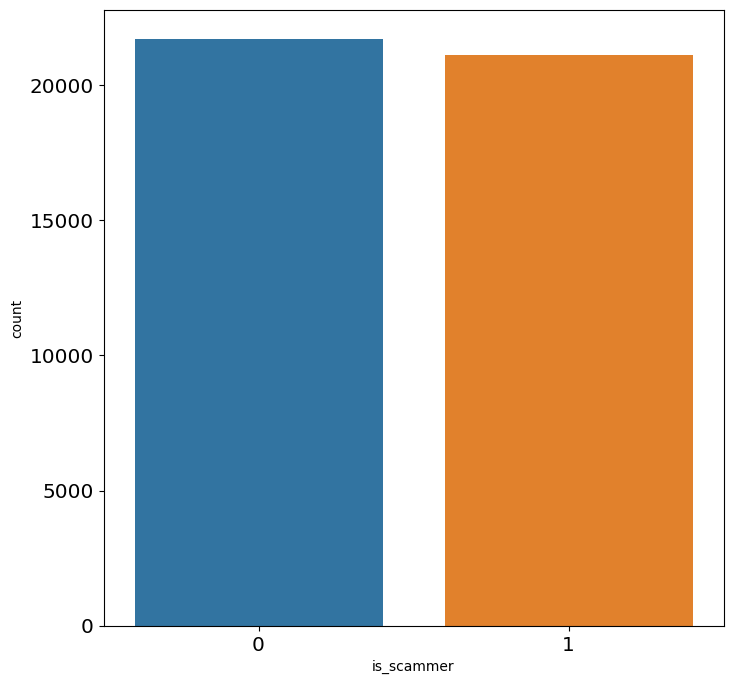

In [ ]:
# Countplot target variable visualization
plt.figure(figsize=(8, 8))
sns.countplot(x=df_fraud['is_scammer'], data=df_fraud)

- The data is balaced.

## Descriptive Statistics Summary
A. Are there any column with a weird data type?
> 

B. Are there any column who has null values? If yes, what is it? 
> Yes, there are several column that has null values. 

C. Are there any columns who the values are not matched? 
> The job position column has a weird values.

D. Are there any column who have weird summary values?


In [ ]:
df_fraud['is_scammer(cat)'] = np.where(df_fraud['is_scammer']==0, 'No', 'Yes')

In [ ]:
#Tampilan terbaru penamaan variabel
df_fraud.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42859 entries, 0 to 398331
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   uid                              42859 non-null  object 
 1   is_scammer                       42859 non-null  int64  
 2   source                           42859 non-null  object 
 3   trx_date                         42859 non-null  object 
 4   report_date                      42859 non-null  object 
 5   registereddate                   42768 non-null  object 
 6   birthday                         36944 non-null  object 
 7   gender                           37233 non-null  object 
 8   job_position                     36944 non-null  object 
 9   is_verified                      42859 non-null  int64  
 10  aqc_freq_prepaid_mobile          42859 non-null  int64  
 11  aqc_mean_prepaid_mobile_amount   42859 non-null  float64
 12  aqc_freq_topup   

In [ ]:
df_fraud.head(5)

,uid,is_scammer,source,trx_date,report_date,registereddate,birthday,gender,job_position,is_verified,aqc_freq_prepaid_mobile,aqc_mean_prepaid_mobile_amount,aqc_freq_topup,aqc_freq_topup_within_7d,aqc_mean_topup_amount,aqc_mean_topup_amount_7d,aqc_mean_topup_amount_30d,aqc_mean_topup_amount_90d,aqc_total_topup_amount_7d,aqc_total_topup_amount_90d,aqc_freq_x2x,aqc_freq_x2x_within_60d,aqc_freq_x2x_within_90d,aqc_mean_x2x_amount,aqc_mean_x2x_amount_7d,aqc_mean_x2x_amount_30d,aqc_mean_x2x_amount_60d,aqc_mean_x2x_amount_90d,aqc_total_x2x_amount,aqc_total_x2x_amount_7d,aqc_total_x2x_amount_30d,aqc_total_x2x_amount_60d,aqc_total_x2x_amount_90d,dormancy_max_gmt_pay_diff_days,dormancy_mean_gmt_pay_diff_days,dormancy_count_trx,kyc_total_failed,kyc_total_revoked,avg_topup_weight_1,avg_x2x_weight_1,avg_other_weight_1,centrality_outdegree_p2p,centrality_indegree_p2p,centrality_undirected_p2p,centrality_outdegree_sendmoney,is_scammer(cat)
0,da41ba31-1fb7-4123-b4f5-49d3c93c407d,1,INCOMPLETE_CS_REPORT_SCAMMER,2023-02-10,2023-02-10,2022-10,01-1994,Female,MENGURUS RUMAH TANGGA,1,0,0.000000,15,8,1.372869e+05,6.152914e+04,8.079987e+04,1.372869e+05,47931200,106946500,762,434,762,2.566508e+07,1.026714e+07,1.541515e+07,1.541515e+07,2.566508e+07,19993100000,7998100000,12008400000,12008400000,19993100000,45.0,0.110949,685,1.0,0.0,1.125000,50.500000,0.166667,0.000014,7.343068e-05,8.078081e-05,6.530402e-08,Yes
1,39063101-67dc-4a30-8d3a-d16a388f5dbd,1,INCOMPLETE_CS_REPORT_SCAMMER,2023-02-07,2023-02-07,2023-01,04-2002,Male,PELAJAR / MAHASISWA,1,1,222222.222222,29,15,4.090556e+07,3.042222e+07,4.090556e+07,4.090556e+07,2738000000,3681500000,47,47,47,5.808222e+07,4.131111e+07,5.808222e+07,5.808222e+07,5.808222e+07,5227400000,3718000000,5227400000,5227400000,5227400000,6.0,0.242857,70,0.0,0.0,2.208333,3.041667,1.416667,0.000000,7.067437e-08,7.067437e-08,1.306080e-07,Yes
2,74196a84-6b98-475a-b01d-a4eb22c4c015,1,INCOMPLETE_CS_REPORT_SCAMMER,2023-01-16,2023-01-16,2022-12,04-1991,Male,BELUM / TIDAK BEKERJA,1,0,0.000000,3,3,2.419355e+05,2.419355e+05,2.419355e+05,2.419355e+05,15000000,15000000,40,40,40,1.928892e+08,1.928892e+08,1.928892e+08,1.928892e+08,1.928892e+08,11959127900,11959127900,11959127900,11959127900,11959127900,0.0,0.000000,18,0.0,0.0,0.375000,3.583333,2.333333,0.000000,5.300578e-05,5.300578e-05,6.530402e-08,Yes
3,640d7332-34f5-45bd-8404-65f72417fadc,1,CS_REPORT_SCAMMER,2022-04-19,2022-04-21,2022-04,NaN,NaN,NaN,0,0,0.000000,4,4,1.437500e+07,1.437500e+07,1.437500e+07,1.437500e+07,115000000,115000000,0,0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,0,0,0,0.0,0.000000,7,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,Yes
4,640d7332-34f5-45bd-8404-65f72417fadc,1,CS_REPORT_SCAMMER,2022-04-19,2022-04-21,2022-04,NaN,NaN,NaN,0,0,0.000000,4,4,1.437500e+07,1.437500e+07,1.437500e+07,1.437500e+07,115000000,115000000,0,0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,0,0,0,0.0,0.000000,7,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,Yes


# Univariate Analysis

In [ ]:
# membagi data berdasarkan type datanya
category = df_fraud.select_dtypes(include='object')
numerical = df_fraud.select_dtypes(exclude='object')

numerical_cols = numerical.columns.to_list()
category_cols = category.columns.to_list()

print("Data numerik: ", numerical_cols)
print("Data category: ", category_cols)

Data numerik:  ['is_scammer', 'is_verified', 'aqc_freq_prepaid_mobile', 'aqc_mean_prepaid_mobile_amount', 'aqc_freq_topup', 'aqc_freq_topup_within_7d', 'aqc_mean_topup_amount', 'aqc_mean_topup_amount_7d', 'aqc_mean_topup_amount_30d', 'aqc_mean_topup_amount_90d', 'aqc_total_topup_amount_7d', 'aqc_total_topup_amount_90d', 'aqc_freq_x2x', 'aqc_freq_x2x_within_60d', 'aqc_freq_x2x_within_90d', 'aqc_mean_x2x_amount', 'aqc_mean_x2x_amount_7d', 'aqc_mean_x2x_amount_30d', 'aqc_mean_x2x_amount_60d', 'aqc_mean_x2x_amount_90d', 'aqc_total_x2x_amount', 'aqc_total_x2x_amount_7d', 'aqc_total_x2x_amount_30d', 'aqc_total_x2x_amount_60d', 'aqc_total_x2x_amount_90d', 'dormancy_max_gmt_pay_diff_days', 'dormancy_mean_gmt_pay_diff_days', 'dormancy_count_trx', 'kyc_total_failed', 'kyc_total_revoked', 'avg_topup_weight_1', 'avg_x2x_weight_1', 'avg_other_weight_1', 'centrality_outdegree_p2p', 'centrality_indegree_p2p', 'centrality_undirected_p2p', 'centrality_outdegree_sendmoney']
Data category:  ['uid', 'sour

## Boxplot Analysis - Distribution of Numerical Data

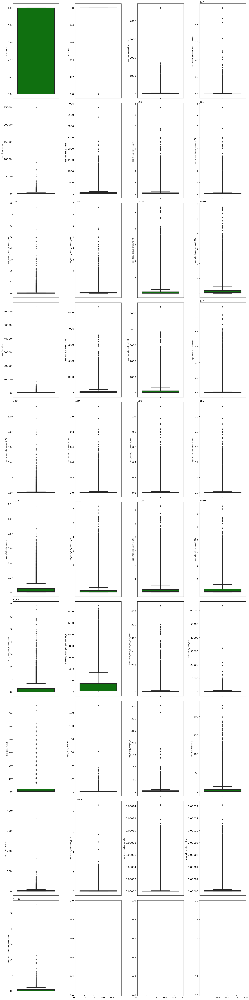

In [ ]:
import math

# Define the list of numerical features
features = numerical_cols

# Calculate the number of rows and columns needed for the subplot grid
num_cols = 4
num_rows = math.ceil(len(features) / num_cols)

# Create the subplot grid
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 8*num_rows))

# Loop over the features and create a boxplot for each one
for i, feature in enumerate(features):
    row_idx = i // num_cols
    col_idx = i % num_cols
    ax = axes[row_idx][col_idx]
    sns.boxplot(y=df_fraud[feature], color='green', orient='v', ax=ax)

# Adjust the spacing between the subplots
plt.tight_layout()

# Show the plot
plt.show()


- We can see many outliers in this dataset. In preprocessing stage, we need to remove this outlier

## Analisis Distplot - Distribusi Data pada Variabel-variabel Numerik

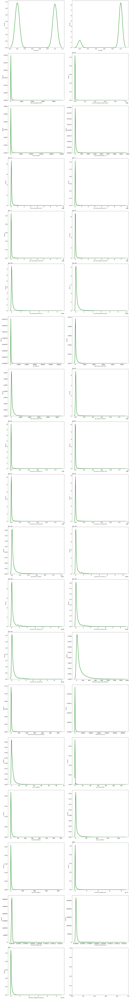

In [ ]:
import math

# Define the list of numerical features
features = numerical_cols

# Calculate the number of rows and columns needed for the subplot grid
num_cols = 2
num_rows = math.ceil(len(features) / num_cols)

# Create the subplot grid
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 8*num_rows))

# Loop over the features and create a density plot for each one
for i, feature in enumerate(features):
    row_idx = i // num_cols
    col_idx = i % num_cols
    ax = axes[row_idx][col_idx]
    sns.kdeplot(x=df_fraud[feature], color='green', ax=ax)
    ax.set_ylabel("Density")

# Adjust the spacing between the subplots
plt.tight_layout()

# Show the plot
plt.show()


Almost all the numerical values are right skewed.

<ipython-input-24-e2f2b9a6a1cd>:18: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data = df_fraud, x=df_fraud[feature], color='green', ax=ax,hue='is_scammer(cat)', fill='True' )


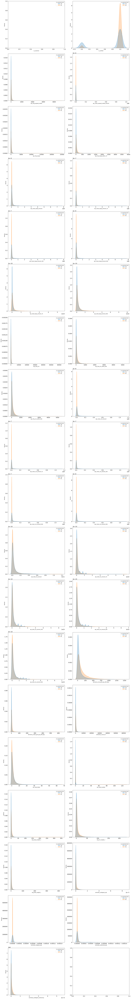

In [ ]:
import math

# Define the list of numerical features
features = numerical_cols

# Calculate the number of rows and columns needed for the subplot grid
num_cols = 2
num_rows = math.ceil(len(features) / num_cols)

# Create the subplot grid
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 8*num_rows))

# Loop over the features and create a density plot for each one
for i, feature in enumerate(features):
    row_idx = i // num_cols
    col_idx = i % num_cols
    ax = axes[row_idx][col_idx]
    sns.kdeplot(data = df_fraud, x=df_fraud[feature], color='green', ax=ax,hue='is_scammer(cat)', fill='True' )
    ax.set_ylabel("Density")

# Adjust the spacing between the subplots
plt.tight_layout()

# Show the plot
plt.show()


# KDEplot with Target Hue


- After differentiating scammer and not, we can see that several features are closely to normal distribution.

## Violinplot Analysis - Distribution Numerical Values

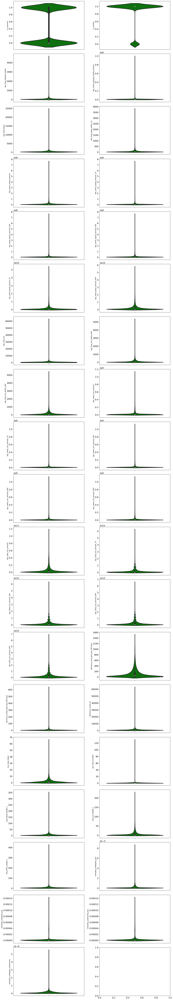

In [ ]:
import math

# Define the list of numerical features
features = numerical_cols

# Calculate the number of rows and columns needed for the subplot grid
num_cols = 2
num_rows = math.ceil(len(features) / num_cols)

# Specify the size of each subplot
height_ratio = 0.6  # 60% of the default height
width_ratio = 0.4  # 40% of the default width

# Create the subplot grid
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20*width_ratio*num_cols, 8*height_ratio*num_rows), 
                         gridspec_kw={'height_ratios': [height_ratio]*num_rows, 'width_ratios': [width_ratio]*num_cols})

# Loop over the features and create a violin plot for each one
for i, feature in enumerate(features):
    row_idx = i // num_cols
    col_idx = i % num_cols
    ax = axes[row_idx][col_idx]
    sns.violinplot(y=df_fraud[feature], color='green', ax=ax, orient='v')

# Adjust the spacing between the subplots
plt.tight_layout()

# Show the plot
plt.show()


Violin Plot is the combination of boxplot and distplot. Here, we can see the outliers.

# Multivariate Analysis

In [ ]:
#Buat data frame baru dimana variabel `ID` untuk sementara di drop
df_fraudcorr = df_fraud.drop(['uid'], axis=1)

## Correlation Heatmap

In [ ]:
df_fraudcorr.corr()

<ipython-input-27-4be391d446d1>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_fraudcorr.corr()


,is_scammer,is_verified,aqc_freq_prepaid_mobile,aqc_mean_prepaid_mobile_amount,aqc_freq_topup,aqc_freq_topup_within_7d,aqc_mean_topup_amount,aqc_mean_topup_amount_7d,aqc_mean_topup_amount_30d,aqc_mean_topup_amount_90d,aqc_total_topup_amount_7d,aqc_total_topup_amount_90d,aqc_freq_x2x,aqc_freq_x2x_within_60d,aqc_freq_x2x_within_90d,aqc_mean_x2x_amount,aqc_mean_x2x_amount_7d,aqc_mean_x2x_amount_30d,aqc_mean_x2x_amount_60d,aqc_mean_x2x_amount_90d,aqc_total_x2x_amount,aqc_total_x2x_amount_7d,aqc_total_x2x_amount_30d,aqc_total_x2x_amount_60d,aqc_total_x2x_amount_90d,dormancy_max_gmt_pay_diff_days,dormancy_mean_gmt_pay_diff_days,dormancy_count_trx,kyc_total_failed,kyc_total_revoked,avg_topup_weight_1,avg_x2x_weight_1,avg_other_weight_1,centrality_outdegree_p2p,centrality_indegree_p2p,centrality_undirected_p2p,centrality_outdegree_sendmoney
is_scammer,1.000000,-0.251413,-0.083324,0.044900,-0.096824,-0.176974,0.131478,0.111392,0.131155,0.145909,-0.169068,-0.125448,-0.029249,-0.111257,-0.066025,0.219635,0.172587,0.192482,0.207708,0.215319,0.091340,-0.027341,0.009174,0.050470,0.075329,-0.213872,-0.138489,-0.028576,0.035219,-0.013080,-0.090458,-0.058140,-0.085030,-0.090244,0.195156,0.172402,-0.150049
is_verified,-0.251413,1.000000,0.107495,-0.128481,0.168482,0.130996,0.040460,0.001978,0.005736,0.016104,0.129160,0.165859,0.158973,0.180031,0.197775,0.120295,0.096115,0.103249,0.108970,0.112045,0.202000,0.171257,0.189802,0.202792,0.207055,0.091600,-0.061836,0.155276,-0.157187,-0.066987,0.138103,0.172888,0.093771,0.140981,0.076590,0.100617,0.203016
aqc_freq_prepaid_mobile,-0.083324,0.107495,1.000000,0.036413,0.336191,0.221912,-0.052089,-0.059061,-0.065262,-0.068236,0.191314,0.229153,0.251177,0.223022,0.241479,-0.081349,-0.075845,-0.081812,-0.085707,-0.087247,0.166230,0.128165,0.128256,0.123729,0.121155,-0.037352,-0.078384,0.376302,0.011966,0.006491,0.159083,0.164703,0.236905,0.109297,-0.056634,-0.035668,0.153887
aqc_mean_prepaid_mobile_amount,0.044900,-0.128481,0.036413,1.000000,-0.040529,-0.032723,0.016872,0.018764,0.018484,0.018195,-0.018856,-0.025836,-0.039043,-0.043964,-0.049204,-0.027650,-0.022956,-0.023941,-0.025413,-0.025846,-0.042688,-0.035651,-0.040252,-0.043753,-0.045237,-0.023571,0.002264,-0.035386,0.027388,-0.001687,-0.044277,-0.046809,-0.033505,-0.039215,-0.026569,-0.033159,-0.042018
aqc_freq_topup,-0.096824,0.168482,0.336191,-0.040529,1.000000,0.602565,-0.060347,-0.073351,-0.080604,-0.082268,0.334664,0.419040,0.467292,0.424155,0.477812,-0.086090,-0.089647,-0.096354,-0.099645,-0.099915,0.342961,0.261244,0.273340,0.277838,0.281736,-0.032481,-0.114340,0.653629,0.016658,0.010758,0.696219,0.395163,0.319389,0.313888,-0.034444,0.024824,0.289753
aqc_freq_topup_within_7d,-0.176974,0.130996,0.221912,-0.032723,0.602565,1.000000,-0.034249,-0.009333,-0.018772,-0.026441,0.656761,0.616962,0.303662,0.642096,0.563483,-0.071019,-0.038853,-0.049308,-0.057443,-0.061612,0.257690,0.530743,0.502732,0.453437,0.413696,-0.009565,-0.066264,0.207925,-0.001623,0.002393,0.562121,0.318445,0.294712,0.248113,-0.043381,0.003678,0.278534
aqc_mean_topup_amount,0.131478,0.040460,-0.052089,0.016872,-0.060347,-0.034249,1.000000,0.912455,0.943599,0.969534,0.146212,0.168285,-0.065718,-0.068579,-0.080168,0.359870,0.522229,0.512322,0.474201,0.447124,0.042371,0.075230,0.075768,0.068101,0.060022,-0.068137,-0.024789,-0.073484,-0.035430,-0.007643,-0.079616,-0.090954,-0.089798,-0.084011,-0.066437,-0.080192,-0.047610
aqc_mean_topup_amount_7d,0.111392,0.001978,-0.059061,0.018764,-0.073351,-0.009333,0.912455,1.000000,0.975042,0.951673,0.138070,0.107003,-0.068002,-0.045510,-0.064676,0.333390,0.583504,0.539453,0.483008,0.448150,-0.019569,0.079761,0.066412,0.046639,0.031466,-0.071853,-0.008138,-0.090948,-0.026777,-0.006999,-0.068287,-0.074925,-0.073481,-0.066488,-0.048810,-0.059831,-0.050851
aqc_mean_topup_amount_30d,0.131155,0.005736,-0.065262,0.018484,-0.080604,-0.018772,0.943599,0.975042,1.000000,0.981458,0.131067,0.113766,-0.074193,-0.052405,-0.071293,0.343695,0.567004,0.552932,

<Axes: >

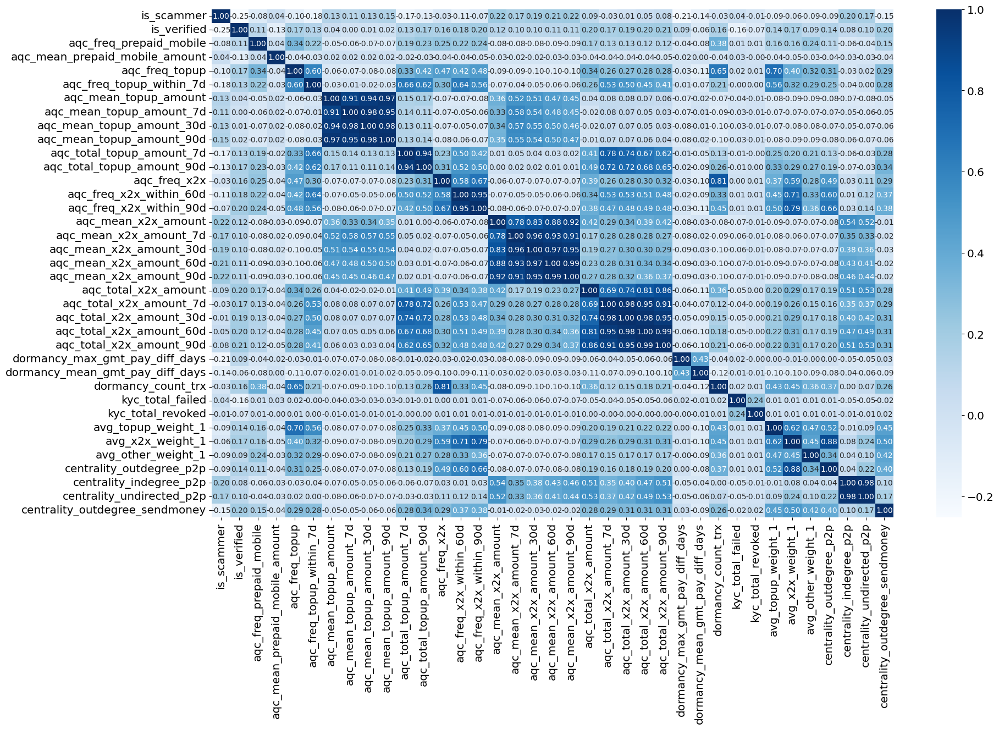

In [ ]:
# correlation heatmap
plt.figure(figsize=(20, 12))
sns.heatmap(df_fraudcorr.corr(numeric_only=True), cmap='Blues', annot=True, fmt='.2f')


- There are many redundant features because they have high correlation (0.7). In the later stage, we can drop these features from our data frame

## Pair Plot (Will be done after removing several columns)

In [ ]:
# # Pair Plot
# plt.figure(figsize=(20, 12))
# sns.pairplot(df_fraudcorr, diag_kind='kde')

In [ ]:
# # di sini kita juga hanya menggunakan sample dari full dataset
# plt.figure(figsize=(15, 15))
# sns.pairplot(df_shippingcorr, diag_kind='kde', hue='Late_Shipment(cat)')

## Kendall

In [ ]:
corr = df_fraudcorr.corr(method='kendall',numeric_only=True)

<Axes: >

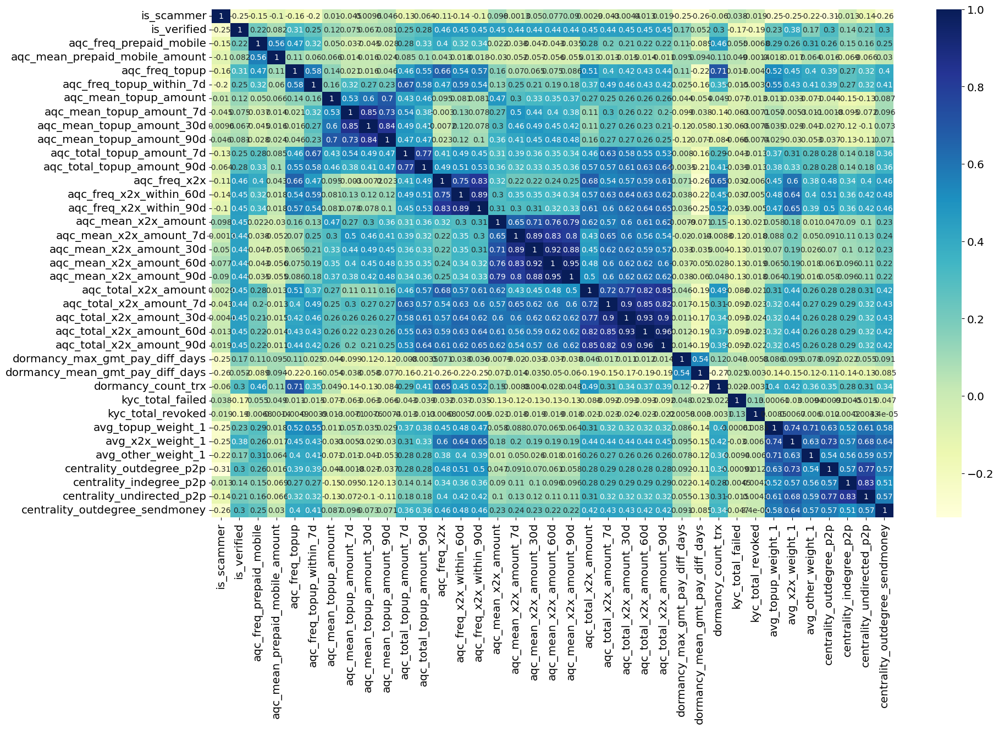

In [ ]:
plt.figure(figsize=(20, 12))
sns.heatmap(corr, 
           xticklabels=corr.columns.values, 
           yticklabels=corr.columns.values, 
           cmap="YlGnBu",
          annot=True)

# Business Insights

## 1. Exploratory Data Analysis
EDA conducted includes:
1. Does the unverified status of an account indicate whether the account is fraudulent or not?
2. What Does the Maximum Days of Dormancy Show About Fraudsters
3. What Does Total Topup Amount for the Last 90 Days Show About Fraudsters
4. Does the Existence of null values in User Data Correlates with whether the Account is Fraudulent or not?
5. How is the Distribution of Fraudulent vs Non-Fraudulent account lifetime?
6. How Centrality In-/Outdegree correlates with Fraudulent?Non-Fraudulent users?


### 1.1 Does the unverified status of an account indicate whether the account is fraudulent or not?

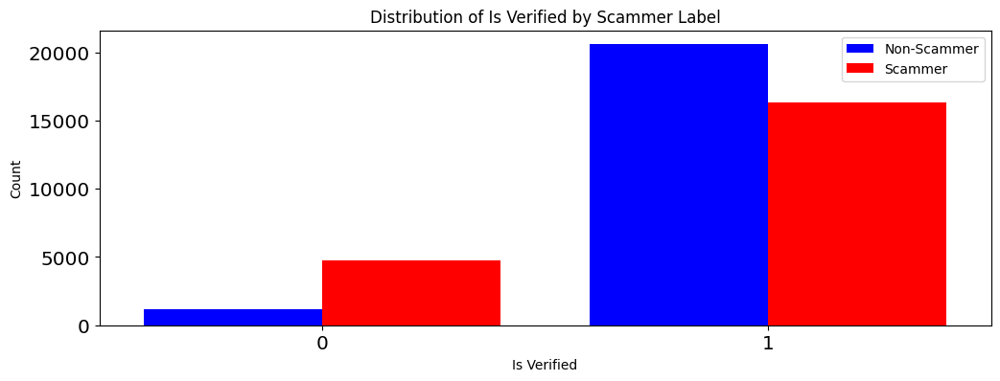

In [ ]:
# Filter for scammers and non-scammers
scammer_data = df_fraud[df_fraud['is_scammer'] == 1]
non_scammer_data = df_fraud[df_fraud['is_scammer'] == 0]

# Plot stacked bar chart
sns.countplot(x="is_verified", hue="is_scammer", data=df_fraud, palette={0: "blue", 1: "red"}, saturation=1)

# Fix the legend labels
legend_labels = ['Non-Scammer', 'Scammer']
handles, _ = plt.gca().get_legend_handles_labels()
plt.legend(handles, legend_labels, loc='upper right')

# Add labels
plt.xlabel('Is Verified')
plt.ylabel('Count')
plt.title('Distribution of Is Verified by Scammer Label')

# Display the plot
plt.show()


In [ ]:
# Group by is_verified and is_scammer and get counts
counts = df_fraud.groupby(['is_verified', 'is_scammer']).size().reset_index(name='count')

# Pivot the table to get the desired format
counts_pivot = counts.pivot(index='is_verified', columns='is_scammer', values='count')

# Add row and column totals
counts_pivot.loc['Total'] = counts_pivot.sum()
counts_pivot['Total'] = counts_pivot.sum(axis=1)

# Change the column names
counts_pivot.columns = ['non fraud', 'is fraud', 'Total']

# Change the index names
counts_pivot = counts_pivot.rename(index={0: 'not_verified', 1: 'is_verified'})

# Display the table
print(tabulate(counts_pivot, headers='keys', tablefmt='psql'))


+---------------+-------------+------------+---------+
| is_verified   |   non fraud |   is fraud |   Total |
|---------------+-------------+------------+---------|
| not_verified  |        1141 |       4778 |    5919 |
| is_verified   |       20579 |      16361 |   36940 |
| Total         |       21720 |      21139 |   42859 |
+---------------+-------------+------------+---------+


The distribution of not verified accounts between fraudulent and non-fraudulent accounts is significantly different, with only 1,141 non-fraudulent accounts being not verified compared to 4,778 fraudulent accounts (a ratio of 1.1:4.7). 

We aim to analyze and prove our hypothesis that the not verified label has a significant impact on whether an account is identified as a scammer.

Since there are only two categories in the 'not_verified' feature (0 and 1), we can use the chi-squared test to investigate the relationship between the 'not_verified' label and whether an account is classified as a scammer, and to test our hypothesis.

**"H0: There is no significant relationship between is_not_verified and is_scammer (alpha = 0.05)"**






In [ ]:
from sklearn.feature_selection import chi2

df_fraud_data = df_fraud.copy()
df_fraud_target = df_fraud['is_scammer']
df_fraud_data.drop(['is_scammer'], axis=1,inplace=True)

In [ ]:
df_fraud_data['is_not_verified'] = df_fraud_data['is_verified'].apply(lambda x: 1 if x == 0 else 0)
df_fraud_data[['is_verified', 'is_not_verified']].head()

,is_verified,is_not_verified
0,1,0
1,1,0
2,1,0
3,0,1
4,0,1


In [ ]:
is_not_verified = pd.DataFrame(df_fraud_data,columns=['is_not_verified'])
chi2_res, p_values = chi2(is_not_verified, df_fraud_target)
print(f"chi2 value of not_verified feature in relation to is_fraud {chi2_res[0]}")
print(f"p_values {p_values[0]}")

chi2 value of not_verified feature in relation to is_fraud 2334.9216599758192
p_values 0.0


A p-value of 0 indicates that the observed result (the relationship between not_verified and is_fraud) is statistically significant, which means that it is unlikely to have occurred by chance alone. This result suggests that there is a strong association between not_verified and being a fraudster.

### 1.2. What Does the Maximum Days of Dormancy Show About Fraudsters

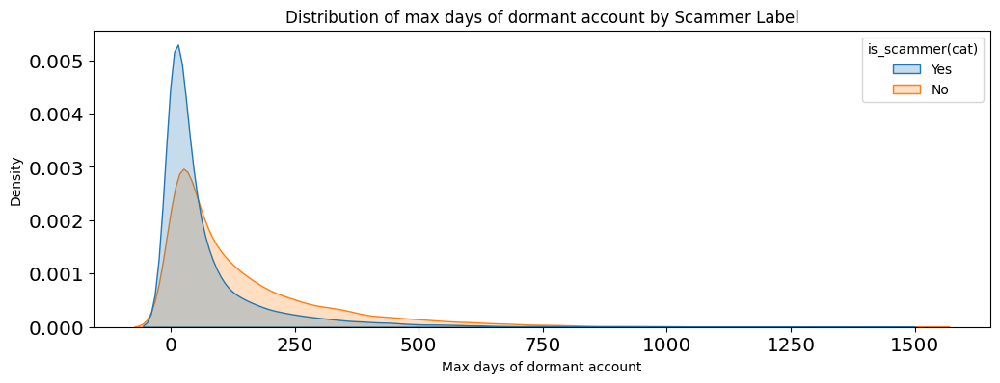

In [ ]:
sns.kdeplot(data = df_fraud, x=df_fraud['dormancy_max_gmt_pay_diff_days'], color='green',hue='is_scammer(cat)', fill='True' )
# Add a legend and labels
plt.xlabel('Max days of dormant account')
plt.ylabel('Density')
plt.title('Distribution of max days of dormant account by Scammer Label')

# Display the plot
plt.show()

In [ ]:
# Mean of max dormancy for fraudster
mean_fraudster = df_fraud[df_fraud['is_scammer'] == 1]['dormancy_max_gmt_pay_diff_days'].mean()

# Mean of max dormancy for non-fraudster
mean_non_fraudster = df_fraud[df_fraud['is_scammer'] == 0]['dormancy_max_gmt_pay_diff_days'].mean()

# Median of max dormancy for fraudster
median_fraudster = df_fraud[df_fraud['is_scammer'] == 1]['dormancy_max_gmt_pay_diff_days'].median()

# Median of max dormancy for non-fraudster
median_non_fraudster = df_fraud[df_fraud['is_scammer'] == 0]['dormancy_max_gmt_pay_diff_days'].median()

print(f"Mean of max dormancy for fraudster: {mean_fraudster:.2f} days")
print(f"Mean of max dormancy for non-fraudster: {mean_non_fraudster:.2f} days")
print(f"Median of max dormancy for fraudster: {median_fraudster} days")
print(f"Median of max dormancy for non-fraudster: {median_non_fraudster} days")


Mean of max dormancy for fraudster: 78.04 days
Mean of max dormancy for non-fraudster: 148.06 days
Median of max dormancy for fraudster: 29.0 days
Median of max dormancy for non-fraudster: 81.0 days


the KDE plot of max days of dormant account for scammers is sharp and higher on zero, it indicates that scammers are more active on the app, and they do not let their account stay dormant for too long. On the other hand, if the KDE plot of max days of dormant account for non-scammers is more sloped and concentrated slightly to the right, it suggests that non-scammers tend to use the app less frequently or have accounts that stay dormant for longer periods. Therefore, a sharper and higher peak in the KDE plot for scammers indicates a potential pattern that can be used to identify and flag suspicious accounts.


### 1.3. What Does Total Topup Amount for the Last 90 Days Show About Fraudsters

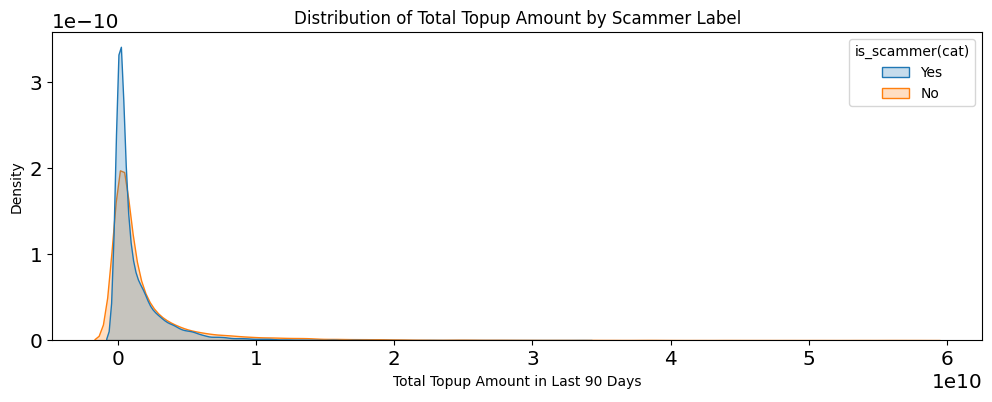

In [ ]:
sns.kdeplot(data = df_fraud, x=df_fraud['aqc_total_topup_amount_90d'], color='green',hue='is_scammer(cat)', fill='True' )
# Add a legend and labels
plt.xlabel('Total Topup Amount in Last 90 Days')
plt.ylabel('Density')
plt.title('Distribution of Total Topup Amount by Scammer Label')

# Display the plot
plt.show()

In [ ]:
# Calculate mean and median of 'aqc_total_topup_amount_90d' for fraudster and non-fraudster
mean_non_fraudster = df_fraud[df_fraud['is_scammer'] == 0]['aqc_total_topup_amount_90d'].mean() / 1e9
mean_fraudster = df_fraud[df_fraud['is_scammer'] == 1]['aqc_total_topup_amount_90d'].mean() / 1e9
median_non_fraudster = df_fraud[df_fraud['is_scammer'] == 0]['aqc_total_topup_amount_90d'].median() / 1e9
median_fraudster = df_fraud[df_fraud['is_scammer'] == 1]['aqc_total_topup_amount_90d'].median() / 1e9

# Print the results
print(f"Mean total top-up amount (last 90 days) for non-fraudster: {mean_non_fraudster:.2f}e9")
print(f"Mean total top-up amount (last 90 days) for fraudster: {mean_fraudster:.2f}e9")
print(f"Median total top-up amount (last 90 days) for non-fraudster: {median_non_fraudster:.2f}e9")
print(f"Median total top-up amount (last 90 days) for fraudster: {median_fraudster:.2f}e9")


Mean total top-up amount (last 90 days) for non-fraudster: 2.08e9
Mean total top-up amount (last 90 days) for fraudster: 1.26e9
Median total top-up amount (last 90 days) for non-fraudster: 0.59e9
Median total top-up amount (last 90 days) for fraudster: 0.43e9


From the kde plot, we can infer that there is some overlap between the total topup amount of scammer and non-scammer accounts, as both have a similar kdeplot. However, scammer accounts tend to have a higher peak of density, while non-scammer accounts have a more gradual slope and a lower peak of density.

Looking at the mean and median values of the total top-up amount, we can see that non-fraudster accounts have a higher mean and median value than fraudster accounts. This could suggest that non-fraudster accounts are more likely to make larger top-up transactions over the last 90 days than fraudster accounts. However, we should keep in mind that there is some overlap between the two groups and that other factors may also contribute to the likelihood of an account being fraudulent.

### 1.4 Does the Existence of null values in User Data Correlates with whether the Account is Fraudulent or not?

In [ ]:
df_fraud = df_fraud[df_fraud['source'].apply(lambda x : x in channel)]
df_fraud['source'].value_counts()

CS_REPORT_SCAMMER               12577
CS_REPORT_VICTIM                11353
INCOMPLETE_CS_REPORT_VICTIM     10367
INCOMPLETE_CS_REPORT_SCAMMER     8562
Name: source, dtype: int64

In [ ]:
null_percentage = df_fraud.isnull().sum() / df_fraud.shape[0] * 100
null_percentage = null_percentage[[col for col in null_percentage.index if null_percentage[col] > 0.0]]
col_w_null = null_percentage.index

print("-- Columns with non-zero null values --\n")
null_percentage

-- Columns with non-zero null values --



registereddate                      0.212324
birthday                           13.801069
gender                             13.126765
job_position                       13.801069
dormancy_max_gmt_pay_diff_days      1.187615
dormancy_mean_gmt_pay_diff_days     1.187615
kyc_total_failed                    8.215311
kyc_total_revoked                   8.215311
dtype: float64

Value count for is_scammer for rows with null values:
1    4840
0    1234
Name: is_scammer, dtype: int64



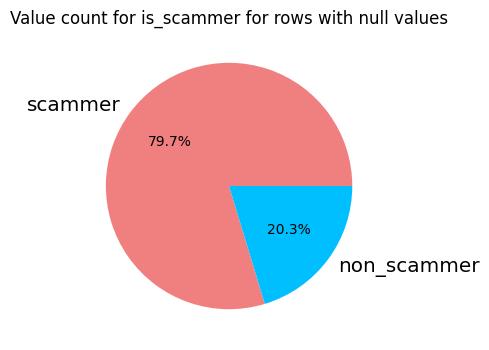

Value count for is_scammer for rows without null values:
0    20486
1    16299
Name: is_scammer, dtype: int64



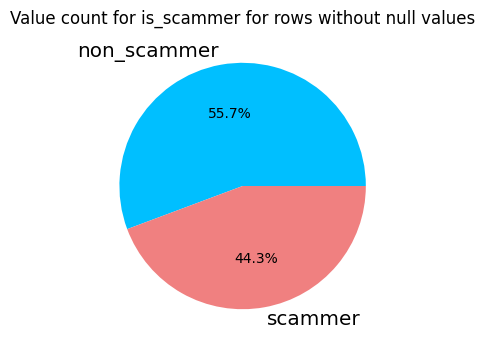

In [ ]:
from sklearn.feature_selection import chi2

# Hitung value counts is_scammer untuk data row yang memiliki nilai null
has_null = df_fraud.isnull().sum(axis=1) != 0
val_cnt = df_fraud['is_scammer'][has_null].value_counts()
print(f"Value count for is_scammer for rows with null values:\n{val_cnt}\n")

# Tampilkan pie chart yang menampilkan persentase row has_null terhadap nilai is_scammer
plt.title("Value count for is_scammer for rows with null values")
plt.pie(df_fraud['is_scammer'][has_null].value_counts(), labels=['scammer', 'non_scammer'], colors=['lightcoral', 'deepskyblue'], autopct='%1.1f%%')
plt.show()


# Hitung value counts is_scammer untuk data row yang memiliki nilai null
val_cnt = df_fraud['is_scammer'][~has_null].value_counts()
print(f"Value count for is_scammer for rows without null values:\n{val_cnt}\n")

# Tampilkan pie chart yang menampilkan persentase row has_null terhadap nilai is_scammer
plt.title("Value count for is_scammer for rows without null values")
plt.pie(df_fraud['is_scammer'][~has_null].value_counts(), labels=['non_scammer', 'scammer'], colors=['deepskyblue', 'lightcoral'], autopct='%1.1f%%')
plt.show()

The dataset reveals a notable trend where the rows with null values are predominantly occupied by scammers, while rows without null values are predominantly associated with non-scammer accounts. To assess the significance of this observation, we aim to employ a hypothesis testing approach employing the chi-squared test.


**H0** : The existence of null values does not correlates with is_scammer feature ($\alpha = 0.05$)

In [ ]:
null_scammer = pd.concat([has_null.astype(int).to_frame(), df_fraud['is_scammer']], axis=1)
null_scammer = null_scammer.groupby(0).value_counts()
null_scammer

0  is_scammer
0  0             20486
   1             16299
1  1              4840
   0              1234
dtype: int64

In [ ]:
contingency_table = pd.concat([null_scammer[0], null_scammer[1]], axis=1)
contingency_table

,0,1
is_scammer,,
0,20486,1234
1,16299,4840


In [ ]:
from scipy.stats import chi2_contingency

result = chi2_contingency(contingency_table)

print(f"Chi-Squared value of the contingency table {result.statistic}")
print(f"Nilai p_values {result.pvalue}")

Chi-Squared value of the contingency table 2608.570527546277
Nilai p_values 0.0



Upon observation, we find that the p-value is lower than the chosen significance level (alpha). As a result, we can reject the null hypothesis (H0) and draw the conclusion that there is a significant relationship between the `has_null` attribute and the `is_scammer` attribute.

### 1.5 How is the Distribution of Fraudulent vs Non-Fraudulent account lifetime?

In [ ]:
# account lifetime
acc_lft = (
    (df_fraud["trx_date"].astype("datetime64[ns]")) - (df_fraud["registereddate"].astype("datetime64[ns]"))
    ).dt.days

acc_lft

0          132.0
1           37.0
2           46.0
3           18.0
4           18.0
           ...  
398317    1367.0
398326    1477.0
398329    1420.0
398330     890.0
398331    1335.0
Length: 42859, dtype: float64

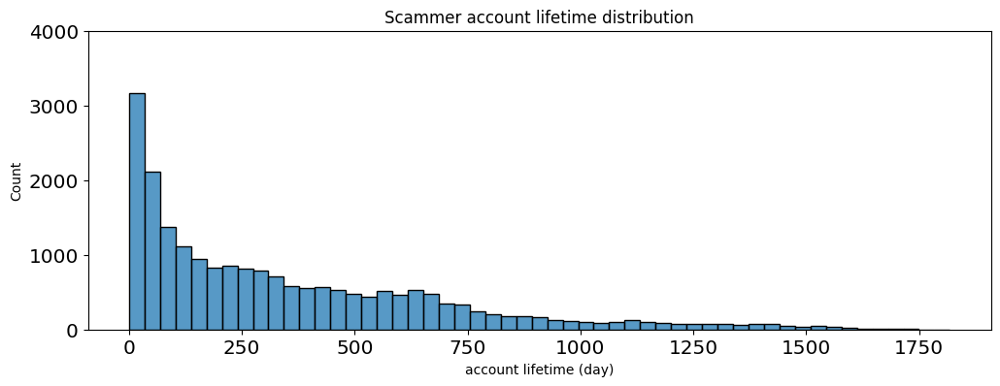

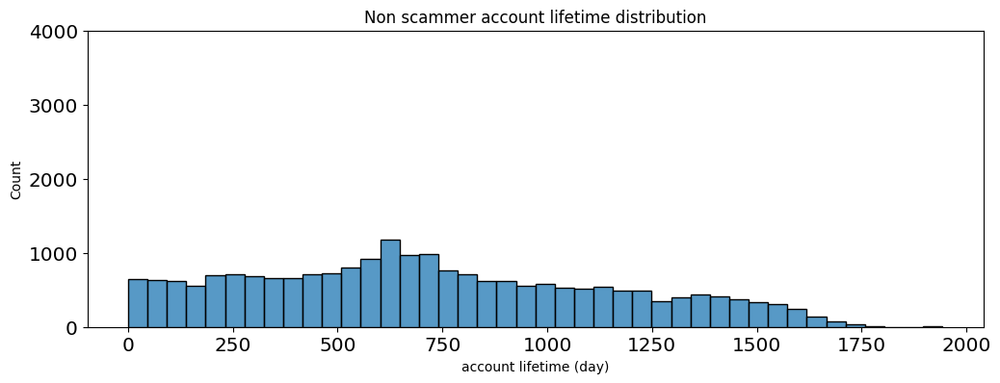

In [ ]:
sns.histplot(acc_lft[df_fraud['is_scammer'] == 1])
plt.title("Scammer account lifetime distribution")
plt.ylim(0, 4000)
plt.xlabel('account lifetime (day)')
plt.show()

sns.histplot(acc_lft[df_fraud['is_scammer'] == 0])
plt.title("Non scammer account lifetime distribution")
plt.ylim(0, 4000)
plt.xlabel('account lifetime (day)')
plt.show()

The distribution of account lifetimes among scammers exhibits a notable positive skew, indicating that a majority of their accounts have relatively young lifetimes. In contrast, the distribution of account lifetimes for non-scammer accounts appears to be relatively uniform, suggesting that non-scammers tend to have relatively older account lifetimes. Based on these observations, we can conclude that there is a distinction between scammers and non-scammers in terms of their account lifetimes.

### 1.6 How Centrality In-/Outdegree correlates with Fraudulent?Non-Fraudulent users?

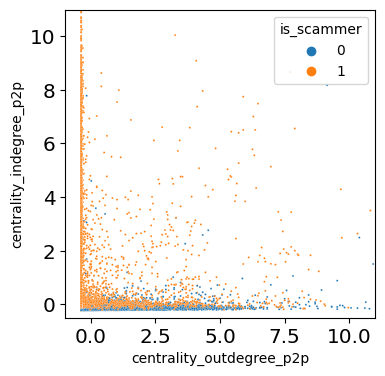

In [ ]:
from sklearn.preprocessing import StandardScaler

columns = ['centrality_outdegree_p2p','centrality_indegree_p2p']
degrees = StandardScaler().fit_transform(df_fraud[columns])
degrees = pd.DataFrame(degrees, columns = columns, index=df_fraud.index)

plt.figure(figsize=(4,4))
sns.scatterplot(data=degrees, x='centrality_outdegree_p2p', y='centrality_indegree_p2p', hue=df_fraud['is_scammer'], s=2)
plt.xlim(-1,11)
plt.ylim(-0.5,11)
plt.show()

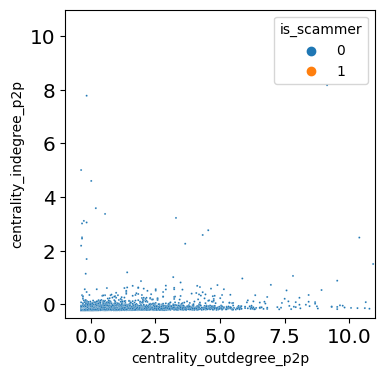

In [ ]:
plt.figure(figsize=(4,4))
sns.scatterplot(data=degrees[df_fraud['is_scammer'] == 0], x='centrality_outdegree_p2p', y='centrality_indegree_p2p', hue=df_fraud['is_scammer'], s=2)
plt.xlim(-1,11)
plt.ylim(-0.5,11)
plt.show()

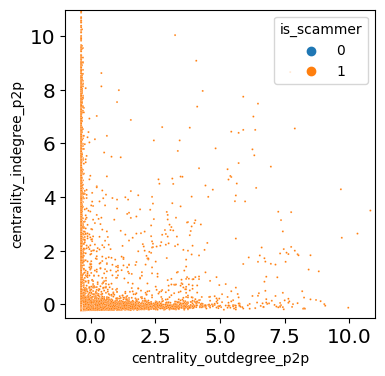

In [ ]:
plt.figure(figsize=(4,4))
sns.scatterplot(data=degrees[df_fraud['is_scammer'] == 1], x='centrality_outdegree_p2p', y='centrality_indegree_p2p', hue=df_fraud['is_scammer'], s=2)
plt.xlim(-1,11)
plt.ylim(-0.5,11)
plt.show()

Based on the provided scatter plot, we can identify three distinct user groups. The first group comprises users with a high number of inward transactions but a remarkably low number of outward transactions, which we shall refer to as "group-1" users. The second group consists of users with a high number of outward transactions but a relatively low number of inward transactions, denoted as "group-2" users. Aditionally, there exists a third group of users characterized by a relatively modest disparity between their inward and outward transactions, which we shall refer to as "group-3".

Upon further examination, we observe that scammers are present in both all groups, whereas non-scammers are predominantly found in group-2 and group-3, with only a few instances in group-1. Based on this observation, we can infer that **if a user belongs to group-1 (high inward, low outward), there is a high probability that they are a scammer**.


By utilizing the inward/outward ratio as a criterion, we can partition all groups into three distinct categories. The first group consists of users with a significantly high ratio, indicating a substantial difference between inward and outward transactions. The second group encompasses users with a considerably low ratio, indicating a notable disparity in the opposite direction. Lastly, the third group comprises users with a ratio around one, indicating a relatively balanced relationship between inward and outward transactions.

To determine the probability of a user from each group being a scammer, we must calculate the proportion of scammers within each partition. By comparing the number of scammer users in each group to the total number of users in that respective group, we can obtain the probability of a user from each group being classified as a scammer. This analysis will provide insights into the likelihood of users from each group being associated with scamming activities.

In [ ]:
def assign_group(in_, out_, threshold):
  """Assign a group to a data based on the ratio of in_ / out_"""
  if in_ > out_ * threshold:
    return 1
  elif in_ * threshold < out_:
    return 2
  else:
    return 3

user_group = df_fraud[['centrality_indegree_p2p', 'centrality_outdegree_p2p']].apply(
      lambda row : assign_group(row['centrality_indegree_p2p'], row['centrality_outdegree_p2p'], 4),
      axis=1
  )

user_group

0         1
1         1
2         1
3         3
4         3
         ..
398317    2
398326    2
398329    3
398330    3
398331    3
Length: 42859, dtype: int64

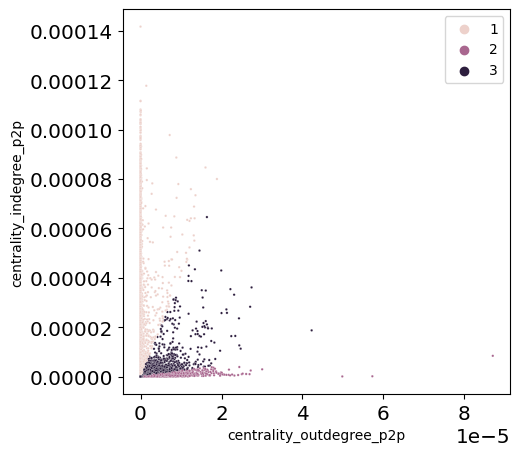

In [ ]:
plt.figure(figsize=(5,5))

sns.scatterplot(data=df_fraud[['centrality_indegree_p2p', 'centrality_outdegree_p2p']], 
                x = 'centrality_outdegree_p2p', y = 'centrality_indegree_p2p',
                hue = user_group, s=3)
plt.show()

In [ ]:
group1_size = (user_group == 1).sum()
group2_size = (user_group == 2).sum()
group3_size = (user_group == 3).sum()

scammer_group1 = user_group[user_group == 1][df_fraud['is_scammer'] == 1].shape[0]
scammer_group2 = user_group[user_group == 2][df_fraud['is_scammer'] == 1].shape[0]
scammer_group3 = user_group[user_group == 3][df_fraud['is_scammer'] == 1].shape[0]

p1 = scammer_group1 / group1_size
p2 = scammer_group2 / group2_size
p3 = scammer_group3 / group3_size

print(f"The probability of group-1 being a scammer is {scammer_group1}/{group1_size} = {p1}")
print(f"The probability of group-2 being a scammer is {scammer_group2}/{group2_size} = {p2}")
print(f"The probability of group-3 being a scammer is {scammer_group3}/{group3_size} = {p3}")

The probability of group-1 being a scammer is 4381/5453 = 0.8034109664404915
The probability of group-2 being a scammer is 1014/8510 = 0.1191539365452409
The probability of group-3 being a scammer is 15744/28896 = 0.5448504983388704


From the statistics above, we can see that the majority of group-1 is scammer (80 % of them are scammers), the majority of group-2 is non-scammer (only 12 % of them are scammers), and is equally likely for group-3. Because this feature can separate between scammers and non scammers, we can consider to add this feature to our model later.

### 1.7 What does job position tells about fraudsters?

In [ ]:
map = {
 'PELAJAR / MAHASISWA': 'PELAJAR / MAHASISWA',
 'MENGURUS RUMAH TANGGA': 'MENGURUS RUMAH TANGGA',
 'BELUM / TIDAK BEKERJA': 'BELUM / TIDAK BEKERJA',
 'KARYAWAN SWASTA': 'KARYAWAN SWASTA',
 'WIRASWASTA': 'WIRASWASTA',
 'BURUH HARIAN LEPAS': 'BURUH HARIAN LEPAS',
 'PETANI / PEKEBUN': 'PETANI / PEKEBUN',
 'PEDAGANG': 'PEDAGANG',
 'PEGAWAI NEGERI SIPIL': 'PEKERJA PEMERINTAH',
 '13': '<NUMBER>',
 'BURUH TANI / PERKEBUNAN': 'PETANI / PEKEBUN',
 'KARYAWAN HONORER': 'KARYAWAN HONORER',
 'GURU': 'GURU',
 'PERDAGANGAN': 'PEDAGANG',
 'KARYAWAN BUMN': 'PEKERJA PEMERINTAH',
 '131': '<NUMBER>',
 'SOPIR': 'SOPIR',
 'NELAYAN / PERIKANAN': 'NELAYAN / PERIKANAN',
 'PEKERJAAN LAINNYA': 'OTHERS',
 '110': '<NUMBER>',
 '16': '<NUMBER>',
 'PENSIUN': 'PENSIUN',
 'KEPOLISIAN RI': 'PEKERJA PEMERINTAH',
 'BIDAN': 'BIDAN',
 'TENTARA NASIONAL INDONESIA': 'PEKERJA PEMERINTAH',
 'PERAWAT': 'PERAWAT',
 'PERANGKAT DESA': 'PEKERJA PEMERINTAH',
 'TUKANG JAHIT': 'TUKANG JAHIT',
 'TUKANG KAYU': 'TUKANG KAYU',
 'DOKTER': 'DOKTER',
 'MEKANIK': 'MEKANIK',
 'KARYAWAN BUMD': 'PEKERJA PEMERINTAH',
 'DOSEN': 'DOSEN',
 'PEMBANTU RUMAH TANGGA': 'PEMBANTU RUMAH TANGGA',
 '156': '<NUMBER>',
 '114': '<NUMBER>',
 'TUKANG BATU': 'TUKANG BATU',
 'PELAUT': 'PELAUT',
 'PELAJAR/MAHASISWA': 'PELAJAR / MAHASISWA',
 'INDUSTRI': 'INDUSTRI',
 'WARTAWAN': 'WARTAWAN',
 'PETERNAK': 'PETERNAK',
 'SENIMAN': 'SENIMAN',
 'TUKANG LAS / PANDAI BESI': 'TUKANG LAS / PANDAI BESI',
 'PENATA RAMBUT': 'PENATA RAMBUT',
 'TRANSPORTASI': 'TRANSPORTASI',
 'KONSTRUKSI': 'KONSTRUKSI',
 'PENDETA': 'PENDETA',
 'BURUH NELAYAN / PERIKANAN': 'BURUH NELAYAN / PERIKANAN',
 'PENGACARA': 'PENGACARA',
 'PENSIUNAN': 'PENSIUNAN',
 'USTADZ / MUBALIGH': 'USTADZ / MUBALIGH',
 'TUKANG CUKUR': 'TUKANG CUKUR',
 'KONSULTAN': 'KONSULTAN',
 'BELUM TIDAK BEKERJA': 'BELUM / TIDAK BEKERJA',
 'WIRASWASAT': 'WIRASWASTA',
 '68': '<NUMBER>',
 'BELUM/TIDAK BEKERJA': 'BELUM / TIDAK BEKERJA',
 'APOTEKER': 'APOTEKER',
 'TUKANG LISTRIK': 'TUKANG LISTRIK',
 'ANGGOTA LEMBAGA TINGGI LAINNYA': 'PEKERJA PEMERINTAH',
 'PILOT': 'PILOT',
 'WIRASAWSTA': 'WIRASWASTA',
 'WIRSWASTA': 'WIRASWASTA',
 'WIASRWASTA': 'WIRASWASTA',
 'WIRASWATA': 'WIRASWASTA',
 'WIRAWASTA': 'WIRASWASTA',
 'MENGURUS RUMAH': 'MENGURUS RUMAH TANGGA',
 'PEKERJAAN LAINNTA': 'OTHERS',
 'PENATA RIAS': 'PENATA RIAS',
 '126': '<NUMBER>',
 '112': '<NUMBER>',
 'PENTERJEMAH': 'PENTERJEMAH',
 'NOTARIS': 'NOTARIS',
 'PEKERJA LAINNYA': 'OTHERS',
 'WIRASWSASTA': 'WIRASWASTA',
 'PERANCANG BUSANA': 'PERANCANG BUSANA',
 'PEKERJAAN LAINYYA': 'OTHERS',
 'SWASTA': 'KARYAWAN SWASTA',
 'AKUNTAN': 'AKUNTAN',
 'GUBERNUR': 'PEKERJA PEMERINTAH',
 'WIARSWASTA': 'WIRASWASTA',
 'PELAJAR MAHASISWA' : 'PELAJAR / MAHASISWA',
 'OTHERS': 'OTHERS',
 np.nan : 'NULL'
 }

low_count_job = df_fraud['job_position'].value_counts() <= 100
low_count_job = low_count_job[low_count_job].index

In [ ]:
# Map incorrect categories
user_job = df_fraud.job_position.apply(lambda s : map[s])

# Eliminate categories with low cardinalities
user_job = user_job.apply(lambda x : 'OTHERS' if x in low_count_job else x)
user_job.value_counts()

PELAJAR / MAHASISWA      16845
NULL                      5915
MENGURUS RUMAH TANGGA     5411
BELUM / TIDAK BEKERJA     4548
KARYAWAN SWASTA           3661
WIRASWASTA                2820
BURUH HARIAN LEPAS        1308
PETANI / PEKEBUN           949
OTHERS                     352
PEKERJA PEMERINTAH         289
<NUMBER>                   277
PEDAGANG                   256
KARYAWAN HONORER           120
GURU                       108
Name: job_position, dtype: int64

In [ ]:
scammer_percentage = (user_job[df_fraud.is_scammer == 1].value_counts()) / (user_job.value_counts()) * 100
scammer_percentage.sort_values(ascending=False)

NULL                     80.710059
PETANI / PEKEBUN         72.286617
MENGURUS RUMAH TANGGA    72.278692
<NUMBER>                 65.703971
PEDAGANG                 51.953125
BURUH HARIAN LEPAS       49.006116
OTHERS                   46.875000
WIRASWASTA               45.567376
BELUM / TIDAK BEKERJA    43.997361
KARYAWAN HONORER         40.833333
GURU                     37.037037
KARYAWAN SWASTA          35.618683
PELAJAR / MAHASISWA      34.847136
PEKERJA PEMERINTAH       33.910035
Name: job_position, dtype: float64

From the statistics above, we can observer that for most of category, The ratio of scammers and non scammers from the dataset are almost equal except on some job positions.

Job Position with high probability of being fraudulent:
1. NULL : 80%
2. PETANI / PEKEBUN : 72%
3. MENGURUS RUMAH TANGGA : 72%

Job Position with low probabilit of being fraudulent:
1. GURU : 37%
2. KARYAWAN SWASTA : 35%
3. PELAJAR / MAHASISWA : 35%

## 2. Data Preprocessing
Several data preprocessing steps will be performed, such as 
1. Train-Dev-Test Split
1. checking and handling data duplication, 
2. checking and handling null values (categorical & numerical).
3. fixing the 'job_position' column so that there are no duplicate categories
4. Remove features that exhibit high correlation with one another, for instance, '7d', '30d', and '90d

### 2.1 Train-Dev-Test Split 

In [ ]:
from sklearn.model_selection import train_test_split

# Reimport dataset
df_fraud = pd.read_csv(url_dataset)
channel = ['INCOMPLETE_CS_REPORT_VICTIM', 'INCOMPLETE_CS_REPORT_SCAMMER', 'CS_REPORT_SCAMMER', 'CS_REPORT_VICTIM']
df_fraud = df_fraud[df_fraud['source'].apply(lambda x : x in channel)]
df_fraud['source'].value_counts()

# Set split ratio
TRAIN_SIZE, VAL_SIZE, TEST_SIZE = 0.7, 0.1, 0.2
VAL_SIZE = VAL_SIZE / (VAL_SIZE + TEST_SIZE)

# Split dataset into train and test
df_fraud, df_fraud_val, y, y_val = train_test_split(df_fraud.drop(['is_scammer'], axis=1), df_fraud['is_scammer'],
                                                    train_size = TRAIN_SIZE, random_state = 210301)

### 2.2 Checking and handling data duplication

In [ ]:
# checking number of rows
num_rows = df_fraud.shape[0]

print("Number of rows:", num_rows)

Number of rows: 30001


In [ ]:
# checking data duplication
duplicated_index = df_fraud.duplicated()
duplicated_index = duplicated_index[duplicated_index].index
len(duplicated_index)

47

There are 47 instances of data duplication that need to be handled

In [ ]:
duplicates = df_fraud[df_fraud.duplicated()]

In [ ]:
if not duplicates.empty:
  df_fraud.drop(labels=duplicated_index, inplace=True)
  y.drop(labels=duplicated_index, inplace=True)

In [ ]:
# checking data duplication
df_fraud.duplicated().sum()

0

In [ ]:
# checking number of rows
num_rows = df_fraud.shape[0]
print("Number of rows:", num_rows)

Number of rows: 29954


In [ ]:
# checking data duplication
duplicated_count = df_fraud.duplicated().sum()
print(f"Number of duplicated rows: {duplicated_count}")


# checking number of rows
num_rows = df_fraud.shape[0]
print("Number of rows:", num_rows)


# checking data loss percentage
duplicate_percentage = (duplicated_count/num_rows) * 100

print("duplicate row percentage that has been dropped = ", duplicate_percentage, "%")

Number of duplicated rows: 0
Number of rows: 29954
duplicate row percentage that has been dropped =  0.0 %


The 73 duplicated rows can be dropped as they do not significantly affect the entire dataset, which is 0.17%, which is less than 5%.

### 2.3 .Checking and handling null values (categorical & numerical).

In [ ]:
df_fraud.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29954 entries, 368685 to 79270
Data columns (total 44 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   uid                              29954 non-null  object 
 1   source                           29954 non-null  object 
 2   trx_date                         29954 non-null  object 
 3   report_date                      29954 non-null  object 
 4   registereddate                   29895 non-null  object 
 5   birthday                         25834 non-null  object 
 6   gender                           26033 non-null  object 
 7   job_position                     25834 non-null  object 
 8   is_verified                      29954 non-null  int64  
 9   aqc_freq_prepaid_mobile          29954 non-null  int64  
 10  aqc_mean_prepaid_mobile_amount   29954 non-null  float64
 11  aqc_freq_topup                   29954 non-null  int64  
 12  aqc_freq_topu

some of the feature has null values because the account is not yet verified, hence the data is not complete, therefore we need to handle these null values.

In [ ]:
# check columns that has null values
null_cols = df_fraud.columns[df_fraud.isnull().any()]
null_df = pd.DataFrame({'Column': null_cols, 'Data Type': df_fraud[null_cols].dtypes.values, 'Number of Null Values': df_fraud[null_cols].isnull().sum().values})
print(tabulate(null_df, headers='keys', tablefmt='psql'))

# save rows entries that has null values (for adding new features later)
has_null = df_fraud.isnull().sum(axis=1) != 0

+----+---------------------------------+-------------+-------------------------+
|    | Column                          | Data Type   |   Number of Null Values |
|----+---------------------------------+-------------+-------------------------|
|  0 | registereddate                  | object      |                      59 |
|  1 | birthday                        | object      |                    4120 |
|  2 | gender                          | object      |                    3921 |
|  3 | job_position                    | object      |                    4120 |
|  4 | dormancy_max_gmt_pay_diff_days  | float64     |                     339 |
|  5 | dormancy_mean_gmt_pay_diff_days | float64     |                     339 |
|  6 | kyc_total_failed                | float64     |                    2450 |
|  7 | kyc_total_revoked               | float64     |                    2450 |
+----+---------------------------------+-------------+-------------------------+


In [ ]:
# checking data null percentage
max_null_percentage = (has_null.shape[0]/df_fraud.shape[0]) * 100

print("null values row percentage = ", max_null_percentage, "%")

null values row percentage =  100.0 %


Due to the fact that the percentage of null data is significant (>5%), simply dropping the rows is not a viable solution as it could lead to the loss of valuable information. Therefore, we will handle the null values by imputing the median for numerical features and the mode for categorical features. This approach allows us to retain the data while also reducing the impact of the missing values on our analysis.

In [ ]:
# impute null values in numerical features with median
num_imputer = SimpleImputer(strategy='median')
num_cols = df_fraud.select_dtypes(include=['float64']).columns.tolist()
df_fraud[num_cols] = num_imputer.fit_transform(df_fraud[num_cols])

# impute null values in categorical features with mode
cat_imputer = SimpleImputer(strategy='most_frequent')
cat_cols = df_fraud.select_dtypes(include=['object']).columns.tolist()
df_fraud[cat_cols] = cat_imputer.fit_transform(df_fraud[cat_cols])

In [ ]:
# Also impute for validation dataset
df_fraud_val[num_cols] = num_imputer.transform(df_fraud_val[num_cols])
df_fraud_val[cat_cols] = cat_imputer.transform(df_fraud_val[cat_cols])

In [ ]:
# check columns that has null values

null_cols = df_fraud.columns[df_fraud.isnull().any()]
null_df = pd.DataFrame({'Column': null_cols, 'Data Type': df_fraud[null_cols].dtypes.values, 'Number of Null Values': df_fraud[null_cols].isnull().sum().values})
print(tabulate(null_df, headers='keys', tablefmt='psql'))

+----------+-------------+-------------------------+
| Column   | Data Type   | Number of Null Values   |
|----------+-------------+-------------------------|
+----------+-------------+-------------------------+


All null values have been handled appropriately based on their respective data types. As a result, there are no remaining null values in our data.

### 2.4 Removing Duplicate Categories with Different name in `job_position` and inspecting NUMBER (preparing for Level Encoding)

In [ ]:
df_fraud['job_position'].unique()

array(['PELAJAR / MAHASISWA', 'KARYAWAN SWASTA', 'MENGURUS RUMAH TANGGA',
       '114', 'BELUM / TIDAK BEKERJA', 'WIRASWASTA', 'KEPOLISIAN RI',
       'BURUH TANI / PERKEBUNAN', 'PETANI / PEKEBUN', '13', 'PEDAGANG',
       'BURUH HARIAN LEPAS', 'PENGACARA', 'PEKERJAAN LAINNYA', 'GURU',
       'BIDAN', 'PENSIUN', 'DOSEN', 'TENTARA NASIONAL INDONESIA',
       'PEGAWAI NEGERI SIPIL', 'INDUSTRI', 'NELAYAN / PERIKANAN', '131',
       'KARYAWAN BUMN', 'TUKANG JAHIT', 'PERDAGANGAN', 'PERANGKAT DESA',
       'MEKANIK', 'PEMBANTU RUMAH TANGGA', 'KARYAWAN HONORER', '16',
       'PERAWAT', 'SOPIR', 'KARYAWAN BUMD', 'WARTAWAN',
       'TUKANG LAS / PANDAI BESI', 'KONSTRUKSI', 'WIRAWASTA',
       'TUKANG KAYU', 'PETERNAK', 'TUKANG LISTRIK', '110', 'DOKTER',
       'PENATA RIAS', 'TRANSPORTASI', 'PENSIUNAN', 'BELUM/TIDAK BEKERJA',
       'SENIMAN', 'PELAUT', 'TUKANG BATU',
       'ANGGOTA LEMBAGA TINGGI LAINNYA', '156', 'PENDETA', 'WIRASAWSTA',
       'WIRASWATA', 'PELAJAR/MAHASISWA', 'USTADZ / MUBA

In [ ]:
map = {
 'PELAJAR / MAHASISWA': 'PELAJAR / MAHASISWA',
 'MENGURUS RUMAH TANGGA': 'MENGURUS RUMAH TANGGA',
 'BELUM / TIDAK BEKERJA': 'BELUM / TIDAK BEKERJA',
 'KARYAWAN SWASTA': 'KARYAWAN SWASTA',
 'WIRASWASTA': 'WIRASWASTA',
 'BURUH HARIAN LEPAS': 'BURUH HARIAN LEPAS',
 'PETANI / PEKEBUN': 'PETANI / PEKEBUN',
 'PEDAGANG': 'PEDAGANG',
 'PEGAWAI NEGERI SIPIL': 'PEKERJA PEMERINTAH',
 '13': '__NUMBER__',
 'BURUH TANI / PERKEBUNAN': 'PETANI / PEKEBUN',
 'KARYAWAN HONORER': 'KARYAWAN HONORER',
 'GURU': 'GURU',
 'PERDAGANGAN': 'PEDAGANG',
 'KARYAWAN BUMN': 'PEKERJA PEMERINTAH',
 '131': '__NUMBER__',
 'SOPIR': 'SOPIR',
 'NELAYAN / PERIKANAN': 'NELAYAN / PERIKANAN',
 'PEKERJAAN LAINNYA': 'OTHERS',
 '110': '__NUMBER__',
 '16': '__NUMBER__',
 'PENSIUN': 'PENSIUN',
 'KEPOLISIAN RI': 'PEKERJA PEMERINTAH',
 'BIDAN': 'BIDAN',
 'TENTARA NASIONAL INDONESIA': 'PEKERJA PEMERINTAH',
 'PERAWAT': 'PERAWAT',
 'PERANGKAT DESA': 'PEKERJA PEMERINTAH',
 'TUKANG JAHIT': 'TUKANG JAHIT',
 'TUKANG KAYU': 'TUKANG KAYU',
 'DOKTER': 'DOKTER',
 'MEKANIK': 'MEKANIK',
 'KARYAWAN BUMD': 'PEKERJA PEMERINTAH',
 'DOSEN': 'DOSEN',
 'PEMBANTU RUMAH TANGGA': 'PEMBANTU RUMAH TANGGA',
 '156': '__NUMBER__',
 '114': '__NUMBER__',
 'TUKANG BATU': 'TUKANG BATU',
 'PELAUT': 'PELAUT',
 'PELAJAR/MAHASISWA': 'PELAJAR / MAHASISWA',
 'INDUSTRI': 'INDUSTRI',
 'WARTAWAN': 'WARTAWAN',
 'PETERNAK': 'PETERNAK',
 'SENIMAN': 'SENIMAN',
 'TUKANG LAS / PANDAI BESI': 'TUKANG LAS / PANDAI BESI',
 'PENATA RAMBUT': 'PENATA RAMBUT',
 'TRANSPORTASI': 'TRANSPORTASI',
 'KONSTRUKSI': 'KONSTRUKSI',
 'PENDETA': 'PENDETA',
 'BURUH NELAYAN / PERIKANAN': 'BURUH NELAYAN / PERIKANAN',
 'PENGACARA': 'PENGACARA',
 'PENSIUNAN': 'PENSIUNAN',
 'USTADZ / MUBALIGH': 'USTADZ / MUBALIGH',
 'TUKANG CUKUR': 'TUKANG CUKUR',
 'KONSULTAN': 'KONSULTAN',
 'BELUM TIDAK BEKERJA': 'BELUM / TIDAK BEKERJA',
 'WIRASWASAT': 'WIRASWASTA',
 '68': '__NUMBER__',
 'BELUM/TIDAK BEKERJA': 'BELUM / TIDAK BEKERJA',
 'APOTEKER': 'APOTEKER',
 'TUKANG LISTRIK': 'TUKANG LISTRIK',
 'ANGGOTA LEMBAGA TINGGI LAINNYA': 'PEKERJA PEMERINTAH',
 'PILOT': 'PILOT',
 'WIRASAWSTA': 'WIRASWASTA',
 'WIRSWASTA': 'WIRASWASTA',
 'WIASRWASTA': 'WIRASWASTA',
 'WIRASWATA': 'WIRASWASTA',
 'WIRAWASTA': 'WIRASWASTA',
 'MENGURUS RUMAH': 'MENGURUS RUMAH TANGGA',
 'PEKERJAAN LAINNTA': 'OTHERS',
 'PENATA RIAS': 'PENATA RIAS',
 '126': '__NUMBER__',
 '112': '__NUMBER__',
 'PENTERJEMAH': 'PENTERJEMAH',
 'NOTARIS': 'NOTARIS',
 'PEKERJA LAINNYA': 'OTHERS',
 'WIRASWSASTA': 'WIRASWASTA',
 'PERANCANG BUSANA': 'PERANCANG BUSANA',
 'PENATA BUSANA': 'PERANCANG BUSANA',
 'PEKERJAAN LAINYYA': 'OTHERS',
 'SWASTA': 'KARYAWAN SWASTA',
 'AKUNTAN': 'AKUNTAN',
 'GUBERNUR': 'PEKERJA PEMERINTAH',
 'WIARSWASTA': 'WIRASWASTA',
 'OTHERS': 'OTHERS',
 np.nan : 'NULL'
 }

In [ ]:
def map_job(job):
  if job not in map:
    return 'OTHERS'
  return map[job]

# Map job position for train dataset
df_fraud['job_position'] = df_fraud['job_position'].apply(lambda s : map_job(s))

# Map job position for val dataset
df_fraud_val['job_position'] = df_fraud_val['job_position'].apply(lambda s : map_job(s))

In [ ]:
# Set categories with low count to OTHERS
low_count_job = df_fraud['job_position'].value_counts() <= (100)
low_count_job = low_count_job[low_count_job].index
low_count_job

Index(['KARYAWAN HONORER', 'GURU', 'SOPIR', 'OTHERS', 'NELAYAN / PERIKANAN',
       'BIDAN', 'PERAWAT', 'PENSIUN', 'MEKANIK', 'TUKANG JAHIT', 'DOSEN',
       'TUKANG KAYU', 'DOKTER', 'TUKANG BATU', 'PEMBANTU RUMAH TANGGA',
       'INDUSTRI', 'PELAUT', 'WARTAWAN', 'TUKANG LAS / PANDAI BESI',
       'PETERNAK', 'KONSTRUKSI', 'PENATA RAMBUT', 'BURUH NELAYAN / PERIKANAN',
       'TRANSPORTASI', 'PENSIUNAN', 'PENDETA', 'USTADZ / MUBALIGH',
       'TUKANG LISTRIK', 'PENGACARA', 'PERANCANG BUSANA', 'KONSULTAN',
       'PENATA RIAS', 'PENTERJEMAH', 'SENIMAN', 'AKUNTAN'],
      dtype='object')

In [ ]:
df_fraud['job_position'] = df_fraud['job_position'].apply(lambda x : 'OTHERS' if x in low_count_job else x)
df_fraud['job_position'].value_counts()

PELAJAR / MAHASISWA      15899
MENGURUS RUMAH TANGGA     3768
BELUM / TIDAK BEKERJA     3153
KARYAWAN SWASTA           2590
WIRASWASTA                1959
BURUH HARIAN LEPAS         923
PETANI / PEKEBUN           665
OTHERS                     401
PEKERJA PEMERINTAH         211
__NUMBER__                 207
PEDAGANG                   178
Name: job_position, dtype: int64

### 2.5 Removing features that exhibit high correlation with one another, for instance, '7d', '30d', and '90d

When two or more features in a dataset are highly correlated, it means that they provide similar information to the model. This redundancy can lead to overfitting and reduce the generalization performance of the model on new, unseen data. Additionally, highly correlated features can make it difficult to interpret the contribution of each feature to the model's predictions, as they may be masking the true importance of individual features.

By removing one of the highly correlated features, we can reduce the complexity of the model and improve its interpretability. Additionally, removing redundant features can help to improve the model's accuracy and reduce the risk of overfitting.

We are going to remove some redundant features by selecting only the most correlated feature with 'is_fraud'. For example, if there are options to choose from such as 7d, 30d, 90d, etc., and the most correlated feature with 'is_fraud' is 90d, then we will remove the 7d and 30d features

<Axes: >

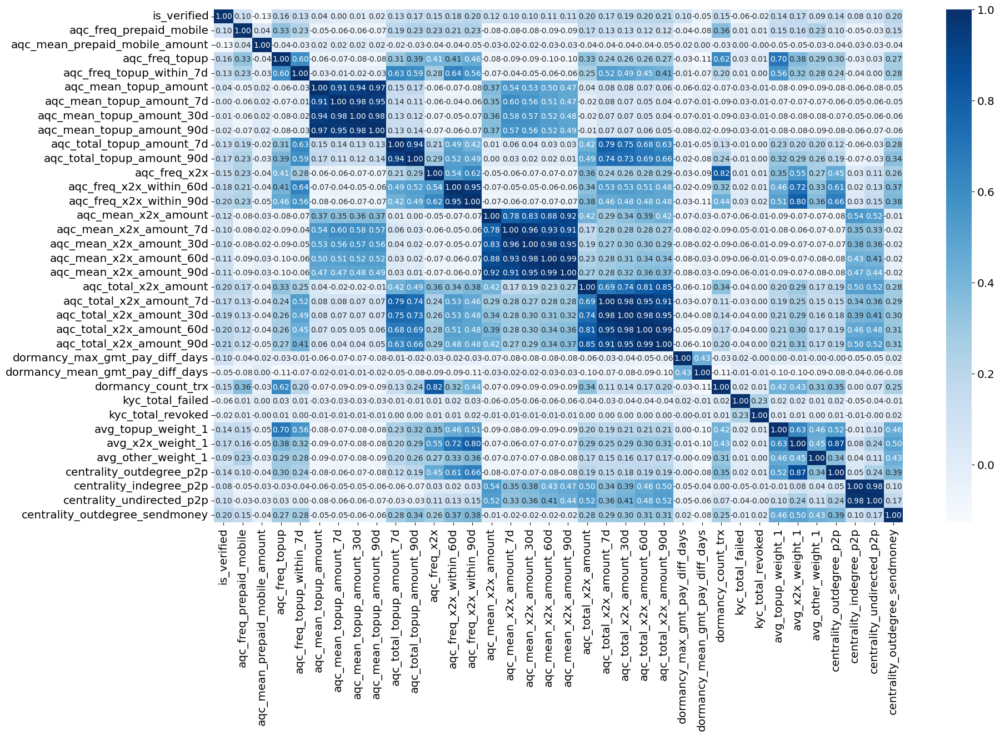

In [ ]:
# correlation heatmap
plt.figure(figsize=(20, 12))
sns.heatmap(df_fraud.corr(numeric_only=True), cmap='Blues', annot=True, fmt='.2f')


Based on the correlation heatmap, some features exhibit redundancy, including:

* aqc_mean_topup_amount and its variations (7d, 30d, 90d)
* aqc_total_topup_amount_7d and aqc_total_topup_amount_90d
* aqc_freq_x2x_within_60d and aqc_freq_x2x_within_90d
* aqc_mean_x2x_amount and its variations (7d, 30d, 60d, 90d)
* aqc_total_x2x_amount and its variations (7d, 30d, 60d, 90d)
* centrality_indegree_p2p and centrality_undirected_p2p

To address this redundancy, we select the most correlated feature with "is_fraud" for each group and remove the rest. The selected features are:

* aqc_mean_topup_amount_90d
* aqc_total_topup_amount_7d
* aqc_freq_x2x_within_60d
* aqc_mean_x2x_amount_90d
* aqc_total_x2x_amount
* centrality_indegree_p2p

In [ ]:
# Define a list of redundant features to drop
redundant_features = [
    'aqc_mean_topup_amount',
    'aqc_mean_topup_amount_7d',
    'aqc_mean_topup_amount_30d',
    'aqc_total_topup_amount_90d',
    'aqc_freq_x2x_within_90d',
    'aqc_mean_x2x_amount',
    'aqc_mean_x2x_amount_7d',
    'aqc_mean_x2x_amount_30d',
    'aqc_mean_x2x_amount_60d',
    'aqc_total_x2x_amount_7d',
    'aqc_total_x2x_amount_30d',
    'aqc_total_x2x_amount_60d',
    'aqc_total_x2x_amount_90d',
    'centrality_undirected_p2p'
]

# Drop the redundant features from the training dataset
df_fraud = df_fraud.drop(columns=redundant_features)

# Drop the redundant features from the validation dataset
df_fraud_val = df_fraud_val.drop(columns=redundant_features)

In [ ]:
df_fraud.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29954 entries, 368685 to 79270
Data columns (total 30 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   uid                              29954 non-null  object 
 1   source                           29954 non-null  object 
 2   trx_date                         29954 non-null  object 
 3   report_date                      29954 non-null  object 
 4   registereddate                   29954 non-null  object 
 5   birthday                         29954 non-null  object 
 6   gender                           29954 non-null  object 
 7   job_position                     29954 non-null  object 
 8   is_verified                      29954 non-null  int64  
 9   aqc_freq_prepaid_mobile          29954 non-null  int64  
 10  aqc_mean_prepaid_mobile_amount   29954 non-null  float64
 11  aqc_freq_topup                   29954 non-null  int64  
 12  aqc_freq_topu

<Axes: >

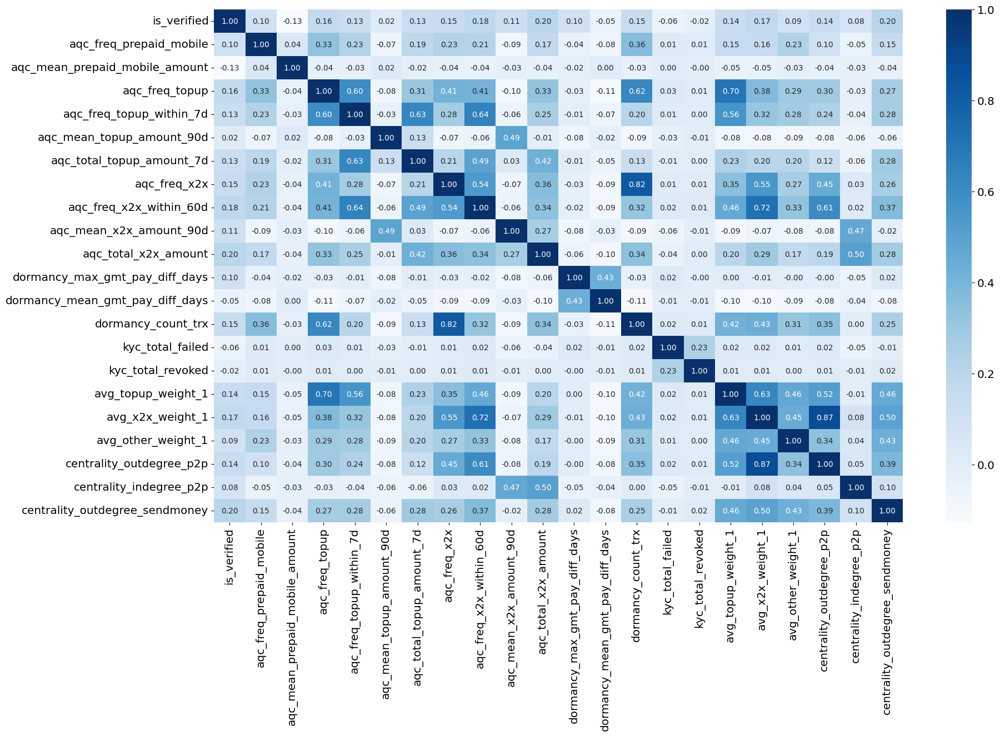

In [ ]:
# correlation heatmap
plt.figure(figsize=(20, 12))
sns.heatmap(df_fraud.corr(numeric_only=True), cmap='Blues', annot=True, fmt='.2f')

After examining the correlation heatmap, we observe that several features still exhibit strong correlation with each other. To address this, we can identify and remove redundant features that exhibit high correlation (>0.7) by selecting only the feature with the highest correlation to the target variable 'is_scammer'. This ensures that we retain only the most informative features while reducing the potential for multicollinearity among predictors.

Based on the correlation heatmap, some features exhibit redundancy, including:

* avg_topup_weight_1 with aqc_freq_topup
* dormancy_count_trx with aqc_freq_x2x
* avg_x2x_weight_1 with aqc_freq_x2x_within_60d
* centrality_outdeegre_p2p with avg_x2x_weight_1

To address this redundancy, we select the most correlated feature with "is_fraud" for each group and remove the rest. The selected features are:

* aqc_freq_topup
* dormancy_count_trx (both have same correlation with 'is_scammer', we choose the one with the least similarity with other features

 because avg_x2x_weight_1 have a redundancy with 2 other features, and in both similarity, avg_x2x_weight_1 have a smaller correlation with 'is_scammer', we are going to drop avg_x2x_weight_1 to address those 2 redundancy

* aqc_freq_x2x_within_60d
* centrality_outdeegre_p2p

In [ ]:
# Define a list of redundant features to drop
redundant_features = [
    'avg_topup_weight_1',
    'aqc_freq_x2x',
    'avg_x2x_weight_1'
]

# Drop the redundant features from the training dataset
df_fraud = df_fraud.drop(columns=redundant_features)

# Drop the redundant features from the validation dataset
df_fraud_val = df_fraud_val.drop(columns=redundant_features)


<Axes: >

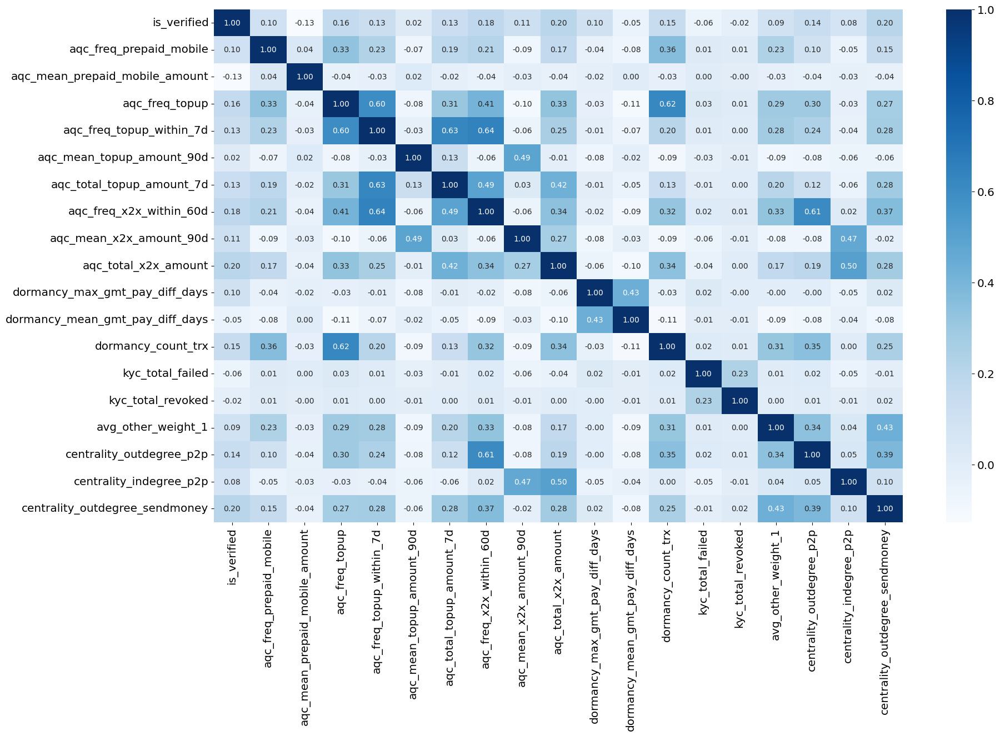

In [ ]:
# correlation heatmap
plt.figure(figsize=(20, 12))
sns.heatmap(df_fraud.corr(numeric_only=True), cmap='Blues', annot=True, fmt='.2f')

### 2.6 Adding new features: `has_null`, `account_lifetime`, and `user_transaction_group`

In [ ]:
# Creating new features in training dataset
df_fraud['has_null'] = has_null
df_fraud['account_lifetime'] = (
    (df_fraud["trx_date"].astype("datetime64[ns]")) - (df_fraud["registereddate"].astype("datetime64[ns]"))
    ).dt.days
df_fraud['user_transaction_group'] = df_fraud[['centrality_indegree_p2p', 'centrality_outdegree_p2p']].apply(
      lambda row : assign_group(row['centrality_indegree_p2p'], row['centrality_outdegree_p2p'], 4),
      axis=1)
df_fraud['is_group_1'] = df_fraud['user_transaction_group'] == 1
df_fraud['is_group_2'] = df_fraud['user_transaction_group'] == 2
df_fraud['is_group_3'] = df_fraud['user_transaction_group'] == 3

# Creating new features in validation dataset
df_fraud_val['has_null'] = has_null
df_fraud_val['account_lifetime'] = (
    (df_fraud_val["trx_date"].astype("datetime64[ns]")) - (df_fraud_val["registereddate"].astype("datetime64[ns]"))
    ).dt.days
df_fraud_val['user_transaction_group'] = df_fraud_val[['centrality_indegree_p2p', 'centrality_outdegree_p2p']].apply(
      lambda row : assign_group(row['centrality_indegree_p2p'], row['centrality_outdegree_p2p'], 4),
      axis=1)
df_fraud_val['is_group_1'] = df_fraud_val['user_transaction_group'] == 1
df_fraud_val['is_group_2'] = df_fraud_val['user_transaction_group'] == 2
df_fraud_val['is_group_3'] = df_fraud_val['user_transaction_group'] == 3

# Final Project - Stage 2
## Data Preprocessing - Data Set Dana
## FD23-01 : Fraud Busters
**Group Member:**
- (ML) M118DKX4597 	- Dharma Setiawan
- (ML) M181DSX0383 	- Jeremy Reeve Kurniawan
- (ML) M181DSX0495 	- Muhammad Agil Ghifari
- (CC) C181DSX0615 	- Taufik Pragusga


## Feature Encoding

In [ ]:
#Melihat value setiap variabel/feature 
category_encoding = ['job_position', 'source',  'gender']

for column in category_encoding:
  print(f'value counts of column {column}')
  print(df_fraud[column].value_counts())
  print('---'*10, '\n')

value counts of column job_position
PELAJAR / MAHASISWA      15899
MENGURUS RUMAH TANGGA     3768
BELUM / TIDAK BEKERJA     3153
KARYAWAN SWASTA           2590
WIRASWASTA                1959
BURUH HARIAN LEPAS         923
PETANI / PEKEBUN           665
OTHERS                     401
PEKERJA PEMERINTAH         211
__NUMBER__                 207
PEDAGANG                   178
Name: job_position, dtype: int64
------------------------------ 

value counts of column source
CS_REPORT_SCAMMER               8786
CS_REPORT_VICTIM                7943
INCOMPLETE_CS_REPORT_VICTIM     7257
INCOMPLETE_CS_REPORT_SCAMMER    5968
Name: source, dtype: int64
------------------------------ 

value counts of column gender
Male      20535
Female     9419
Name: gender, dtype: int64
------------------------------ 



Feature Encoding Strategy:
   - 'gender' : label encoding
   - 'job_position' and 'source' : one hot encoding

In [ ]:
#Label encoding
mapping_gender = {
    'Female' : 0,
    'Male' : 1
}

df_fraud['gender(num)'] = df_fraud['gender'].map(mapping_gender)

# Lakukan untuk dev
df_fraud_val['gender(num)'] = df_fraud_val['gender'].map(mapping_gender)

In [ ]:
#One hot encoding
from sklearn.preprocessing import OneHotEncoder

# WARNING: run this code only one time
for cat in ['job_position', 'source', 'user_transaction_group']:
    enc = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
    enc.fit(df_fraud[['job_position']])
    new_cols = [f"job_position_{job}" for job in enc.categories_[0]]

    # OHE for training data
    df_fraud[new_cols] = pd.DataFrame(enc.transform(df_fraud[['job_position']]),
                           columns=new_cols,
                           index = df_fraud.index)

    # OHE for validation data
    df_fraud_val[new_cols] = pd.DataFrame(enc.transform(df_fraud_val[['job_position']]),
                               columns=new_cols,
                               index = df_fraud_val.index)

In [ ]:
enc = OneHotEncoder(sparse_output=False)
pd.DataFrame(enc.fit_transform(df_fraud[['job_position']]),
             columns=[f"job_position_{job}" for job in enc.categories_[0]],
             index = df_fraud.index
             )

,job_position_BELUM / TIDAK BEKERJA,job_position_BURUH HARIAN LEPAS,job_position_KARYAWAN SWASTA,job_position_MENGURUS RUMAH TANGGA,job_position_OTHERS,job_position_PEDAGANG,job_position_PEKERJA PEMERINTAH,job_position_PELAJAR / MAHASISWA,job_position_PETANI / PEKEBUN,job_position_WIRASWASTA,job_position___NUMBER__
368685,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
30923,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
62940,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
61411,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
72905,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
32524,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
175173,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
61361,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
80887,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
[f"job_position_{job}" for job in enc.categories_[0]]

['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__']

In [ ]:
#Tampilan dataset setelah beberapa variabel diencoding
df_fraud.head()

,uid,source,trx_date,report_date,registereddate,birthday,gender,job_position,is_verified,aqc_freq_prepaid_mobile,aqc_mean_prepaid_mobile_amount,aqc_freq_topup,aqc_freq_topup_within_7d,aqc_mean_topup_amount_90d,aqc_total_topup_amount_7d,aqc_freq_x2x_within_60d,aqc_mean_x2x_amount_90d,aqc_total_x2x_amount,dormancy_max_gmt_pay_diff_days,dormancy_mean_gmt_pay_diff_days,dormancy_count_trx,kyc_total_failed,kyc_total_revoked,avg_other_weight_1,centrality_outdegree_p2p,centrality_indegree_p2p,centrality_outdegree_sendmoney,has_null,account_lifetime,user_transaction_group,is_group_1,is_group_2,is_group_3,gender(num),job_position_BELUM / TIDAK BEKERJA,job_position_BURUH HARIAN LEPAS,job_position_KARYAWAN SWASTA,job_position_MENGURUS RUMAH TANGGA,job_position_OTHERS,job_position_PEDAGANG,job_position_PEKERJA PEMERINTAH,job_position_PELAJAR / MAHASISWA,job_position_PETANI / PEKEBUN,job_position_WIRASWASTA,job_position___NUMBER__
368685,23b2603d-032b-4e9c-8032-6c2ebd2b5671,INCOMPLETE_CS_REPORT_VICTIM,2023-01-19,2023-01-19,2022-12,05-2000,Male,PELAJAR / MAHASISWA,1,2,336333.333333,4,2,2.583333e+06,20000000,2,5.083333e+05,6100000,18.0,5.000000,7,0.0,1.0,0.395833,0.000000e+00,0.000000e+00,0.000000e+00,False,49,3,False,False,True,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
30923,d940ec32-7e9f-4e8a-8aae-36601687b847,INCOMPLETE_CS_REPORT_VICTIM,2023-01-29,2023-01-29,2019-10,09-2002,Male,KARYAWAN SWASTA,1,35,193778.026906,77,41,2.055830e+06,759900000,255,2.274978e+06,1102040000,528.0,3.598485,264,5.0,4.0,4.875000,2.473603e-06,1.060116e-06,1.306080e-07,False,1216,3,False,False,True,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
62940,aef04a15-d85c-4aea-a2f7-1c961251404d,INCOMPLETE_CS_REPORT_SCAMMER,2023-01-26,2023-01-26,2020-11,09-1974,Female,MENGURUS RUMAH TANGGA,1,38,32911.764706,395,49,1.175478e+06,707750000,46,5.558750e+05,2843225600,115.0,0.524297,1173,4.0,0.0,16.536458,3.533719e-07,5.653950e-07,1.959121e-07,False,816,3,False,False,True,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
61411,82011eff-e78a-4d0b-8cd6-4d189428e594,CS_REPORT_VICTIM,2021-06-16,2021-06-21,2020-10,05-1967,Male,__NUMBER__,1,10,38830.409357,50,20,8.349123e+05,37720000,5,8.220942e+05,236078100,24.0,1.317073,123,1.0,0.0,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,False,258,3,False,False,True,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
72905,ebd96046-a7b5-42f5-a1dd-69be00a53315,CS_REPORT_SCAMMER,2021-02-11,2021-02-13,2021-01,04-2003,Male,PELAJAR / MAHASISWA,0,0,0.000000,4,1,5.000000e+07,200000000,0,0.000000e+00,0,29.0,4.142857,7,1.0,0.0,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,True,41,3,False,False,True,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
#Info dataset setelah beberapa variabel diencoding
df_fraud.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29954 entries, 368685 to 79270
Data columns (total 45 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   uid                                 29954 non-null  object 
 1   source                              29954 non-null  object 
 2   trx_date                            29954 non-null  object 
 3   report_date                         29954 non-null  object 
 4   registereddate                      29954 non-null  object 
 5   birthday                            29954 non-null  object 
 6   gender                              29954 non-null  object 
 7   job_position                        29954 non-null  object 
 8   is_verified                         29954 non-null  int64  
 9   aqc_freq_prepaid_mobile             29954 non-null  int64  
 10  aqc_mean_prepaid_mobile_amount      29954 non-null  float64
 11  aqc_freq_topup                      

In [ ]:
df_fraud.describe()

,is_verified,aqc_freq_prepaid_mobile,aqc_mean_prepaid_mobile_amount,aqc_freq_topup,aqc_freq_topup_within_7d,aqc_mean_topup_amount_90d,aqc_total_topup_amount_7d,aqc_freq_x2x_within_60d,aqc_mean_x2x_amount_90d,aqc_total_x2x_amount,dormancy_max_gmt_pay_diff_days,dormancy_mean_gmt_pay_diff_days,dormancy_count_trx,kyc_total_failed,kyc_total_revoked,avg_other_weight_1,centrality_outdegree_p2p,centrality_indegree_p2p,centrality_outdegree_sendmoney,account_lifetime,user_transaction_group,gender(num),job_position_BELUM / TIDAK BEKERJA,job_position_BURUH HARIAN LEPAS,job_position_KARYAWAN SWASTA,job_position_MENGURUS RUMAH TANGGA,job_position_OTHERS,job_position_PEDAGANG,job_position_PEKERJA PEMERINTAH,job_position_PELAJAR / MAHASISWA,job_position_PETANI / PEKEBUN,job_position_WIRASWASTA,job_position___NUMBER__
count,29954.000000,29954.000000,2.995400e+04,29954.000000,29954.000000,2.995400e+04,2.995400e+04,29954.000000,2.995400e+04,2.995400e+04,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,2.995400e+04,2.995400e+04,2.995400e+04,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000
mean,0.862456,25.220538,2.626060e+05,143.620785,41.947319,7.252660e+06,1.075117e+09,84.951860,1.307131e+07,4.558744e+09,112.435434,5.334546,360.823730,1.710590,0.095113,2.939877,7.552702e-07,2.039595e-06,6.043467e-08,541.763571,2.549543,0.685551,0.105261,0.030814,0.086466,0.125793,0.013387,0.005942,0.007044,0.530781,0.022201,0.065400,0.006911
std,0.344427,64.312745,1.854168e+06,275.580410,93.895944,2.260211e+07,2.809421e+09,176.065371,4.199209e+07,8.580535e+09,163.722636,18.478971,770.391217,3.155747,1.088174,5.951106,2.021506e-06,9.332485e-06,1.122213e-07,433.190665,0.705748,0.464304,0.306895,0.172816,0.281056,0.331621,0.114928,0.076859,0.083635,0.499060,0.147338,0.247235,0.082844
min,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,4.853189e+03,17.000000,4.000000,8.461879e+05,4.100000e+07,4.000000,6.118708e+05,1.150375e+08,14.000000,0.344764,33.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,163.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,7.000000,5.657511e+04,61.000000,13.000000,2.187376e+06,2.315455e+08,24.000000,2.408634e+06,1.143949e+09,48.000000,1.186047,129.000000,1.000000,0.000000,1.083333,0.000000e+00,7.067437e-08,0.000000e+00,467.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,26.000000,1.719785e+05,176.000000,43.000000,5.297833e+06,9.210556e+08,91.000000,6.888871e+06,4.725855e+09,140.000000,3.653043,402.000000,2.000000,0.000000,3.541667,4.947206e-07,3.533719e-07,9.795603e-08,805.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,1.000000,4718.000000,1.000000e+08,24919.000000,3819.000000,7.644444e+08,5.374929e+10,5350.000000,9.760300e+08,1.173494e+11,1497.000000,638.000000,63375.000000,66.000000,131.000000,427.161458,8.700016e-05,1.177435e-04,5.550842e-06,1943.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Correlation Heatmap (Setelah Feature Encoding)

In [ ]:
#Buat data frame baru dimana variabel `ID` untuk sementara di drop
df_fraud_corr = df_fraud.copy()

<ipython-input-94-dfb7a8b86937>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_fraud_corr.corr(), cmap='Blues', annot=True, fmt='.2f')


<Axes: >

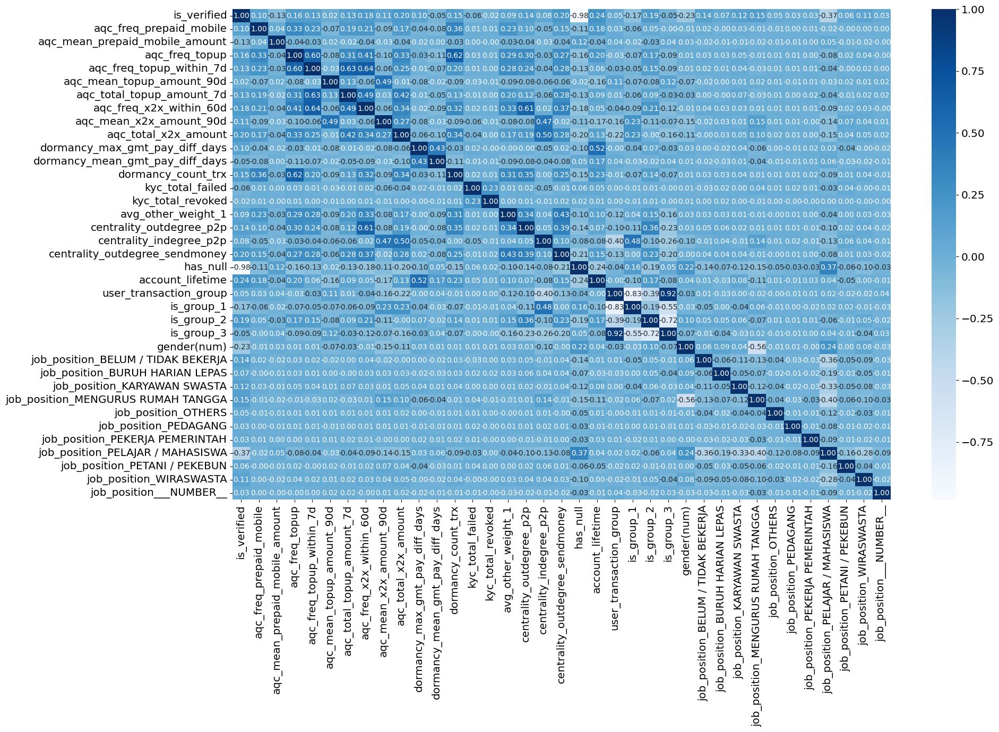

In [ ]:
# correlation heatmap
plt.figure(figsize=(20, 12))
sns.heatmap(df_fraud_corr.corr(), cmap='Blues', annot=True, fmt='.2f')

We can see that after doing the encoding, the correlation is relatively still small.

## Normalization

In [ ]:
# membagi data berdasarkan type datanya
category = df_fraud.select_dtypes(include='object')
numerical = df_fraud.select_dtypes(exclude='object')

numerical_cols = numerical.columns.to_list()
category_cols = category.columns.to_list()

print("Data numerik: ", numerical_cols)
print("Data category: ", category_cols)

Data numerik:  ['is_verified', 'aqc_freq_prepaid_mobile', 'aqc_mean_prepaid_mobile_amount', 'aqc_freq_topup', 'aqc_freq_topup_within_7d', 'aqc_mean_topup_amount_90d', 'aqc_total_topup_amount_7d', 'aqc_freq_x2x_within_60d', 'aqc_mean_x2x_amount_90d', 'aqc_total_x2x_amount', 'dormancy_max_gmt_pay_diff_days', 'dormancy_mean_gmt_pay_diff_days', 'dormancy_count_trx', 'kyc_total_failed', 'kyc_total_revoked', 'avg_other_weight_1', 'centrality_outdegree_p2p', 'centrality_indegree_p2p', 'centrality_outdegree_sendmoney', 'has_null', 'account_lifetime', 'user_transaction_group', 'is_group_1', 'is_group_2', 'is_group_3', 'gender(num)', 'job_position_BELUM / TIDAK BEKERJA', 'job_position_BURUH HARIAN LEPAS', 'job_position_KARYAWAN SWASTA', 'job_position_MENGURUS RUMAH TANGGA', 'job_position_OTHERS', 'job_position_PEDAGANG', 'job_position_PEKERJA PEMERINTAH', 'job_position_PELAJAR / MAHASISWA', 'job_position_PETANI / PEKEBUN', 'job_position_WIRASWASTA', 'job_position___NUMBER__']
Data category:  ['u

In [ ]:
#Pengelompokkan variabel numerik
df_fraud_num = df_fraud[numerical_cols]
df_fraud_num.head()

,is_verified,aqc_freq_prepaid_mobile,aqc_mean_prepaid_mobile_amount,aqc_freq_topup,aqc_freq_topup_within_7d,aqc_mean_topup_amount_90d,aqc_total_topup_amount_7d,aqc_freq_x2x_within_60d,aqc_mean_x2x_amount_90d,aqc_total_x2x_amount,dormancy_max_gmt_pay_diff_days,dormancy_mean_gmt_pay_diff_days,dormancy_count_trx,kyc_total_failed,kyc_total_revoked,avg_other_weight_1,centrality_outdegree_p2p,centrality_indegree_p2p,centrality_outdegree_sendmoney,has_null,account_lifetime,user_transaction_group,is_group_1,is_group_2,is_group_3,gender(num),job_position_BELUM / TIDAK BEKERJA,job_position_BURUH HARIAN LEPAS,job_position_KARYAWAN SWASTA,job_position_MENGURUS RUMAH TANGGA,job_position_OTHERS,job_position_PEDAGANG,job_position_PEKERJA PEMERINTAH,job_position_PELAJAR / MAHASISWA,job_position_PETANI / PEKEBUN,job_position_WIRASWASTA,job_position___NUMBER__
368685,1,2,336333.333333,4,2,2.583333e+06,20000000,2,5.083333e+05,6100000,18.0,5.000000,7,0.0,1.0,0.395833,0.000000e+00,0.000000e+00,0.000000e+00,False,49,3,False,False,True,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
30923,1,35,193778.026906,77,41,2.055830e+06,759900000,255,2.274978e+06,1102040000,528.0,3.598485,264,5.0,4.0,4.875000,2.473603e-06,1.060116e-06,1.306080e-07,False,1216,3,False,False,True,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
62940,1,38,32911.764706,395,49,1.175478e+06,707750000,46,5.558750e+05,2843225600,115.0,0.524297,1173,4.0,0.0,16.536458,3.533719e-07,5.653950e-07,1.959121e-07,False,816,3,False,False,True,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
61411,1,10,38830.409357,50,20,8.349123e+05,37720000,5,8.220942e+05,236078100,24.0,1.317073,123,1.0,0.0,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,False,258,3,False,False,True,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
72905,0,0,0.000000,4,1,5.000000e+07,200000000,0,0.000000e+00,0,29.0,4.142857,7,1.0,0.0,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,True,41,3,False,False,True,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
df_fraud.describe()

,is_verified,aqc_freq_prepaid_mobile,aqc_mean_prepaid_mobile_amount,aqc_freq_topup,aqc_freq_topup_within_7d,aqc_mean_topup_amount_90d,aqc_total_topup_amount_7d,aqc_freq_x2x_within_60d,aqc_mean_x2x_amount_90d,aqc_total_x2x_amount,dormancy_max_gmt_pay_diff_days,dormancy_mean_gmt_pay_diff_days,dormancy_count_trx,kyc_total_failed,kyc_total_revoked,avg_other_weight_1,centrality_outdegree_p2p,centrality_indegree_p2p,centrality_outdegree_sendmoney,account_lifetime,user_transaction_group,gender(num),job_position_BELUM / TIDAK BEKERJA,job_position_BURUH HARIAN LEPAS,job_position_KARYAWAN SWASTA,job_position_MENGURUS RUMAH TANGGA,job_position_OTHERS,job_position_PEDAGANG,job_position_PEKERJA PEMERINTAH,job_position_PELAJAR / MAHASISWA,job_position_PETANI / PEKEBUN,job_position_WIRASWASTA,job_position___NUMBER__
count,29954.000000,29954.000000,2.995400e+04,29954.000000,29954.000000,2.995400e+04,2.995400e+04,29954.000000,2.995400e+04,2.995400e+04,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,2.995400e+04,2.995400e+04,2.995400e+04,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000
mean,0.862456,25.220538,2.626060e+05,143.620785,41.947319,7.252660e+06,1.075117e+09,84.951860,1.307131e+07,4.558744e+09,112.435434,5.334546,360.823730,1.710590,0.095113,2.939877,7.552702e-07,2.039595e-06,6.043467e-08,541.763571,2.549543,0.685551,0.105261,0.030814,0.086466,0.125793,0.013387,0.005942,0.007044,0.530781,0.022201,0.065400,0.006911
std,0.344427,64.312745,1.854168e+06,275.580410,93.895944,2.260211e+07,2.809421e+09,176.065371,4.199209e+07,8.580535e+09,163.722636,18.478971,770.391217,3.155747,1.088174,5.951106,2.021506e-06,9.332485e-06,1.122213e-07,433.190665,0.705748,0.464304,0.306895,0.172816,0.281056,0.331621,0.114928,0.076859,0.083635,0.499060,0.147338,0.247235,0.082844
min,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,4.853189e+03,17.000000,4.000000,8.461879e+05,4.100000e+07,4.000000,6.118708e+05,1.150375e+08,14.000000,0.344764,33.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,163.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,7.000000,5.657511e+04,61.000000,13.000000,2.187376e+06,2.315455e+08,24.000000,2.408634e+06,1.143949e+09,48.000000,1.186047,129.000000,1.000000,0.000000,1.083333,0.000000e+00,7.067437e-08,0.000000e+00,467.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,26.000000,1.719785e+05,176.000000,43.000000,5.297833e+06,9.210556e+08,91.000000,6.888871e+06,4.725855e+09,140.000000,3.653043,402.000000,2.000000,0.000000,3.541667,4.947206e-07,3.533719e-07,9.795603e-08,805.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,1.000000,4718.000000,1.000000e+08,24919.000000,3819.000000,7.644444e+08,5.374929e+10,5350.000000,9.760300e+08,1.173494e+11,1497.000000,638.000000,63375.000000,66.000000,131.000000,427.161458,8.700016e-05,1.177435e-04,5.550842e-06,1943.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Standardization

In [ ]:
from sklearn.preprocessing import StandardScaler
# semua variabel numerik coba kita standardisasi
# df_fraud['std_aqc_freq_prepaid_mobile'] = StandardScaler().fit_transform(df_fraud['aqc_freq_prepaid_mobile'].values.reshape(len(df_fraud), 1))
# df_fraud['std_aqc_mean_prepaid_mobile_amount'] = StandardScaler().fit_transform(df_fraud['aqc_mean_prepaid_mobile_amount'].values.reshape(len(df_fraud), 1))
# df_fraud['std_aqc_freq_topup'] =StandardScaler().fit_transform(df_fraud['aqc_freq_topup'].values.reshape(len(df_fraud), 1))
# df_fraud['std_aqc_freq_topup_within_7d'] = StandardScaler().fit_transform(df_fraud['aqc_freq_topup_within_7d'].values.reshape(len(df_fraud), 1))
# df_fraud['std_aqc_mean_topup_amount_90d'] = StandardScaler().fit_transform(df_fraud['aqc_mean_topup_amount_90d'].values.reshape(len(df_fraud), 1))
# df_fraud['std_aqc_total_topup_amount_7d'] = StandardScaler().fit_transform(df_fraud['aqc_total_topup_amount_7d'].values.reshape(len(df_fraud), 1))
# df_fraud['std_aqc_freq_x2x_within_60d'] = StandardScaler().fit_transform(df_fraud['aqc_freq_x2x_within_60d'].values.reshape(len(df_fraud), 1))
# df_fraud['std_aqc_mean_x2x_amount_90d'] = StandardScaler().fit_transform(df_fraud['aqc_mean_x2x_amount_90d'].values.reshape(len(df_fraud), 1))
# df_fraud['std_aqc_total_x2x_amount'] = StandardScaler().fit_transform(df_fraud['aqc_total_x2x_amount'].values.reshape(len(df_fraud), 1))
# df_fraud['std_dormancy_max_gmt_pay_diff_days'] = StandardScaler().fit_transform(df_fraud['dormancy_max_gmt_pay_diff_days'].values.reshape(len(df_fraud), 1))
# df_fraud['std_dormancy_mean_gmt_pay_diff_days'] = StandardScaler().fit_transform(df_fraud['dormancy_mean_gmt_pay_diff_days'].values.reshape(len(df_fraud), 1))
# df_fraud['std_dormancy_count_trx'] = StandardScaler().fit_transform(df_fraud['dormancy_count_trx'].values.reshape(len(df_fraud), 1))
# df_fraud['std_kyc_total_failed'] = StandardScaler().fit_transform(df_fraud['kyc_total_failed'].values.reshape(len(df_fraud), 1))
# df_fraud['std_kyc_total_revoked'] = StandardScaler().fit_transform(df_fraud['kyc_total_revoked'].values.reshape(len(df_fraud), 1))
# df_fraud['std_avg_other_weight_1'] = StandardScaler().fit_transform(df_fraud['avg_other_weight_1'].values.reshape(len(df_fraud), 1))
# df_fraud['std_centrality_outdegree_p2p'] =StandardScaler().fit_transform(df_fraud['centrality_outdegree_p2p'].values.reshape(len(df_fraud), 1))
# df_fraud['std_centrality_indegree_p2p'] = StandardScaler().fit_transform(df_fraud['centrality_indegree_p2p'].values.reshape(len(df_fraud), 1))
# df_fraud['std_centrality_outdegree_sendmoney'] = StandardScaler().fit_transform(df_fraud['centrality_outdegree_sendmoney'].values.reshape(len(df_fraud), 1))

scaled_cols = ['aqc_freq_prepaid_mobile', 'aqc_mean_prepaid_mobile_amount', 'aqc_freq_topup',
 'aqc_freq_topup_within_7d', 'aqc_mean_topup_amount_90d', 'aqc_total_topup_amount_7d',
 'aqc_freq_x2x_within_60d', 'aqc_mean_x2x_amount_90d', 'aqc_total_x2x_amount',
 'dormancy_max_gmt_pay_diff_days', 'dormancy_mean_gmt_pay_diff_days', 'dormancy_count_trx',
 'kyc_total_failed', 'kyc_total_revoked', 'avg_other_weight_1', 'centrality_outdegree_p2p',
 'centrality_indegree_p2p', 'centrality_outdegree_sendmoney']

scalers_std = dict()

for col in scaled_cols:
  scalers_std[col] = StandardScaler()

  # fit scaler and scale train
  df_fraud[f'std_{col}'] = scalers_std[col].fit_transform(df_fraud[col].values.reshape(len(df_fraud), 1))

  # # Also scale for test df
  df_fraud_val[f'std_{col}'] = scalers_std[col].transform(df_fraud_val[col].values.reshape(len(df_fraud_val), 1))

In [ ]:
df_fraud.describe()

,is_verified,aqc_freq_prepaid_mobile,aqc_mean_prepaid_mobile_amount,aqc_freq_topup,aqc_freq_topup_within_7d,aqc_mean_topup_amount_90d,aqc_total_topup_amount_7d,aqc_freq_x2x_within_60d,aqc_mean_x2x_amount_90d,aqc_total_x2x_amount,dormancy_max_gmt_pay_diff_days,dormancy_mean_gmt_pay_diff_days,dormancy_count_trx,kyc_total_failed,kyc_total_revoked,avg_other_weight_1,centrality_outdegree_p2p,centrality_indegree_p2p,centrality_outdegree_sendmoney,account_lifetime,user_transaction_group,gender(num),job_position_BELUM / TIDAK BEKERJA,job_position_BURUH HARIAN LEPAS,job_position_KARYAWAN SWASTA,job_position_MENGURUS RUMAH TANGGA,job_position_OTHERS,job_position_PEDAGANG,job_position_PEKERJA PEMERINTAH,job_position_PELAJAR / MAHASISWA,job_position_PETANI / PEKEBUN,job_position_WIRASWASTA,job_position___NUMBER__,std_aqc_freq_prepaid_mobile,std_aqc_mean_prepaid_mobile_amount,std_aqc_freq_topup,std_aqc_freq_topup_within_7d,std_aqc_mean_topup_amount_90d,std_aqc_total_topup_amount_7d,std_aqc_freq_x2x_within_60d,std_aqc_mean_x2x_amount_90d,std_aqc_total_x2x_amount,std_dormancy_max_gmt_pay_diff_days,std_dormancy_mean_gmt_pay_diff_days,std_dormancy_count_trx,std_kyc_total_failed,std_kyc_total_revoked,std_avg_other_weight_1,std_centrality_outdegree_p2p,std_centrality_indegree_p2p,std_centrality_outdegree_sendmoney
count,29954.000000,29954.000000,2.995400e+04,29954.000000,29954.000000,2.995400e+04,2.995400e+04,29954.000000,2.995400e+04,2.995400e+04,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,2.995400e+04,2.995400e+04,2.995400e+04,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04
mean,0.862456,25.220538,2.626060e+05,143.620785,41.947319,7.252660e+06,1.075117e+09,84.951860,1.307131e+07,4.558744e+09,112.435434,5.334546,360.823730,1.710590,0.095113,2.939877,7.552702e-07,2.039595e-06,6.043467e-08,541.763571,2.549543,0.685551,0.105261,0.030814,0.086466,0.125793,0.013387,0.005942,0.007044,0.530781,0.022201,0.065400,0.006911,-1.423268e-18,-8.183790e-18,-1.613037e-17,2.775372e-17,1.079311e-17,3.226074e-17,8.065184e-18,3.807241e-17,-7.590762e-18,3.795381e-17,8.539607e-18,-1.423268e-18,-1.375826e-17,5.811677e-18,-3.320958e-18,5.218649e-18,-6.404705e-18,-2.941420e-17
std,0.344427,64.312745,1.854168e+06,275.580410,93.895944,2.260211e+07,2.809421e+09,176.065371,4.199209e+07,8.580535e+09,163.722636,18.478971,770.391217,3.155747,1.088174,5.951106,2.021506e-06,9.332485e-06,1.122213e-07,433.190665,0.705748,0.464304,0.306895,0.172816,0.281056,0.331621,0.114928,0.076859,0.083635,0.499060,0.147338,0.247235,0.082844,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00
min,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.921611e-01,-1.416324e-01,-5.211662e-01,-4.467501e-01,-3.208896e-01,-3.826891e-01,-4.825099e-01,-3.112856e-01,-5.312979e-01,-6.867548e-01,-2.886868e-01,-4.683721e-01,-5.420644e-01,-8.740706e-02,-4.940133e-01,-3.736238e-01,-2.185516e-01,-5.385401e-01
25%,1.000000,1.000000,4.853189e+03,17.000000,4.000000,8.461879e+05,4.100000e+07,4.000000,6.118708e+05,1.150375e+08,14.000000,0.344764,33.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,163.000000,2.000000,0.000000,0.000000,0.000000,0.00

## Log/Exp Transformation

<Axes: xlabel='aqc_freq_prepaid_mobile', ylabel='Density'>

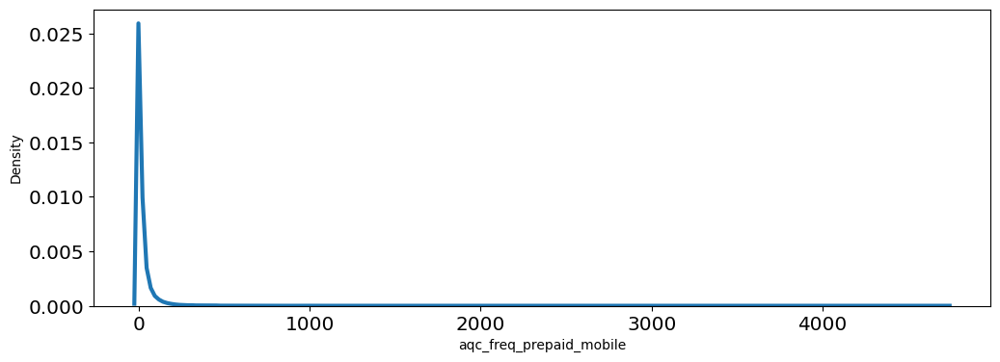

In [ ]:
#distribusi aqc_freq_prepaid_mobile  (nilai asli)
sns.kdeplot(df_fraud['aqc_freq_prepaid_mobile'])

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Axes: xlabel='aqc_freq_prepaid_mobile', ylabel='Density'>

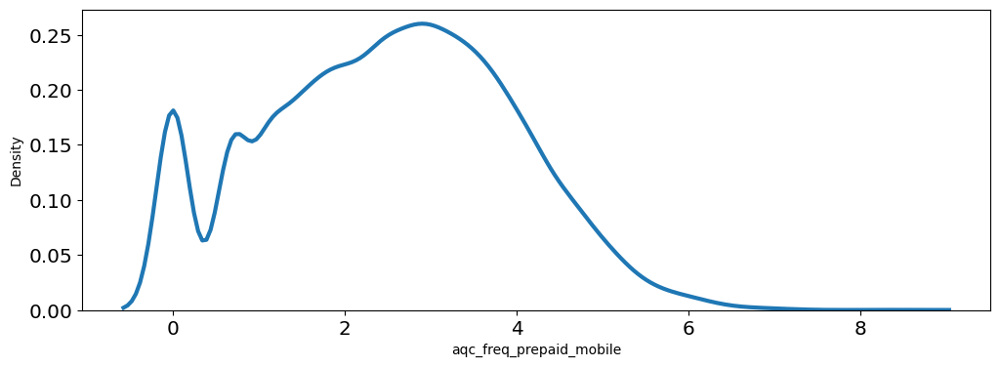

In [ ]:
#distribusi aqc_freq_prepaid_mobile (setelah log transformation)
sns.kdeplot(np.log(df_fraud['aqc_freq_prepaid_mobile']))

<Axes: xlabel='aqc_mean_prepaid_mobile_amount', ylabel='Density'>

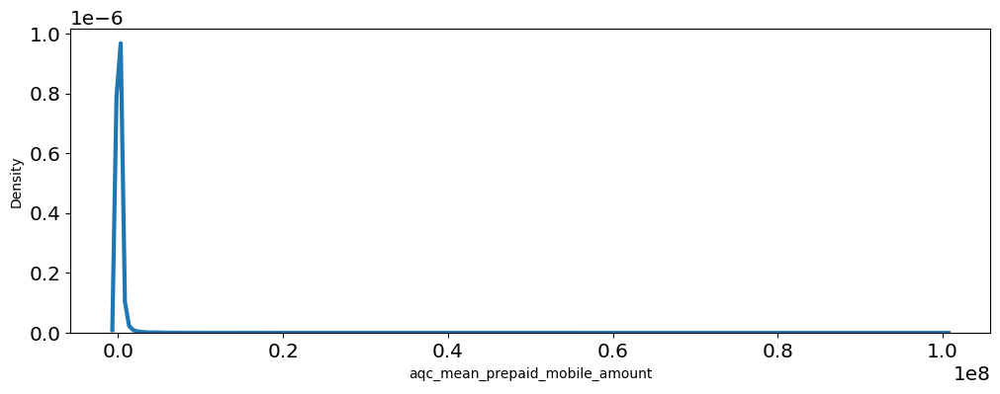

In [ ]:
#distribusi Prior_Purchases (nilai asli)
sns.kdeplot(df_fraud['aqc_mean_prepaid_mobile_amount'])

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Axes: xlabel='aqc_mean_prepaid_mobile_amount', ylabel='Density'>

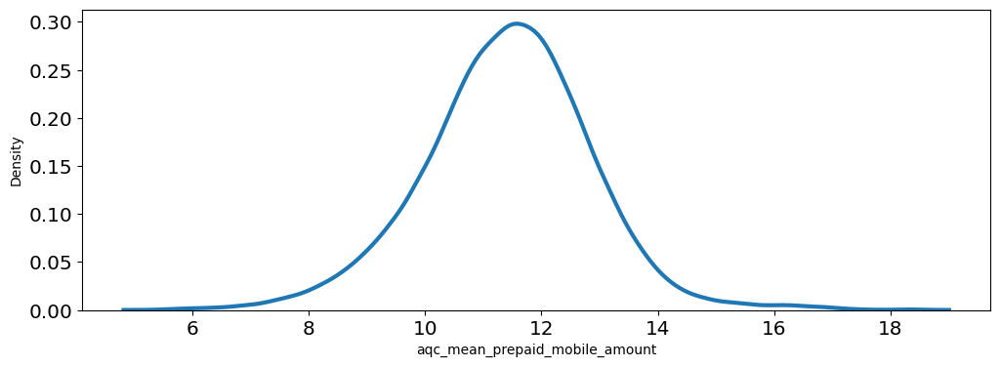

In [ ]:
#distribusi aqc_mean_prepaid_mobile_amount (setelah log transformation)
sns.kdeplot(np.log(df_fraud['aqc_mean_prepaid_mobile_amount']))

<Axes: xlabel='kyc_total_revoked', ylabel='Density'>

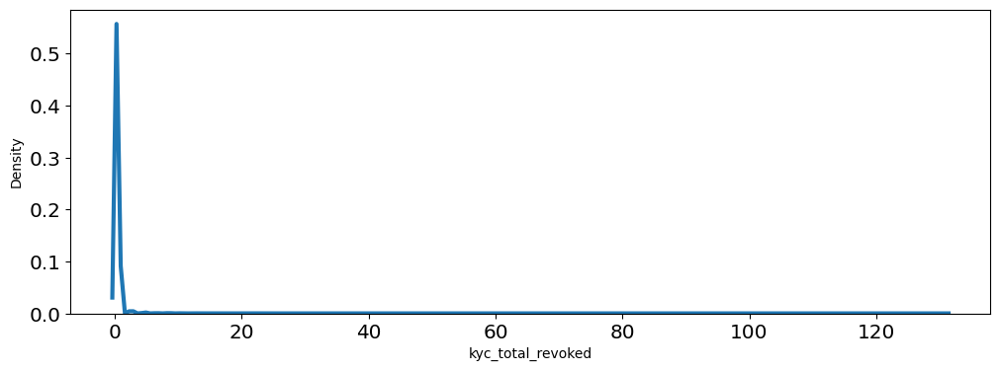

In [ ]:
#distribusi Prior_Purchases (nilai asli)
sns.kdeplot(df_fraud['kyc_total_revoked'])

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Axes: xlabel='kyc_total_revoked', ylabel='Density'>

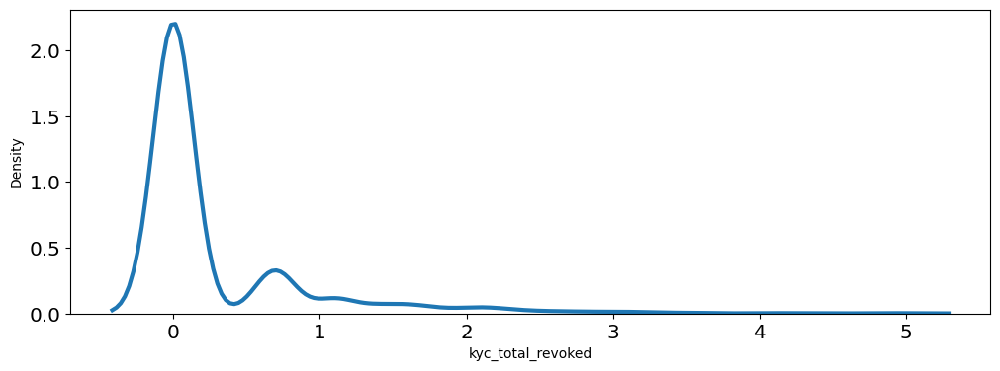

In [ ]:
#distribusi aqc_mean_prepaid_mobile_amount (setelah log transformation)
sns.kdeplot(np.log(df_fraud['kyc_total_revoked']))

In [ ]:
#log transformation
# df_fraud['log_aqc_freq_prepaid_mobile'] = np.log(df_fraud['aqc_freq_prepaid_mobile'])
# df_fraud['log_aqc_mean_prepaid_mobile_amount'] =np.log(df_fraud['aqc_mean_prepaid_mobile_amount'])
# df_fraud['log_aqc_freq_topup'] =np.log(df_fraud['aqc_freq_topup'])
# df_fraud['log_aqc_freq_topup_within_7d'] = np.log(df_fraud['aqc_freq_topup_within_7d'])
# df_fraud['log_aqc_mean_topup_amount_90d'] = np.log(df_fraud['aqc_mean_topup_amount_90d'])
# df_fraud['log_aqc_total_topup_amount_7d'] = np.log(df_fraud['aqc_total_topup_amount_7d'])
# df_fraud['log_aqc_freq_x2x_within_60d'] = np.log(df_fraud['aqc_freq_x2x_within_60d'])
# df_fraud['log_aqc_mean_x2x_amount_90d'] = np.log(df_fraud['aqc_mean_x2x_amount_90d'])
# df_fraud['log_aqc_total_x2x_amount'] = np.log(df_fraud['aqc_total_x2x_amount'])
# df_fraud['log_dormancy_max_gmt_pay_diff_days'] = np.log(df_fraud['dormancy_max_gmt_pay_diff_days'])
# df_fraud['log_dormancy_mean_gmt_pay_diff_days'] = np.log(df_fraud['dormancy_mean_gmt_pay_diff_days'])
# df_fraud['log_dormancy_count_trx'] =np.log(df_fraud['dormancy_count_trx'])
# df_fraud['log_kyc_total_failed'] = np.log(df_fraud['kyc_total_failed'])
# df_fraud['log_kyc_total_revoked'] = np.log(df_fraud['kyc_total_revoked'])
# df_fraud['log_avg_other_weight_1'] = np.log(df_fraud['avg_other_weight_1'])
# df_fraud['log_centrality_outdegree_p2p'] =np.log(df_fraud['centrality_outdegree_p2p'])
# df_fraud['log_centrality_indegree_p2p'] = np.log(df_fraud['centrality_indegree_p2p'])
# df_fraud['log_centrality_outdegree_sendmoney'] = np.log(df_fraud['centrality_outdegree_sendmoney'])

scaled_cols = ['aqc_freq_prepaid_mobile', 'aqc_mean_prepaid_mobile_amount', 'aqc_freq_topup',
 'aqc_freq_topup_within_7d', 'aqc_mean_topup_amount_90d', 'aqc_total_topup_amount_7d',
 'aqc_freq_x2x_within_60d', 'aqc_mean_x2x_amount_90d', 'aqc_total_x2x_amount',
 'dormancy_max_gmt_pay_diff_days', 'dormancy_mean_gmt_pay_diff_days', 'dormancy_count_trx',
 'kyc_total_failed', 'kyc_total_revoked', 'avg_other_weight_1', 'centrality_outdegree_p2p',
 'centrality_indegree_p2p', 'centrality_outdegree_sendmoney']

scalers_std = dict()

for col in scaled_cols:
  # fit scaler and scale train
  df_fraud[f'log_{col}'] = np.log(df_fraud[col])

  # # Also scale for test df
  df_fraud_val[f'log_{col}'] = np.log(df_fraud_val[col])

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = geta

In [ ]:
df_fraud.describe()

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


,is_verified,aqc_freq_prepaid_mobile,aqc_mean_prepaid_mobile_amount,aqc_freq_topup,aqc_freq_topup_within_7d,aqc_mean_topup_amount_90d,aqc_total_topup_amount_7d,aqc_freq_x2x_within_60d,aqc_mean_x2x_amount_90d,aqc_total_x2x_amount,dormancy_max_gmt_pay_diff_days,dormancy_mean_gmt_pay_diff_days,dormancy_count_trx,kyc_total_failed,kyc_total_revoked,avg_other_weight_1,centrality_outdegree_p2p,centrality_indegree_p2p,centrality_outdegree_sendmoney,account_lifetime,user_transaction_group,gender(num),job_position_BELUM / TIDAK BEKERJA,job_position_BURUH HARIAN LEPAS,job_position_KARYAWAN SWASTA,job_position_MENGURUS RUMAH TANGGA,job_position_OTHERS,job_position_PEDAGANG,job_position_PEKERJA PEMERINTAH,job_position_PELAJAR / MAHASISWA,job_position_PETANI / PEKEBUN,job_position_WIRASWASTA,job_position___NUMBER__,std_aqc_freq_prepaid_mobile,std_aqc_mean_prepaid_mobile_amount,std_aqc_freq_topup,std_aqc_freq_topup_within_7d,std_aqc_mean_topup_amount_90d,std_aqc_total_topup_amount_7d,std_aqc_freq_x2x_within_60d,std_aqc_mean_x2x_amount_90d,std_aqc_total_x2x_amount,std_dormancy_max_gmt_pay_diff_days,std_dormancy_mean_gmt_pay_diff_days,std_dormancy_count_trx,std_kyc_total_failed,std_kyc_total_revoked,std_avg_other_weight_1,std_centrality_outdegree_p2p,std_centrality_indegree_p2p,std_centrality_outdegree_sendmoney,log_aqc_freq_prepaid_mobile,log_aqc_mean_prepaid_mobile_amount,log_aqc_freq_topup,log_aqc_freq_topup_within_7d,log_aqc_mean_topup_amount_90d,log_aqc_total_topup_amount_7d,log_aqc_freq_x2x_within_60d,log_aqc_mean_x2x_amount_90d,log_aqc_total_x2x_amount,log_dormancy_max_gmt_pay_diff_days,log_dormancy_mean_gmt_pay_diff_days,log_dormancy_count_trx,log_kyc_total_failed,log_kyc_total_revoked,log_avg_other_weight_1,log_centrality_outdegree_p2p,log_centrality_indegree_p2p,log_centrality_outdegree_sendmoney
count,29954.000000,29954.000000,2.995400e+04,29954.000000,29954.000000,2.995400e+04,2.995400e+04,29954.000000,2.995400e+04,2.995400e+04,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,2.995400e+04,2.995400e+04,2.995400e+04,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,29954.000000,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04,2.995400e+04
mean,0.862456,25.220538,2.626060e+05,143.620785,41.947319,7.252660e+06,1.075117e+09,84.951860,1.307131e+07,4.558744e+09,112.435434,5.334546,360.823730,1.710590,0.095113,2.939877,7.552702e-07,2.039595e-06,6.043467e-08,541.763571,2.549543,0.685551,0.105261,0.030814,0.086466,0.125793,0.013387,0.005942,0.007044,0.530781,0.022201,0.065400,0.006911,-1.423268e-18,-8.183790e-18,-1.613037e-17,2.775372e-17,1.079311e-17,3.226074e-17,8.065184e-18,3.807241e-17,-7.590762e-18,3.795381e-17,8.539607e-18,-1.423268e-18,-1.375826e-17,5.811677e-18,-3.320958e-18,5.218649e-18,-6.404705e-18,-2.941420e-17,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf
std,0.344427,64.312745,1.854168e+06,275.580410,93.895944,2.260211e+07,2.809421e+09,176.065371,4.199209e+07,8.580535e+09,163.722636,18.478971,770.391217,3.155747,1.088174,5.951106,2.021506e-06,9.332485e-06,1.122213e-07,433.190665,0.705748,0.464304,0.306895,0.172816,0.281056,0.331621,0.114928,0.076859,0.083635,0.499060,0.147338,0.247235,0.082844,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,NaN,NaN,NaN,NaN,Na

## Outliers Handling 

Firstly, we are going to calculate the percentage of outliers in each feature.

In [ ]:
df_fraud.select_dtypes(include='number').info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29954 entries, 368685 to 79270
Data columns (total 69 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   is_verified                          29954 non-null  int64  
 1   aqc_freq_prepaid_mobile              29954 non-null  int64  
 2   aqc_mean_prepaid_mobile_amount       29954 non-null  float64
 3   aqc_freq_topup                       29954 non-null  int64  
 4   aqc_freq_topup_within_7d             29954 non-null  int64  
 5   aqc_mean_topup_amount_90d            29954 non-null  float64
 6   aqc_total_topup_amount_7d            29954 non-null  int64  
 7   aqc_freq_x2x_within_60d              29954 non-null  int64  
 8   aqc_mean_x2x_amount_90d              29954 non-null  float64
 9   aqc_total_x2x_amount                 29954 non-null  int64  
 10  dormancy_max_gmt_pay_diff_days       29954 non-null  float64
 11  dormancy_mean_gmt_pay_d

In [ ]:
df_fraud.select_dtypes(include=['int64', 'float64'])

,is_verified,aqc_freq_prepaid_mobile,aqc_mean_prepaid_mobile_amount,aqc_freq_topup,aqc_freq_topup_within_7d,aqc_mean_topup_amount_90d,aqc_total_topup_amount_7d,aqc_freq_x2x_within_60d,aqc_mean_x2x_amount_90d,aqc_total_x2x_amount,dormancy_max_gmt_pay_diff_days,dormancy_mean_gmt_pay_diff_days,dormancy_count_trx,kyc_total_failed,kyc_total_revoked,avg_other_weight_1,centrality_outdegree_p2p,centrality_indegree_p2p,centrality_outdegree_sendmoney,account_lifetime,user_transaction_group,gender(num),job_position_BELUM / TIDAK BEKERJA,job_position_BURUH HARIAN LEPAS,job_position_KARYAWAN SWASTA,job_position_MENGURUS RUMAH TANGGA,job_position_OTHERS,job_position_PEDAGANG,job_position_PEKERJA PEMERINTAH,job_position_PELAJAR / MAHASISWA,job_position_PETANI / PEKEBUN,job_position_WIRASWASTA,job_position___NUMBER__,std_aqc_freq_prepaid_mobile,std_aqc_mean_prepaid_mobile_amount,std_aqc_freq_topup,std_aqc_freq_topup_within_7d,std_aqc_mean_topup_amount_90d,std_aqc_total_topup_amount_7d,std_aqc_freq_x2x_within_60d,std_aqc_mean_x2x_amount_90d,std_aqc_total_x2x_amount,std_dormancy_max_gmt_pay_diff_days,std_dormancy_mean_gmt_pay_diff_days,std_dormancy_count_trx,std_kyc_total_failed,std_kyc_total_revoked,std_avg_other_weight_1,std_centrality_outdegree_p2p,std_centrality_indegree_p2p,std_centrality_outdegree_sendmoney,log_aqc_freq_prepaid_mobile,log_aqc_mean_prepaid_mobile_amount,log_aqc_freq_topup,log_aqc_freq_topup_within_7d,log_aqc_mean_topup_amount_90d,log_aqc_total_topup_amount_7d,log_aqc_freq_x2x_within_60d,log_aqc_mean_x2x_amount_90d,log_aqc_total_x2x_amount,log_dormancy_max_gmt_pay_diff_days,log_dormancy_mean_gmt_pay_diff_days,log_dormancy_count_trx,log_kyc_total_failed,log_kyc_total_revoked,log_avg_other_weight_1,log_centrality_outdegree_p2p,log_centrality_indegree_p2p,log_centrality_outdegree_sendmoney
368685,1,2,336333.333333,4,2,2.583333e+06,20000000,2,5.083333e+05,6100000,18.0,5.000000,7,0.0,1.0,0.395833,0.000000e+00,0.000000e+00,0.000000e+00,49,3,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.361063,0.039764,-0.506651,-0.425450,-0.206592,-0.375570,-0.471150,-0.299180,-0.530587,-0.576811,-0.018104,-0.459286,-0.542064,0.831579,-0.427498,-0.373624,-0.218552,-0.538540,0.693147,12.725858,1.386294,0.693147,14.764591,16.811243,0.693147,13.138893,15.623799,2.890372,1.609438,1.945910,-inf,0.000000,-0.926762,-inf,-inf,-inf
30923,1,35,193778.026906,77,41,2.055830e+06,759900000,255,2.274978e+06,1102040000,528.0,3.598485,264,5.0,4.0,4.875000,2.473603e-06,1.060116e-06,1.306080e-07,1216,3,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.152064,-0.037121,-0.241751,-0.010089,-0.229931,-0.112202,0.965840,-0.257108,-0.402861,2.538265,-0.093950,-0.125683,1.042373,3.588537,0.325176,0.850040,-0.104956,0.625323,3.555348,12.174469,4.343805,3.713572,14.536190,20.448697,5.541264,14.637481,20.820429,6.269096,1.280513,5.575949,1.609438,1.386294,1.584120,-12.909835,-13.757133,-15.851065
62940,1,38,32911.764706,395,49,1.175478e+06,707750000,46,5.558750e+05,2843225600,115.0,0.524297,1173,4.0,0.0,16.536458,3.533719e-07,5.653950e-07,1.959121e-07,816,3,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.198711,-0.123882,0.912196,0.075113,-0.268881,-0.130765,-0.221239,-0.298048,-0.199935,0.015664,-0.260314,1.054256,0.725486,-0.087407,2.284753,-0.198815,-0.157967,1.207254,3.637586,10.401585,5.978886,3.891820,13.977185,20.377601,3.828641,13.228299,21.768205,4.744932,-0.645698,7.067320,1.386294,-inf,2.805568,-14.855745,-14.385741,-15.445600
61411,1,10,38830.409357,50,20,8.349123e+05,37720000,5,8.220942e+05,236078100,24.0,1.317073,123,1.0,0.0,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,258,3,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.236668,-0.120690,-0.339728,-0.233745,-0.283949,-0.369263,-0.454111,-0.291708,-0.503784,-0.540163,-0.217411,-0.308710,-0.225177,-0.087407,-0.494013,-0.373624,-0.218552,-0.538540,2.302585,10.566959,3.912023,2.995732,13.635082,17.445701,1.609438,13.619610,19.279673,3.178054,0.275412,4.812184,0.000000,-inf,-inf,-inf,-inf,-inf
72905,0,0,0.000

In [ ]:
df_fraud.select_dtypes(include=['int64', 'float64']).info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29954 entries, 368685 to 79270
Data columns (total 69 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   is_verified                          29954 non-null  int64  
 1   aqc_freq_prepaid_mobile              29954 non-null  int64  
 2   aqc_mean_prepaid_mobile_amount       29954 non-null  float64
 3   aqc_freq_topup                       29954 non-null  int64  
 4   aqc_freq_topup_within_7d             29954 non-null  int64  
 5   aqc_mean_topup_amount_90d            29954 non-null  float64
 6   aqc_total_topup_amount_7d            29954 non-null  int64  
 7   aqc_freq_x2x_within_60d              29954 non-null  int64  
 8   aqc_mean_x2x_amount_90d              29954 non-null  float64
 9   aqc_total_x2x_amount                 29954 non-null  int64  
 10  dormancy_max_gmt_pay_diff_days       29954 non-null  float64
 11  dormancy_mean_gmt_pay_d

In outlier handling, we will exclude the encoded categorical features. We will only consider the numerical features and not include the encoded categorical features

In [ ]:
# Define the list of numerical features, excluding encoded categorical features and 'is_scammer', 'is_verified', 'gender(num)'
numerical_features = df_fraud.select_dtypes(include=['int64', 'float64']).columns.tolist()
exclude_features = ['is_scammer', 'is_verified', 'gender(num)', 'norm_aqc_freq_prepaid_mobile', 
                    'norm_aqc_mean_prepaid_mobile_amount', 'norm_aqc_freq_topup', 'norm_aqc_freq_topup_within_7d','norm_aqc_mean_topup_amount_90d', 
                    'norm_aqc_total_topup_amount_7d', 'norm_aqc_freq_x2x_within_60d', 'norm_aqc_mean_x2x_amount_90d', 'norm_aqc_total_x2x_amount', 
                    'norm_dormancy_max_gmt_pay_diff_days', 'norm_dormancy_mean_gmt_pay_diff_days', 'norm_dormancy_count_trx', 'norm_kyc_total_failed', 
                    'norm_kyc_total_revoked', 'norm_avg_other_weight_1', 'norm_centrality_outdegree_p2p', 'norm_centrality_indegree_p2p', 
                    'norm_centrality_outdegree_sendmoney', 'std_aqc_freq_prepaid_mobile','std_aqc_mean_prepaid_mobile_amount', 'std_aqc_freq_topup', 
                    'std_aqc_freq_topup_within_7d','std_aqc_mean_topup_amount_90d', 'std_aqc_total_topup_amount_7d', 'std_aqc_freq_x2x_within_60d', 
                    'std_aqc_mean_x2x_amount_90d', 'std_aqc_total_x2x_amount', 'std_dormancy_max_gmt_pay_diff_days', 'std_dormancy_mean_gmt_pay_diff_days', 
                    'std_dormancy_count_trx', 'std_kyc_total_failed', 'std_kyc_total_revoked', 'std_avg_other_weight_1', 'std_centrality_outdegree_p2p', 
                    'std_centrality_indegree_p2p', 'std_centrality_outdegree_sendmoney', 'log_aqc_freq_prepaid_mobile','log_aqc_mean_prepaid_mobile_amount', 
                    'log_aqc_freq_topup', 'log_aqc_freq_topup_within_7d','log_aqc_mean_topup_amount_90d', 'log_aqc_total_topup_amount_7d', 
                    'log_aqc_freq_x2x_within_60d', 'log_aqc_mean_x2x_amount_90d', 'log_aqc_total_x2x_amount', 'log_dormancy_max_gmt_pay_diff_days', 
                    'log_dormancy_mean_gmt_pay_diff_days', 'log_dormancy_count_trx', 'log_kyc_total_failed', 'log_kyc_total_revoked', 
                    'log_avg_other_weight_1', 'log_centrality_outdegree_p2p', 'log_centrality_indegree_p2p', 'log_centrality_outdegree_sendmoney']

numerical_features = [col for col in numerical_features if col not in exclude_features]

# Define the threshold for outliers (you can adjust this to your needs)
threshold = 1.5

# Loop over the numerical features
for feature in numerical_features:
    # Calculate the first and third quartiles
    q1 = df_fraud[feature].quantile(0.25)
    q3 = df_fraud[feature].quantile(0.75)
    
    # Calculate the interquartile range (IQR)
    iqr = q3 - q1
    
    # Calculate the lower and upper bounds for outliers
    lower_bound = q1 - threshold * iqr
    upper_bound = q3 + threshold * iqr
    
    # Count the number of outliers
    num_outliers = len(df_fraud[(df_fraud[feature] < lower_bound) | (df_fraud[feature] > upper_bound)])
    
    # Calculate the percentage of outliers
    outlier_percentage = num_outliers / len(df_fraud[feature]) * 100
    
    # Print the result
    print(f"{feature}: {num_outliers} / {len(df_fraud)} ({outlier_percentage:.2f}%)")


aqc_freq_prepaid_mobile: 2986 / 29954 (9.97%)
aqc_mean_prepaid_mobile_amount: 2923 / 29954 (9.76%)
aqc_freq_topup: 2528 / 29954 (8.44%)
aqc_freq_topup_within_7d: 3105 / 29954 (10.37%)
aqc_mean_topup_amount_90d: 3402 / 29954 (11.36%)
aqc_total_topup_amount_7d: 3233 / 29954 (10.79%)
aqc_freq_x2x_within_60d: 3113 / 29954 (10.39%)
aqc_mean_x2x_amount_90d: 4051 / 29954 (13.52%)
aqc_total_x2x_amount: 3429 / 29954 (11.45%)
dormancy_max_gmt_pay_diff_days: 2714 / 29954 (9.06%)
dormancy_mean_gmt_pay_diff_days: 3615 / 29954 (12.07%)
dormancy_count_trx: 2986 / 29954 (9.97%)
kyc_total_failed: 2237 / 29954 (7.47%)
kyc_total_revoked: 1519 / 29954 (5.07%)
avg_other_weight_1: 2469 / 29954 (8.24%)
centrality_outdegree_p2p: 4798 / 29954 (16.02%)
centrality_indegree_p2p: 3915 / 29954 (13.07%)
centrality_outdegree_sendmoney: 1739 / 29954 (5.81%)
account_lifetime: 10 / 29954 (0.03%)
user_transaction_group: 0 / 29954 (0.00%)
job_position_BELUM / TIDAK BEKERJA: 3153 / 29954 (10.53%)
job_position_BURUH HARIAN 

In [ ]:
# drop all outliers

# Define the list of numerical features, excluding encoded categorical features and 'is_scammer', 'is_verified', 'gender(num)'
numerical_features = df_fraud.select_dtypes(include=['int64', 'float64']).columns.tolist()
exclude_features = ['is_scammer', 'is_verified', 'gender(num)', 'norm_aqc_freq_prepaid_mobile', 
                    'norm_aqc_mean_prepaid_mobile_amount', 'norm_aqc_freq_topup', 'norm_aqc_freq_topup_within_7d','norm_aqc_mean_topup_amount_90d', 
                    'norm_aqc_total_topup_amount_7d', 'norm_aqc_freq_x2x_within_60d', 'norm_aqc_mean_x2x_amount_90d', 'norm_aqc_total_x2x_amount', 
                    'norm_dormancy_max_gmt_pay_diff_days', 'norm_dormancy_mean_gmt_pay_diff_days', 'norm_dormancy_count_trx', 'norm_kyc_total_failed', 
                    'norm_kyc_total_revoked', 'norm_avg_other_weight_1', 'norm_centrality_outdegree_p2p', 'norm_centrality_indegree_p2p', 
                    'norm_centrality_outdegree_sendmoney', 'std_aqc_freq_prepaid_mobile','std_aqc_mean_prepaid_mobile_amount', 'std_aqc_freq_topup', 
                    'std_aqc_freq_topup_within_7d','std_aqc_mean_topup_amount_90d', 'std_aqc_total_topup_amount_7d', 'std_aqc_freq_x2x_within_60d', 
                    'std_aqc_mean_x2x_amount_90d', 'std_aqc_total_x2x_amount', 'std_dormancy_max_gmt_pay_diff_days', 'std_dormancy_mean_gmt_pay_diff_days', 
                    'std_dormancy_count_trx', 'std_kyc_total_failed', 'std_kyc_total_revoked', 'std_avg_other_weight_1', 'std_centrality_outdegree_p2p', 
                    'std_centrality_indegree_p2p', 'std_centrality_outdegree_sendmoney', 'log_aqc_freq_prepaid_mobile','log_aqc_mean_prepaid_mobile_amount', 
                    'log_aqc_freq_topup', 'log_aqc_freq_topup_within_7d','log_aqc_mean_topup_amount_90d', 'log_aqc_total_topup_amount_7d', 
                    'log_aqc_freq_x2x_within_60d', 'log_aqc_mean_x2x_amount_90d', 'log_aqc_total_x2x_amount', 'log_dormancy_max_gmt_pay_diff_days', 
                    'log_dormancy_mean_gmt_pay_diff_days', 'log_dormancy_count_trx', 'log_kyc_total_failed', 'log_kyc_total_revoked', 
                    'log_avg_other_weight_1', 'log_centrality_outdegree_p2p', 'log_centrality_indegree_p2p', 'log_centrality_outdegree_sendmoney']
numerical_features = [col for col in numerical_features if col not in exclude_features]

# Define the threshold for outliers (you can adjust this to your needs)
threshold = 1.5

# Create a copy of df_fraud
df_fraud_dropped = df_fraud.copy()

# Loop over the numerical features
for feature in numerical_features:
    # Calculate the first and third quartiles
    q1 = df_fraud[feature].quantile(0.25)
    q3 = df_fraud[feature].quantile(0.75)
    
    # Calculate the interquartile range (IQR)
    iqr = q3 - q1
    
    # Calculate the lower and upper bounds for outliers
    lower_bound = q1 - threshold * iqr
    upper_bound = q3 + threshold * iqr
    
    # Drop the outliers
    df_fraud_dropped = df_fraud_dropped[(df_fraud_dropped[feature] >= lower_bound) & (df_fraud_dropped[feature] <= upper_bound)]


    # Calculate the percentage of outliers after handling
    num_outliers = len(df_fraud_dropped[(df_fraud_dropped[feature] < lower_bound) | (df_fraud_dropped[feature] > upper_bound)])
    pct_outliers = num_outliers / len(df_fraud_dropped[feature])

    # Print the percentage of outliers in the feature after handling
    print(f"Percentage of outliers in {feature}: {pct_outliers:.2f}%")

    
    
# Print the number of rows remaining after dropping the outliers
print(f"Number of rows after dropping outliers: {len(df_fraud_dropped)}")



Percentage of outliers in aqc_freq_prepaid_mobile: 0.00%
Percentage of outliers in aqc_mean_prepaid_mobile_amount: 0.00%
Percentage of outliers in aqc_freq_topup: 0.00%
Percentage of outliers in aqc_freq_topup_within_7d: 0.00%
Percentage of outliers in aqc_mean_topup_amount_90d: 0.00%
Percentage of outliers in aqc_total_topup_amount_7d: 0.00%
Percentage of outliers in aqc_freq_x2x_within_60d: 0.00%
Percentage of outliers in aqc_mean_x2x_amount_90d: 0.00%
Percentage of outliers in aqc_total_x2x_amount: 0.00%
Percentage of outliers in dormancy_max_gmt_pay_diff_days: 0.00%
Percentage of outliers in dormancy_mean_gmt_pay_diff_days: 0.00%
Percentage of outliers in dormancy_count_trx: 0.00%
Percentage of outliers in kyc_total_failed: 0.00%
Percentage of outliers in kyc_total_revoked: 0.00%
Percentage of outliers in avg_other_weight_1: 0.00%
Percentage of outliers in centrality_outdegree_p2p: 0.00%
Percentage of outliers in centrality_indegree_p2p: 0.00%
Percentage of outliers in centrality_o

In [ ]:
# impute the outlier with median if the percentage of outlier is >5%

# Define the list of numerical features, excluding encoded categorical features and 'is_scammer', 'is_verified', 'gender(num)'
numerical_features = df_fraud.select_dtypes(include=['int64', 'float64']).columns.tolist()
exclude_features = ['is_scammer', 'is_verified', 'gender(num)', 'norm_aqc_freq_prepaid_mobile', 
                    'norm_aqc_mean_prepaid_mobile_amount', 'norm_aqc_freq_topup', 'norm_aqc_freq_topup_within_7d','norm_aqc_mean_topup_amount_90d', 
                    'norm_aqc_total_topup_amount_7d', 'norm_aqc_freq_x2x_within_60d', 'norm_aqc_mean_x2x_amount_90d', 'norm_aqc_total_x2x_amount', 
                    'norm_dormancy_max_gmt_pay_diff_days', 'norm_dormancy_mean_gmt_pay_diff_days', 'norm_dormancy_count_trx', 'norm_kyc_total_failed', 
                    'norm_kyc_total_revoked', 'norm_avg_other_weight_1', 'norm_centrality_outdegree_p2p', 'norm_centrality_indegree_p2p', 
                    'norm_centrality_outdegree_sendmoney', 'std_aqc_freq_prepaid_mobile','std_aqc_mean_prepaid_mobile_amount', 'std_aqc_freq_topup', 
                    'std_aqc_freq_topup_within_7d','std_aqc_mean_topup_amount_90d', 'std_aqc_total_topup_amount_7d', 'std_aqc_freq_x2x_within_60d', 
                    'std_aqc_mean_x2x_amount_90d', 'std_aqc_total_x2x_amount', 'std_dormancy_max_gmt_pay_diff_days', 'std_dormancy_mean_gmt_pay_diff_days', 
                    'std_dormancy_count_trx', 'std_kyc_total_failed', 'std_kyc_total_revoked', 'std_avg_other_weight_1', 'std_centrality_outdegree_p2p', 
                    'std_centrality_indegree_p2p', 'std_centrality_outdegree_sendmoney', 'log_aqc_freq_prepaid_mobile','log_aqc_mean_prepaid_mobile_amount', 
                    'log_aqc_freq_topup', 'log_aqc_freq_topup_within_7d','log_aqc_mean_topup_amount_90d', 'log_aqc_total_topup_amount_7d', 
                    'log_aqc_freq_x2x_within_60d', 'log_aqc_mean_x2x_amount_90d', 'log_aqc_total_x2x_amount', 'log_dormancy_max_gmt_pay_diff_days', 
                    'log_dormancy_mean_gmt_pay_diff_days', 'log_dormancy_count_trx', 'log_kyc_total_failed', 'log_kyc_total_revoked', 
                    'log_avg_other_weight_1', 'log_centrality_outdegree_p2p', 'log_centrality_indegree_p2p', 'log_centrality_outdegree_sendmoney']
numerical_features = [col for col in numerical_features if col not in exclude_features]

# Define the threshold for outliers (you can adjust this to your needs)
threshold = 1.5

# Create a copy of df_fraud
df_fraud_handled = df_fraud.copy()

# Loop over the numerical features
for feature in numerical_features:
    # Calculate the first and third quartiles
    q1 = df_fraud[feature].quantile(0.25)
    q3 = df_fraud[feature].quantile(0.75)
    
    # Calculate the interquartile range (IQR)
    iqr = q3 - q1
    
    # Calculate the lower and upper bounds for outliers
    lower_bound = q1 - threshold * iqr
    upper_bound = q3 + threshold * iqr
    
    # Calculate the percentage of outliers
    num_outliers = len(df_fraud_handled[(df_fraud_handled[feature] < lower_bound) | (df_fraud_handled[feature] > upper_bound)])
    pct_outliers = num_outliers / len(df_fraud_handled[feature])
    
    # Drop the outliers if the percentage is less than 5%
    if pct_outliers < 0.05:
        df_fraud_handled = df_fraud_handled[(df_fraud_handled[feature] >= lower_bound) & (df_fraud_handled[feature] <= upper_bound)]
    # Impute the outliers with the median if the percentage is greater than or equal to 5%
    else:
        median = df_fraud_handled[feature].median()
        df_fraud_handled.loc[(df_fraud_handled[feature] < lower_bound) | (df_fraud_handled[feature] > upper_bound), feature] = median


    # Calculate the percentage of outliers after handling
    num_outliers = len(df_fraud_handled[(df_fraud_handled[feature] < lower_bound) | (df_fraud_handled[feature] > upper_bound)])
    pct_outliers = num_outliers / len(df_fraud_handled[feature])

    # Print the percentage of outliers in the feature after handling
    print(f"Percentage of outliers in {feature}: {pct_outliers:.2f}%")
    
# Print the number of rows remaining after handling the outliers
print(f"Number of rows after handling outliers: {len(df_fraud_handled)}")


Percentage of outliers in aqc_freq_prepaid_mobile: 0.00%
Percentage of outliers in aqc_mean_prepaid_mobile_amount: 0.00%
Percentage of outliers in aqc_freq_topup: 0.00%
Percentage of outliers in aqc_freq_topup_within_7d: 0.00%
Percentage of outliers in aqc_mean_topup_amount_90d: 0.00%
Percentage of outliers in aqc_total_topup_amount_7d: 0.00%
Percentage of outliers in aqc_freq_x2x_within_60d: 0.00%
Percentage of outliers in aqc_mean_x2x_amount_90d: 0.00%
Percentage of outliers in aqc_total_x2x_amount: 0.00%
Percentage of outliers in dormancy_max_gmt_pay_diff_days: 0.00%
Percentage of outliers in dormancy_mean_gmt_pay_diff_days: 0.00%
Percentage of outliers in dormancy_count_trx: 0.00%
Percentage of outliers in kyc_total_failed: 0.00%
Percentage of outliers in kyc_total_revoked: 0.00%
Percentage of outliers in avg_other_weight_1: 0.00%
Percentage of outliers in centrality_outdegree_p2p: 0.00%
Percentage of outliers in centrality_indegree_p2p: 0.00%
Percentage of outliers in centrality_o

Besides using the IQR method for detecting outliers, we will also explore detecting outliers using the Z-score approach

In [ ]:
# Define the list of numerical features, excluding encoded categorical features and 'is_scammer', 'is_verified', 'gender(num)'
numerical_features = df_fraud.select_dtypes(include=['int64', 'float64']).columns.tolist()
exclude_features = ['is_scammer', 'is_verified', 'gender(num)', 'norm_aqc_freq_prepaid_mobile', 
                    'norm_aqc_mean_prepaid_mobile_amount', 'norm_aqc_freq_topup', 'norm_aqc_freq_topup_within_7d','norm_aqc_mean_topup_amount_90d', 
                    'norm_aqc_total_topup_amount_7d', 'norm_aqc_freq_x2x_within_60d', 'norm_aqc_mean_x2x_amount_90d', 'norm_aqc_total_x2x_amount', 
                    'norm_dormancy_max_gmt_pay_diff_days', 'norm_dormancy_mean_gmt_pay_diff_days', 'norm_dormancy_count_trx', 'norm_kyc_total_failed', 
                    'norm_kyc_total_revoked', 'norm_avg_other_weight_1', 'norm_centrality_outdegree_p2p', 'norm_centrality_indegree_p2p', 
                    'norm_centrality_outdegree_sendmoney', 'std_aqc_freq_prepaid_mobile','std_aqc_mean_prepaid_mobile_amount', 'std_aqc_freq_topup', 
                    'std_aqc_freq_topup_within_7d','std_aqc_mean_topup_amount_90d', 'std_aqc_total_topup_amount_7d', 'std_aqc_freq_x2x_within_60d', 
                    'std_aqc_mean_x2x_amount_90d', 'std_aqc_total_x2x_amount', 'std_dormancy_max_gmt_pay_diff_days', 'std_dormancy_mean_gmt_pay_diff_days', 
                    'std_dormancy_count_trx', 'std_kyc_total_failed', 'std_kyc_total_revoked', 'std_avg_other_weight_1', 'std_centrality_outdegree_p2p', 
                    'std_centrality_indegree_p2p', 'std_centrality_outdegree_sendmoney', 'log_aqc_freq_prepaid_mobile','log_aqc_mean_prepaid_mobile_amount', 
                    'log_aqc_freq_topup', 'log_aqc_freq_topup_within_7d','log_aqc_mean_topup_amount_90d', 'log_aqc_total_topup_amount_7d', 
                    'log_aqc_freq_x2x_within_60d', 'log_aqc_mean_x2x_amount_90d', 'log_aqc_total_x2x_amount', 'log_dormancy_max_gmt_pay_diff_days', 
                    'log_dormancy_mean_gmt_pay_diff_days', 'log_dormancy_count_trx', 'log_kyc_total_failed', 'log_kyc_total_revoked', 
                    'log_avg_other_weight_1', 'log_centrality_outdegree_p2p', 'log_centrality_indegree_p2p', 'log_centrality_outdegree_sendmoney']

numerical_features = [col for col in numerical_features if col not in exclude_features]

# Loop over the numerical features
for feature in numerical_features:
    # Calculate the z-scores for the feature
    z_scores = np.abs((df_fraud[feature] - df_fraud[feature].mean()) / df_fraud[feature].std())
    
    # Identify outliers using a z-score threshold (e.g., 3)
    threshold = 3
    outliers = df_fraud[(z_scores > threshold) | (z_scores < -threshold)]
    
    # Count the number of outliers
    num_outliers = ((z_scores > threshold) | (z_scores < -threshold)).sum()

    # Calculate the percentage of outliers
    outlier_percentage = num_outliers / len(df_fraud) * 100
    
    # Print the result
    print(f"{feature}: {num_outliers} / {len(df_fraud)} ({outlier_percentage:.2f}%)")


aqc_freq_prepaid_mobile: 400 / 29954 (1.34%)
aqc_mean_prepaid_mobile_amount: 166 / 29954 (0.55%)
aqc_freq_topup: 352 / 29954 (1.18%)
aqc_freq_topup_within_7d: 498 / 29954 (1.66%)
aqc_mean_topup_amount_90d: 430 / 29954 (1.44%)
aqc_total_topup_amount_7d: 572 / 29954 (1.91%)
aqc_freq_x2x_within_60d: 563 / 29954 (1.88%)
aqc_mean_x2x_amount_90d: 609 / 29954 (2.03%)
aqc_total_x2x_amount: 900 / 29954 (3.00%)
dormancy_max_gmt_pay_diff_days: 699 / 29954 (2.33%)
dormancy_mean_gmt_pay_diff_days: 404 / 29954 (1.35%)
dormancy_count_trx: 409 / 29954 (1.37%)
kyc_total_failed: 538 / 29954 (1.80%)
kyc_total_revoked: 116 / 29954 (0.39%)
avg_other_weight_1: 461 / 29954 (1.54%)
centrality_outdegree_p2p: 650 / 29954 (2.17%)
centrality_indegree_p2p: 834 / 29954 (2.78%)
centrality_outdegree_sendmoney: 471 / 29954 (1.57%)
account_lifetime: 6 / 29954 (0.02%)
user_transaction_group: 0 / 29954 (0.00%)
job_position_BELUM / TIDAK BEKERJA: 0 / 29954 (0.00%)
job_position_BURUH HARIAN LEPAS: 923 / 29954 (3.08%)
job_p

In [ ]:
# Define the list of numerical features, excluding encoded categorical features and 'is_scammer', 'is_verified', 'gender(num)'
numerical_features = df_fraud.select_dtypes(include=['int64', 'float64']).columns.tolist()
exclude_features = ['is_scammer', 'is_verified', 'gender(num)', 'norm_aqc_freq_prepaid_mobile', 
                    'norm_aqc_mean_prepaid_mobile_amount', 'norm_aqc_freq_topup', 'norm_aqc_freq_topup_within_7d','norm_aqc_mean_topup_amount_90d', 
                    'norm_aqc_total_topup_amount_7d', 'norm_aqc_freq_x2x_within_60d', 'norm_aqc_mean_x2x_amount_90d', 'norm_aqc_total_x2x_amount', 
                    'norm_dormancy_max_gmt_pay_diff_days', 'norm_dormancy_mean_gmt_pay_diff_days', 'norm_dormancy_count_trx', 'norm_kyc_total_failed', 
                    'norm_kyc_total_revoked', 'norm_avg_other_weight_1', 'norm_centrality_outdegree_p2p', 'norm_centrality_indegree_p2p', 
                    'norm_centrality_outdegree_sendmoney', 'std_aqc_freq_prepaid_mobile','std_aqc_mean_prepaid_mobile_amount', 'std_aqc_freq_topup', 
                    'std_aqc_freq_topup_within_7d','std_aqc_mean_topup_amount_90d', 'std_aqc_total_topup_amount_7d', 'std_aqc_freq_x2x_within_60d', 
                    'std_aqc_mean_x2x_amount_90d', 'std_aqc_total_x2x_amount', 'std_dormancy_max_gmt_pay_diff_days', 'std_dormancy_mean_gmt_pay_diff_days', 
                    'std_dormancy_count_trx', 'std_kyc_total_failed', 'std_kyc_total_revoked', 'std_avg_other_weight_1', 'std_centrality_outdegree_p2p', 
                    'std_centrality_indegree_p2p', 'std_centrality_outdegree_sendmoney', 'log_aqc_freq_prepaid_mobile','log_aqc_mean_prepaid_mobile_amount', 
                    'log_aqc_freq_topup', 'log_aqc_freq_topup_within_7d','log_aqc_mean_topup_amount_90d', 'log_aqc_total_topup_amount_7d', 
                    'log_aqc_freq_x2x_within_60d', 'log_aqc_mean_x2x_amount_90d', 'log_aqc_total_x2x_amount', 'log_dormancy_max_gmt_pay_diff_days', 
                    'log_dormancy_mean_gmt_pay_diff_days', 'log_dormancy_count_trx', 'log_kyc_total_failed', 'log_kyc_total_revoked', 
                    'log_avg_other_weight_1', 'log_centrality_outdegree_p2p', 'log_centrality_indegree_p2p', 'log_centrality_outdegree_sendmoney']
numerical_features = [col for col in numerical_features if col not in exclude_features]

# Create a copy of df_fraud
df_fraud_dropped_z = df_fraud.copy()

# Loop over the numerical features
for feature in numerical_features:
    # Calculate the z-scores for the feature
    z_scores = np.abs((df_fraud[feature] - df_fraud[feature].mean()) / df_fraud[feature].std())
    
    # Identify outliers using a z-score threshold (e.g., 3)
    threshold = 3
    outliers = df_fraud_dropped_z[(z_scores > threshold) | (z_scores < -threshold)]
    
    # Drop outliers
    if not outliers.empty:
        df_fraud_dropped_z = df_fraud_dropped_z[~df_fraud_dropped_z.index.isin(outliers.index)]

    # Calculate the percentage of outliers after handling
    num_outliers = len(df_fraud_dropped_z[(z_scores > threshold) | (z_scores < -threshold)])
    pct_outliers = num_outliers / len(df_fraud_dropped_z) * 100

    # Print the percentage of outliers in the feature after handling
    print(f"Percentage of outliers in {feature}: {pct_outliers:.2f}%")

# Print the number of rows remaining after handling outliers
print(f"Number of rows after handling outliers: {len(df_fraud_dropped_z)}")

Percentage of outliers in aqc_freq_prepaid_mobile: 0.00%
Percentage of outliers in aqc_mean_prepaid_mobile_amount: 0.00%
Percentage of outliers in aqc_freq_topup: 0.00%
Percentage of outliers in aqc_freq_topup_within_7d: 0.00%
Percentage of outliers in aqc_mean_topup_amount_90d: 0.00%
Percentage of outliers in aqc_total_topup_amount_7d: 0.00%
Percentage of outliers in aqc_freq_x2x_within_60d: 0.00%


<ipython-input-115-faaeee987f53>:36: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  num_outliers = len(df_fraud_dropped_z[(z_scores > threshold) | (z_scores < -threshold)])
<ipython-input-115-faaeee987f53>:29: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  outliers = df_fraud_dropped_z[(z_scores > threshold) | (z_scores < -threshold)]


Percentage of outliers in aqc_mean_x2x_amount_90d: 0.00%
Percentage of outliers in aqc_total_x2x_amount: 0.00%
Percentage of outliers in dormancy_max_gmt_pay_diff_days: 0.00%
Percentage of outliers in dormancy_mean_gmt_pay_diff_days: 0.00%
Percentage of outliers in dormancy_count_trx: 0.00%
Percentage of outliers in kyc_total_failed: 0.00%
Percentage of outliers in kyc_total_revoked: 0.00%
Percentage of outliers in avg_other_weight_1: 0.00%
Percentage of outliers in centrality_outdegree_p2p: 0.00%
Percentage of outliers in centrality_indegree_p2p: 0.00%
Percentage of outliers in centrality_outdegree_sendmoney: 0.00%
Percentage of outliers in account_lifetime: 0.00%
Percentage of outliers in user_transaction_group: 0.00%
Percentage of outliers in job_position_BELUM / TIDAK BEKERJA: 0.00%
Percentage of outliers in job_position_BURUH HARIAN LEPAS: 0.00%
Percentage of outliers in job_position_KARYAWAN SWASTA: 0.00%
Percentage of outliers in job_position_MENGURUS RUMAH TANGGA: 0.00%
Percent

In [ ]:
# impute the outlier with median if the percentage of outlier is >5%

# Define the list of numerical features, excluding encoded categorical features and 'is_scammer', 'is_verified', 'gender(num)'
numerical_features = df_fraud.select_dtypes(include=['int64', 'float64']).columns.tolist()
exclude_features = ['is_scammer', 'is_verified', 'gender(num)', 'norm_aqc_freq_prepaid_mobile', 
                    'norm_aqc_mean_prepaid_mobile_amount', 'norm_aqc_freq_topup', 'norm_aqc_freq_topup_within_7d','norm_aqc_mean_topup_amount_90d', 
                    'norm_aqc_total_topup_amount_7d', 'norm_aqc_freq_x2x_within_60d', 'norm_aqc_mean_x2x_amount_90d', 'norm_aqc_total_x2x_amount', 
                    'norm_dormancy_max_gmt_pay_diff_days', 'norm_dormancy_mean_gmt_pay_diff_days', 'norm_dormancy_count_trx', 'norm_kyc_total_failed', 
                    'norm_kyc_total_revoked', 'norm_avg_other_weight_1', 'norm_centrality_outdegree_p2p', 'norm_centrality_indegree_p2p', 
                    'norm_centrality_outdegree_sendmoney', 'std_aqc_freq_prepaid_mobile','std_aqc_mean_prepaid_mobile_amount', 'std_aqc_freq_topup', 
                    'std_aqc_freq_topup_within_7d','std_aqc_mean_topup_amount_90d', 'std_aqc_total_topup_amount_7d', 'std_aqc_freq_x2x_within_60d', 
                    'std_aqc_mean_x2x_amount_90d', 'std_aqc_total_x2x_amount', 'std_dormancy_max_gmt_pay_diff_days', 'std_dormancy_mean_gmt_pay_diff_days', 
                    'std_dormancy_count_trx', 'std_kyc_total_failed', 'std_kyc_total_revoked', 'std_avg_other_weight_1', 'std_centrality_outdegree_p2p', 
                    'std_centrality_indegree_p2p', 'std_centrality_outdegree_sendmoney', 'log_aqc_freq_prepaid_mobile','log_aqc_mean_prepaid_mobile_amount', 
                    'log_aqc_freq_topup', 'log_aqc_freq_topup_within_7d','log_aqc_mean_topup_amount_90d', 'log_aqc_total_topup_amount_7d', 
                    'log_aqc_freq_x2x_within_60d', 'log_aqc_mean_x2x_amount_90d', 'log_aqc_total_x2x_amount', 'log_dormancy_max_gmt_pay_diff_days', 
                    'log_dormancy_mean_gmt_pay_diff_days', 'log_dormancy_count_trx', 'log_kyc_total_failed', 'log_kyc_total_revoked', 
                    'log_avg_other_weight_1', 'log_centrality_outdegree_p2p', 'log_centrality_indegree_p2p', 'log_centrality_outdegree_sendmoney']
numerical_features = [col for col in numerical_features if col not in exclude_features]

# Create a copy of df_fraud
df_fraud_handled_z = df_fraud.copy()

# Loop over the numerical features
for feature in numerical_features:
    # Calculate the z-scores for the feature
    z_scores = np.abs((df_fraud[feature] - df_fraud[feature].mean()) / df_fraud[feature].std())
    
    # Identify outliers using a z-score threshold (e.g., 3)
    threshold = 3
    outliers = df_fraud_handled_z[(z_scores > threshold) | (z_scores < -threshold)]
    
    # Drop outliers if they constitute less than 5% of the data, otherwise impute them with the median
    if len(outliers) / len(df_fraud_handled_z) < 0.05:
        if not outliers.empty:
            df_fraud_handled_z = df_fraud_handled_z[~df_fraud_handled_z.index.isin(outliers.index)]
    else:
        median_value = df_fraud_handled_z[feature].median()
        df_fraud_handled_z.loc[outliers.index, feature] = median_value

    # Calculate the percentage of outliers after handling
    num_outliers = len(df_fraud_handled_z[(z_scores > threshold) | (z_scores < -threshold)])
    pct_outliers = num_outliers / len(df_fraud_handled_z) * 100

    # Print the percentage of outliers in the feature after handling
    print(f"Percentage of outliers in {feature}: {pct_outliers:.2f}%")

# Print the number of rows remaining after handling outliers
print(f"Number of rows after handling outliers: {len(df_fraud_handled_z)}")


Percentage of outliers in aqc_freq_prepaid_mobile: 0.00%
Percentage of outliers in aqc_mean_prepaid_mobile_amount: 0.00%
Percentage of outliers in aqc_freq_topup: 0.00%
Percentage of outliers in aqc_freq_topup_within_7d: 0.00%


<ipython-input-116-803ea129c32b>:42: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  num_outliers = len(df_fraud_handled_z[(z_scores > threshold) | (z_scores < -threshold)])
<ipython-input-116-803ea129c32b>:31: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  outliers = df_fraud_handled_z[(z_scores > threshold) | (z_scores < -threshold)]


Percentage of outliers in aqc_mean_topup_amount_90d: 0.00%
Percentage of outliers in aqc_total_topup_amount_7d: 0.00%
Percentage of outliers in aqc_freq_x2x_within_60d: 0.00%
Percentage of outliers in aqc_mean_x2x_amount_90d: 0.00%
Percentage of outliers in aqc_total_x2x_amount: 0.00%
Percentage of outliers in dormancy_max_gmt_pay_diff_days: 0.00%
Percentage of outliers in dormancy_mean_gmt_pay_diff_days: 0.00%
Percentage of outliers in dormancy_count_trx: 0.00%
Percentage of outliers in kyc_total_failed: 0.00%
Percentage of outliers in kyc_total_revoked: 0.00%
Percentage of outliers in avg_other_weight_1: 0.00%
Percentage of outliers in centrality_outdegree_p2p: 0.00%
Percentage of outliers in centrality_indegree_p2p: 0.00%
Percentage of outliers in centrality_outdegree_sendmoney: 0.00%
Percentage of outliers in account_lifetime: 0.00%
Percentage of outliers in user_transaction_group: 0.00%
Percentage of outliers in job_position_BELUM / TIDAK BEKERJA: 0.00%
Percentage of outliers in j

<ipython-input-116-803ea129c32b>:42: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  num_outliers = len(df_fraud_handled_z[(z_scores > threshold) | (z_scores < -threshold)])
<ipython-input-116-803ea129c32b>:31: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  outliers = df_fraud_handled_z[(z_scores > threshold) | (z_scores < -threshold)]
<ipython-input-116-803ea129c32b>:42: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  num_outliers = len(df_fraud_handled_z[(z_scores > threshold) | (z_scores < -threshold)])
<ipython-input-116-803ea129c32b>:31: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  outliers = df_fraud_handled_z[(z_scores > threshold) | (z_scores < -threshold)]


Since all the features had less than 5% outliers from the beginning, the resulting data after handling and dropping outliers remains the same. The dataframe retains 34,291 data rows after the outlier removal process.

[link text](https:// [link text](https://))
# Final Project - Stage 3
## Modeling - Data Set Dana
## FD23-01 : Fraud Busters
**Group Member:**
- (ML) M118DKX4597 	- Dharma Setiawan
- (ML) M181DSX0383 	- Jeremy Reeve Kurniawan
- (ML) M181DSX0495 	- Muhammad Agil Ghifari
- (CC) C181DSX0615 	- Taufik Pragusga


Notes: target data for dataset Dana:

0: No

1: Yes

=========================

Metrics that will be used:

**MAIN:**
**Precision**, because it will help to lower the False Positive.

**SECONDARY:**
**Accuracy, Recall, Gini Index**

In [ ]:
# import library
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from lightgbm import LGBMClassifier
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import train_test_split, validation_curve
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score , roc_curve, auc, average_precision_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC

# 2. Exploratory Model

### Auxiliary Functions

In [ ]:
# Global variables for evaluation
"""
Keep the result in this form:
MODELS_EVAL = {
  model_name : {
    'model' : model,
    'bias_score' : {'roc_auc' : ... , 'other_score' : ..., ...},
    'variance_score' : {'roc_auc' : ... , 'other_score' : ..., ...},
    'test_score' : {'roc_auc' : ... , 'other_score' : ..., ...},
    'description' : description
  },
  ...
}
"""

global MODELS_EVAL
MODELS_EVAL = dict()

In [ ]:
def train_and_evaluate(X_train, y_train, X_val, y_val, model, model_name, description="no description", append=True, kwargs=None):
  """Doing train and evaluation in single run"""
  # train model
  model.fit(X_train, y_train)

  # predict on train
  y_pred = model.predict(X_train)

  # Evaluate Bias
  roc_auc_bias = roc_auc_score(y_train, y_pred)
  precision_bias = precision_score(y_train, y_pred)
  recall_bias = recall_score(y_train, y_pred)
  f1_bias = f1_score(y_train, y_pred)

  bias_score = {
                'roc_auc' : roc_auc_bias,
                'precision' : precision_bias,
                'recall' : recall_bias,
                'f1' : f1_bias}


  # predict on Validation
  y_pred = model.predict(X_val)

  # Evaluate Variance
  roc_auc_var = roc_auc_score(y_val, y_pred)
  precision_var = precision_score(y_val, y_pred)
  recall_var = recall_score(y_val, y_pred)
  f1_var = f1_score(y_val, y_pred)

  variance_score = {
                'roc_auc' : roc_auc_var,
                'precision' : precision_var,
                'recall' : recall_var,
                'f1' : f1_var }

  # Append scores to global variable
  model_eval = {
      'model' : model,
      'bias_score' : bias_score,
      'variance_score' : variance_score,
      'description' : description
    }

  if append:
    MODELS_EVAL[model_name] = model_eval
  
  # Print evaluation
  print(f" \
  EVALUATION OF : {model_name}\n\n \
  BIAS SCORES:\n \
     ROC_AUC   = {roc_auc_bias}\n \
     PRECISION = {precision_bias}\n \
     RECALL    = {recall_bias}\n \
     F1        = {f1_bias}\n \
  \n \
  VARIANCE SCORES:\n \
     ROC_AUC   = {roc_auc_var}\n \
     PRECISION = {precision_var}\n \
     RECALL    = {recall_var}\n \
     F1        = {f1_var}\n \
     \n \
  Description : {description}")

In [ ]:
def compare_all_models():
  """Compare all models by showing plot of all models roc-auc performance"""
  # Create dataframe from MODELS_EVAL
  eval_dict = {'model_names' : [],
               'roc_auc_bias' : [], 'precision_bias' : [], 'recall_bias' : [], 'f1_bias' : [],
               'roc_auc_var' : [], 'precision_var' : [], 'recall_var' : [], 'f1_var' : []
               }
  for model_name, eval in MODELS_EVAL.items():
    eval_dict['model_names']    .append(model_name)
    
    eval_dict['roc_auc_bias']   .append(eval['bias_score']['roc_auc'])
    eval_dict['precision_bias'] .append(eval['bias_score']['precision'])
    eval_dict['recall_bias']    .append(eval['bias_score']['recall'])
    eval_dict['f1_bias']        .append(eval['bias_score']['f1'])

    eval_dict['roc_auc_var']    .append(eval['variance_score']['roc_auc'])
    eval_dict['precision_var']  .append(eval['variance_score']['precision'])
    eval_dict['recall_var']     .append(eval['variance_score']['recall'])
    eval_dict['f1_var']         .append(eval['variance_score']['f1'])
  

  eval_df = pd.DataFrame.from_dict(eval_dict)
  eval_df.set_index('model_names', inplace=True)
  eval_df.sort_values('roc_auc_var', ascending=False, inplace=True)

  eval_df.head()

  # Show model roc-auc scores
  ax = eval_df[['roc_auc_bias', 'roc_auc_var']].plot.barh()
  ax.set_title("Model roc_auc bias-variance scores comparison")
  ax.figure.set_size_inches(10, 10)
  plt.show()

  del eval_dict
  return eval_df


## Model 1: Logistic Regression

### LGR 1

In [ ]:
used_columns_1 = []
# job_positions OHE
used_columns_1 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_1 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_1 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_1

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_p2p',
 'std_centrality_indegree_p2p',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
lgr1 = LogisticRegression()

train_and_evaluate((df_fraud[used_columns_1].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_1].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   lgr1, 'lgr1')

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


   EVALUATION OF : lgr1

   BIAS SCORES:
      ROC_AUC   = 0.8118487671496757
      PRECISION = 0.8056729028364514
      RECALL    = 0.8143554290361936
      F1        = 0.8099908989786633
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8058363230462334
      PRECISION = 0.8159016393442623
      RECALL    = 0.7841499921222624
      F1        = 0.799710773680405
      
   Description : no description


### LGR 1a

In [ ]:
used_columns_1 = []
# job_positions OHE
used_columns_1 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_1 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_1 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_1

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_p2p',
 'std_centrality_indegree_p2p',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
#Tuning hyperparameter
from sklearn.model_selection import RandomizedSearchCV

penalty = ['l1','l2']
C = [0.0001,0.001,0.002]
hyperparams = dict(penalty = penalty, C=C)

lgr1 = LogisticRegression()
rs = RandomizedSearchCV(lgr1, hyperparams, cv=5,random_state=42, scoring='roc_auc')


train_and_evaluate((df_fraud[used_columns_1].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_1].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   rs, 'lgr1 Tuning')

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 6 is smaller than n_iter=10. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown i

   EVALUATION OF : lgr1 Tuning

   BIAS SCORES:
      ROC_AUC   = 0.8032487264827379
      PRECISION = 0.7991761766493348
      RECALL    = 0.802155347702318
      F1        = 0.8006629909007881
   
   VARIANCE SCORES:
      ROC_AUC   = 0.7990348749169909
      PRECISION = 0.8064778645833334
      RECALL    = 0.7806837876161966
      F1        = 0.7933712272836442
      
   Description : no description


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


### LGR 2

In [ ]:
used_columns_1 = []
# job_positions OHE
used_columns_1 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_1 += [col for col in df_fraud.columns if "log_" in col[:13]]
# EDA features
used_columns_1 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_1

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'log_aqc_freq_prepaid_mobile',
 'log_aqc_mean_prepaid_mobile_amount',
 'log_aqc_freq_topup',
 'log_aqc_freq_topup_within_7d',
 'log_aqc_mean_topup_amount_90d',
 'log_aqc_total_topup_amount_7d',
 'log_aqc_freq_x2x_within_60d',
 'log_aqc_mean_x2x_amount_90d',
 'log_aqc_total_x2x_amount',
 'log_dormancy_max_gmt_pay_diff_days',
 'log_dormancy_mean_gmt_pay_diff_days',
 'log_dormancy_count_trx',
 'log_kyc_total_failed',
 'log_kyc_total_revoked',
 'log_avg_other_weight_1',
 'log_centrality_outdegree_p2p',
 'log_centrality_indegree_p2p',
 'log_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
lgr2 = LogisticRegression()

train_and_evaluate((df_fraud[used_columns_1].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_1].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   lgr2, 'lgr2')

   EVALUATION OF : lgr2

   BIAS SCORES:
      ROC_AUC   = 0.8032798732547106
      PRECISION = 0.8035335205094843
      RECALL    = 0.7953097465094212
      F1        = 0.7994004837006505
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8016563551103553
      PRECISION = 0.806420390385546
      RECALL    = 0.7876161966283284
      F1        = 0.7969073808385143
      
   Description : no description


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


### LGR 2a

In [ ]:
used_columns_1 = []
# job_positions OHE
used_columns_1 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_1 += [col for col in df_fraud.columns if "log_" in col[:13]]
# EDA features
used_columns_1 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_1

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'log_aqc_freq_prepaid_mobile',
 'log_aqc_mean_prepaid_mobile_amount',
 'log_aqc_freq_topup',
 'log_aqc_freq_topup_within_7d',
 'log_aqc_mean_topup_amount_90d',
 'log_aqc_total_topup_amount_7d',
 'log_aqc_freq_x2x_within_60d',
 'log_aqc_mean_x2x_amount_90d',
 'log_aqc_total_x2x_amount',
 'log_dormancy_max_gmt_pay_diff_days',
 'log_dormancy_mean_gmt_pay_diff_days',
 'log_dormancy_count_trx',
 'log_kyc_total_failed',
 'log_kyc_total_revoked',
 'log_avg_other_weight_1',
 'log_centrality_outdegree_p2p',
 'log_centrality_indegree_p2p',
 'log_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
#Tuning hyperparameter
from sklearn.model_selection import RandomizedSearchCV

penalty = ['l1','l2']
C = [0.0001,0.001,0.002]
hyperparams = dict(penalty = penalty, C=C)

lgr2 = LogisticRegression()
rs = RandomizedSearchCV(lgr2, hyperparams, cv=5,random_state=42, scoring='roc_auc')


train_and_evaluate((df_fraud[used_columns_1].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_1].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   rs, 'lgr2 tuning')

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 6 is smaller than n_iter=10. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown i

   EVALUATION OF : lgr2 tuning

   BIAS SCORES:
      ROC_AUC   = 0.7908872348622674
      PRECISION = 0.7951782116306538
      RECALL    = 0.7757218381455876
      F1        = 0.7853295364874601
   
   VARIANCE SCORES:
      ROC_AUC   = 0.7874776132993729
      PRECISION = 0.7927796665047758
      RECALL    = 0.7715456121002048
      F1        = 0.7820185244330885
      
   Description : no description


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


## Model 2: KNN

### KNN 1

In [ ]:
used_columns_2 = []
# job_positions OHE
used_columns_2 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_2 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_2 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_2

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_p2p',
 'std_centrality_indegree_p2p',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
knn1 = KNeighborsClassifier()  

train_and_evaluate((df_fraud[used_columns_2].astype(np.float64)).replace(np.inf,9999999999).replace(-np.inf,-999999).fillna(0.0), y,
                   (df_fraud_val[used_columns_2].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   knn1, 'knn1')

   EVALUATION OF : knn1

   BIAS SCORES:
      ROC_AUC   = 0.8227362205075518
      PRECISION = 0.850362801717755
      RECALL    = 0.7784329673308933
      F1        = 0.8128096249115357
   
   VARIANCE SCORES:
      ROC_AUC   = 0.7391598956155618
      PRECISION = 0.7674087266251113
      RECALL    = 0.678903418938081
      F1        = 0.7204480856044139
      
   Description : no description


### KNN 1a (>10 mins)

In [ ]:
used_columns_2 = []
# job_positions OHE
used_columns_2 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_2 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_2 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_2

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_p2p',
 'std_centrality_indegree_p2p',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
#list of hyperparameter
n_neighbors = list(range(1,51))
p=[1,2,3]
algorithm = ['auto', 'ball_tree', 'kd_tree', 'brute']
weights = ['uniform', 'distance']
hyperparameters = dict(n_neighbors=n_neighbors, p=p, algorithm=algorithm, weights=weights)

#init model
knn1 = KNeighborsClassifier()
knn_model_tun = RandomizedSearchCV(knn1, hyperparameters, cv=5, random_state=42, scoring='roc_auc')

train_and_evaluate((df_fraud[used_columns_2].astype(np.float64)).replace(np.inf,9999999999).replace(-np.inf,-999999).fillna(0.0), y,
                   (df_fraud_val[used_columns_2].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   knn_model_tun, 'knn1 Tuning')

   EVALUATION OF : knn1 Tuning

   BIAS SCORES:
      ROC_AUC   = 0.9999322217703673
      PRECISION = 1.0
      RECALL    = 0.9998644435407347
      F1        = 0.9999322171761675
   
   VARIANCE SCORES:
      ROC_AUC   = 0.7594086695088147
      PRECISION = 0.797738464344337
      RECALL    = 0.6891444777060028
      F1        = 0.7394759087066778
      
   Description : no description


### KNN 2

In [ ]:
used_columns_2 = []
# job_positions OHE
used_columns_2 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_2 += [col for col in df_fraud.columns if "log_" in col[:13]]
# EDA features
used_columns_2 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_2

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'log_aqc_freq_prepaid_mobile',
 'log_aqc_mean_prepaid_mobile_amount',
 'log_aqc_freq_topup',
 'log_aqc_freq_topup_within_7d',
 'log_aqc_mean_topup_amount_90d',
 'log_aqc_total_topup_amount_7d',
 'log_aqc_freq_x2x_within_60d',
 'log_aqc_mean_x2x_amount_90d',
 'log_aqc_total_x2x_amount',
 'log_dormancy_max_gmt_pay_diff_days',
 'log_dormancy_mean_gmt_pay_diff_days',
 'log_dormancy_count_trx',
 'log_kyc_total_failed',
 'log_kyc_total_revoked',
 'log_avg_other_weight_1',
 'log_centrality_outdegree_p2p',
 'log_centrality_indegree_p2p',
 'log_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
knn2 = KNeighborsClassifier()  

train_and_evaluate((df_fraud[used_columns_2].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_2].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   knn2, 'knn2')

   EVALUATION OF : knn2

   BIAS SCORES:
      ROC_AUC   = 0.8555476525545258
      PRECISION = 0.8778951939779965
      RECALL    = 0.8220821472143147
      F1        = 0.849072453622681
   
   VARIANCE SCORES:
      ROC_AUC   = 0.7948763466230641
      PRECISION = 0.8121324147202151
      RECALL    = 0.7614621080825587
      F1        = 0.785981460400065
      
   Description : no description


## Model 3: Decision Tree

### DCT 1

In [ ]:
used_columns_3 = []
# job_positions OHE
used_columns_3 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_3 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_3 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_3

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_p2p',
 'std_centrality_indegree_p2p',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
from sklearn.tree import DecisionTreeClassifier 
dct1 = DecisionTreeClassifier(random_state=42) 

train_and_evaluate((df_fraud[used_columns_3].astype(np.float64)).replace(np.inf,9999999999).replace(-np.inf,-999999).fillna(0.0), y,
                   (df_fraud_val[used_columns_3].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   dct1, 'dct1')

   EVALUATION OF : dct1

   BIAS SCORES:
      ROC_AUC   = 0.9999322217703673
      PRECISION = 1.0
      RECALL    = 0.9998644435407347
      F1        = 0.9999322171761675
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8034985914324627
      PRECISION = 0.8017690728163007
      RECALL    = 0.7997479123995589
      F1        = 0.8007572172266918
      
   Description : no description


### DCT 1a

In [ ]:
used_columns_3 = []
# job_positions OHE
used_columns_3 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_3 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_3 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_3

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_p2p',
 'std_centrality_indegree_p2p',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
from sklearn.tree import DecisionTreeClassifier 
#list of hyperparameter
max_depth = [int(x) for x in np.linspace(1, 110, num = 30)] #maximum number of levels in tree
min_samples_split = [2, 5, 10, 100, 200] #minimum number of samples required to split a node
min_samples_leaf = [1, 2, 4, 10, 20, 50, 100] #minimum number of samples required at each leaf node
max_features = ['auto', 'sqrt', 'log2'] #number of features to consider at every split
criterion = ['gini', 'entropy'] #the function to measure the quality of a split
splitter = ['best', 'random'] #the strategy used to choose the split at each node

hyperparameters = dict(max_depth=max_depth, 
                       min_samples_split=min_samples_split, 
                       min_samples_leaf=min_samples_leaf,
                       max_features=max_features,
                       criterion=criterion,
                       splitter=splitter
                      )

dct1 = DecisionTreeClassifier(random_state=42) 
dt_tun = RandomizedSearchCV(dct1, hyperparameters, cv=5, random_state=42, scoring='roc_auc')

train_and_evaluate((df_fraud[used_columns_3].astype(np.float64)).replace(np.inf,9999999999).replace(-np.inf,-999999).fillna(0.0), y,
                   (df_fraud_val[used_columns_3].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   dt_tun, 'dct1 Tuning')

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/pytho

   EVALUATION OF : dct1 Tuning

   BIAS SCORES:
      ROC_AUC   = 0.8580363933420375
      PRECISION = 0.8758758758758759
      RECALL    = 0.8302833129998645
      F1        = 0.8524704244954767
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8286105343124167
      PRECISION = 0.840867992766727
      RECALL    = 0.8058925476603119
      F1        = 0.8230088495575222
      
   Description : no description


### DCT 2

In [ ]:
used_columns_3 = []
# job_positions OHE
used_columns_3 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_3 += [col for col in df_fraud.columns if "log_" in col[:13]]
# EDA features
used_columns_3 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_3

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'log_aqc_freq_prepaid_mobile',
 'log_aqc_mean_prepaid_mobile_amount',
 'log_aqc_freq_topup',
 'log_aqc_freq_topup_within_7d',
 'log_aqc_mean_topup_amount_90d',
 'log_aqc_total_topup_amount_7d',
 'log_aqc_freq_x2x_within_60d',
 'log_aqc_mean_x2x_amount_90d',
 'log_aqc_total_x2x_amount',
 'log_dormancy_max_gmt_pay_diff_days',
 'log_dormancy_mean_gmt_pay_diff_days',
 'log_dormancy_count_trx',
 'log_kyc_total_failed',
 'log_kyc_total_revoked',
 'log_avg_other_weight_1',
 'log_centrality_outdegree_p2p',
 'log_centrality_indegree_p2p',
 'log_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
dct2 = DecisionTreeClassifier(random_state=42)  

train_and_evaluate((df_fraud[used_columns_3].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_3].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   dct2, 'dct2')

   EVALUATION OF : dct2

   BIAS SCORES:
      ROC_AUC   = 0.9999322217703673
      PRECISION = 1.0
      RECALL    = 0.9998644435407347
      F1        = 0.9999322171761675
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8000423082054033
      PRECISION = 0.7999047165316817
      RECALL    = 0.7936032771388057
      F1        = 0.7967415374881367
      
   Description : no description


### DCT 2a

In [ ]:
used_columns_3 = []
# job_positions OHE
used_columns_3 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_3 += [col for col in df_fraud.columns if "log_" in col[:13]]
# EDA features
used_columns_3 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_3

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'log_aqc_freq_prepaid_mobile',
 'log_aqc_mean_prepaid_mobile_amount',
 'log_aqc_freq_topup',
 'log_aqc_freq_topup_within_7d',
 'log_aqc_mean_topup_amount_90d',
 'log_aqc_total_topup_amount_7d',
 'log_aqc_freq_x2x_within_60d',
 'log_aqc_mean_x2x_amount_90d',
 'log_aqc_total_x2x_amount',
 'log_dormancy_max_gmt_pay_diff_days',
 'log_dormancy_mean_gmt_pay_diff_days',
 'log_dormancy_count_trx',
 'log_kyc_total_failed',
 'log_kyc_total_revoked',
 'log_avg_other_weight_1',
 'log_centrality_outdegree_p2p',
 'log_centrality_indegree_p2p',
 'log_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
#list of hyperparameter
max_depth = [int(x) for x in np.linspace(1, 110, num = 30)] #maximum number of levels in tree
min_samples_split = [2, 5, 10, 100, 200] #minimum number of samples required to split a node
min_samples_leaf = [1, 2, 4, 10, 20, 50, 100] #minimum number of samples required at each leaf node
max_features = ['auto', 'sqrt', 'log2'] #number of features to consider at every split
criterion = ['gini', 'entropy'] #the function to measure the quality of a split
splitter = ['best', 'random'] #the strategy used to choose the split at each node

hyperparameters = dict(max_depth=max_depth, 
                       min_samples_split=min_samples_split, 
                       min_samples_leaf=min_samples_leaf,
                       max_features=max_features,
                       criterion=criterion,
                       splitter=splitter
                      )

dct2 = DecisionTreeClassifier(random_state=42)  
dt_tun = RandomizedSearchCV(dct2, hyperparameters, cv=5, random_state=42, scoring='roc_auc')
train_and_evaluate((df_fraud[used_columns_3].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_3].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   dt_tun, 'dct2 Tuning')

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/pytho

   EVALUATION OF : dct2 Tuning

   BIAS SCORES:
      ROC_AUC   = 0.8565350877192983
      PRECISION = 0.8705657438221341
      RECALL    = 0.8333333333333334
      F1        = 0.8515427502856945
   
   VARIANCE SCORES:
      ROC_AUC   = 0.820857804914116
      PRECISION = 0.8312326076280897
      RECALL    = 0.8000630219001102
      F1        = 0.8153500321130379
      
   Description : no description


/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


## Model 4: Gaussian NB

### GNB 1

In [ ]:
used_columns_4 = []
# job_positions OHE
used_columns_4 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_4 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_4 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_4

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_p2p',
 'std_centrality_indegree_p2p',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
gnb1 = GaussianNB()

train_and_evaluate((df_fraud[used_columns_4].astype(np.float64)).replace(np.inf,9999999999).replace(-np.inf,-999999).fillna(0.0), y,
                   (df_fraud_val[used_columns_4].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   gnb1, 'gnb1')

   EVALUATION OF : gnb1

   BIAS SCORES:
      ROC_AUC   = 0.7391448616967387
      PRECISION = 0.8201445430427226
      RECALL    = 0.6076318286566355
      F1        = 0.6980728051391862
   
   VARIANCE SCORES:
      ROC_AUC   = 0.6997849405486714
      PRECISION = 0.8319283456269758
      RECALL    = 0.4975579013707263
      F1        = 0.6226954549935917
      
   Description : no description


### GNB 2

In [ ]:
used_columns_4 = []
# job_positions OHE
used_columns_4 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_4 += [col for col in df_fraud.columns if "log_" in col[:13]]
# EDA features
used_columns_4 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_4

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'log_aqc_freq_prepaid_mobile',
 'log_aqc_mean_prepaid_mobile_amount',
 'log_aqc_freq_topup',
 'log_aqc_freq_topup_within_7d',
 'log_aqc_mean_topup_amount_90d',
 'log_aqc_total_topup_amount_7d',
 'log_aqc_freq_x2x_within_60d',
 'log_aqc_mean_x2x_amount_90d',
 'log_aqc_total_x2x_amount',
 'log_dormancy_max_gmt_pay_diff_days',
 'log_dormancy_mean_gmt_pay_diff_days',
 'log_dormancy_count_trx',
 'log_kyc_total_failed',
 'log_kyc_total_revoked',
 'log_avg_other_weight_1',
 'log_centrality_outdegree_p2p',
 'log_centrality_indegree_p2p',
 'log_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
gnb2 = GaussianNB()

train_and_evaluate((df_fraud[used_columns_4].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_4].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   gnb2, 'gnb2')

   EVALUATION OF : gnb2

   BIAS SCORES:
      ROC_AUC   = 0.7396854332099058
      PRECISION = 0.765273556231003
      RECALL    = 0.6825945506303376
      F1        = 0.7215734040266533
   
   VARIANCE SCORES:
      ROC_AUC   = 0.7388890325995564
      PRECISION = 0.7614230903383328
      RECALL    = 0.6878840397037971
      F1        = 0.7227878486880226
      
   Description : no description


## Model 5 : XGBoost

### XGB 1

In [ ]:
used_columns_5 = []
# job_positions OHE
used_columns_5 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_5 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_5 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2']

used_columns_5.remove('std_centrality_outdegree_p2p')
used_columns_5.remove('std_centrality_indegree_p2p')

# use 
print('Used columns in this model:')
used_columns_5

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',
 'is_group_2']

In [ ]:
xgb1 = XGBClassifier(n_estimators=1000, max_depth=10, alpha=0.1)

train_and_evaluate(df_fraud[used_columns_5].astype(np.float64), y,
                   df_fraud_val[used_columns_5].astype(np.float64), y_val,
                   xgb1, 'xgb1')

   EVALUATION OF : xgb1

   BIAS SCORES:
      ROC_AUC   = 0.9999342105263158
      PRECISION = 0.9998644619137977
      RECALL    = 1.0
      F1        = 0.9999322263639444
   
   VARIANCE SCORES:
      ROC_AUC   = 0.859779599512812
      PRECISION = 0.8752475247524752
      RECALL    = 0.8356703954624232
      F1        = 0.8550012089949222
      
   Description : no description


### XGB 1a (>10 mins)

In [ ]:
used_columns_5 = []
# job_positions OHE
used_columns_5 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_5 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_5 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2']

used_columns_5.remove('std_centrality_outdegree_p2p')
used_columns_5.remove('std_centrality_indegree_p2p')

# use 
print('Used columns in this model:')
used_columns_5

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',
 'is_group_2']

In [ ]:
# hyperparameters = {
#                     'max_depth' : [int(x) for x in np.linspace(10, 110, num = 11)],
#                     'min_child_weight' : [int(x) for x in np.linspace(1, 20, num = 11)],
#                     'gamma' : [float(x) for x in np.linspace(0, 1, num = 11)],
#                     'tree_method' : ['auto', 'exact', 'approx', 'hist'],
#                     'colsample_bytree' : [float(x) for x in np.linspace(0, 1, num = 11)],
#                     'eta' : [float(x) for x in np.linspace(0, 1, num = 100)],
#                     'lambda' : [float(x) for x in np.linspace(0, 1, num = 11)],
#                     'alpha' : [float(x) for x in np.linspace(0, 1, num = 11)]
#                     }

# xgb1 = XGBClassifier(n_estimators=1000, max_depth=10, alpha=0.1)
# xg_tuned = RandomizedSearchCV(xgb1, hyperparameters, random_state=42, cv=5, scoring='roc_auc')
# train_and_evaluate(df_fraud[used_columns_5].astype(np.float64), y,
#                    df_fraud_val[used_columns_5].astype(np.float64), y_val,
#                    xg_tuned, 'xgb1 Tuning')

### XGB 2

In [ ]:
used_columns_5 = []
# job_positions OHE
used_columns_5 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_5 += [col for col in df_fraud.columns if "log_" in col[:13]]
# EDA features
used_columns_5 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2']

used_columns_5.remove('log_centrality_outdegree_p2p')
used_columns_5.remove('log_centrality_indegree_p2p')

# use 
print('Used columns in this model:')
used_columns_5

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'log_aqc_freq_prepaid_mobile',
 'log_aqc_mean_prepaid_mobile_amount',
 'log_aqc_freq_topup',
 'log_aqc_freq_topup_within_7d',
 'log_aqc_mean_topup_amount_90d',
 'log_aqc_total_topup_amount_7d',
 'log_aqc_freq_x2x_within_60d',
 'log_aqc_mean_x2x_amount_90d',
 'log_aqc_total_x2x_amount',
 'log_dormancy_max_gmt_pay_diff_days',
 'log_dormancy_mean_gmt_pay_diff_days',
 'log_dormancy_count_trx',
 'log_kyc_total_failed',
 'log_kyc_total_revoked',
 'log_avg_other_weight_1',
 'log_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',
 'is_group_2']

In [ ]:
xgb2 = XGBClassifier(n_estimators=1000, max_depth=10, alpha=0.1)

train_and_evaluate((df_fraud[used_columns_5].astype(np.float64)).replace(np.inf,9999999999).replace(-np.inf,-999999).fillna(0.0), y,
                   (df_fraud_val[used_columns_5].astype(np.float64)).replace(np.inf,9999999999).replace(-np.inf,-999999).fillna(0.0), y_val,
                   xgb2, 'xgb2')

   EVALUATION OF : xgb2

   BIAS SCORES:
      ROC_AUC   = 0.9999342105263158
      PRECISION = 0.9998644619137977
      RECALL    = 1.0
      F1        = 0.9999322263639444
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8604747060984432
      PRECISION = 0.8763005780346821
      RECALL    = 0.8359855049629746
      F1        = 0.855668440574101
      
   Description : no description


### XGB 3

In [ ]:
used_columns_5 = []
# job_positions OHE
used_columns_5 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_5 += [col for col in df_fraud.columns if "log_" in col[:13]]
# EDA features
used_columns_5 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2']

used_columns_5.remove('log_centrality_outdegree_p2p')
used_columns_5.remove('log_centrality_indegree_p2p')

# use 
print('Used columns in this model:')
used_columns_5

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'log_aqc_freq_prepaid_mobile',
 'log_aqc_mean_prepaid_mobile_amount',
 'log_aqc_freq_topup',
 'log_aqc_freq_topup_within_7d',
 'log_aqc_mean_topup_amount_90d',
 'log_aqc_total_topup_amount_7d',
 'log_aqc_freq_x2x_within_60d',
 'log_aqc_mean_x2x_amount_90d',
 'log_aqc_total_x2x_amount',
 'log_dormancy_max_gmt_pay_diff_days',
 'log_dormancy_mean_gmt_pay_diff_days',
 'log_dormancy_count_trx',
 'log_kyc_total_failed',
 'log_kyc_total_revoked',
 'log_avg_other_weight_1',
 'log_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',
 'is_group_2']

In [ ]:
xgb2 = XGBClassifier(n_estimators=1000, max_depth=10, alpha=0.1)

train_and_evaluate((df_fraud[used_columns_1].astype(np.float64)).replace(np.inf,9999999999).replace(-np.inf,-999999).fillna(0.0), y,
                   (df_fraud_val[used_columns_1].astype(np.float64)).replace(np.inf,9999999999).replace(-np.inf,-999999).fillna(0.0), y_val,
                   xgb2, 'xgb2')

   EVALUATION OF : xgb2

   BIAS SCORES:
      ROC_AUC   = 0.9999332161483415
      PRECISION = 0.9999322217703673
      RECALL    = 0.9999322217703673
      F1        = 0.9999322217703673
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8785050094110591
      PRECISION = 0.8965060440470276
      RECALL    = 0.8530014179927525
      F1        = 0.8742128209268529
      
   Description : no description


## Model 6: AdaBoost

### ADB 1

In [ ]:
used_columns_6 = []
# job_positions OHE
used_columns_6 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_6 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_6 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_6

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_p2p',
 'std_centrality_indegree_p2p',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
adb1 = AdaBoostClassifier()

train_and_evaluate((df_fraud[used_columns_6].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_6].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   adb1, 'adb1')

   EVALUATION OF : adb1

   BIAS SCORES:
      ROC_AUC   = 0.8505667374770802
      PRECISION = 0.850183948766862
      RECALL    = 0.8458045275857394
      F1        = 0.8479885838543082
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8443560880609821
      PRECISION = 0.8464849354375896
      RECALL    = 0.8366157239640775
      F1        = 0.8415213946117274
      
   Description : no description


### ADB 1a

In [ ]:
used_columns_6 = []
# job_positions OHE
used_columns_6 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_6 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_6 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_6

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_p2p',
 'std_centrality_indegree_p2p',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
hyperparameters = dict(n_estimators = [int(x) for x in np.linspace(start = 50, stop = 2000, num = 2000)], # Jumlah iterasi
                       learning_rate = [float(x) for x in np.linspace(start = 0.001, stop = 0.1, num = 200)],  
                       algorithm = ['SAMME', 'SAMME.R']
                      )
adb1 = AdaBoostClassifier()
ab_tuned = RandomizedSearchCV(adb1, hyperparameters, random_state=42, cv=5, scoring='roc_auc')

train_and_evaluate((df_fraud[used_columns_6].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_6].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   ab_tuned, 'adb1 Tuned')

   EVALUATION OF : adb1 Tuned

   BIAS SCORES:
      ROC_AUC   = 0.8603512294614127
      PRECISION = 0.8635269852182881
      RECALL    = 0.8512945641859835
      F1        = 0.8573671456363698
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8546860511681011
      PRECISION = 0.8625991260721799
      RECALL    = 0.8397668189695919
      F1        = 0.8510298578955772
      
   Description : no description


### ADB 2

In [ ]:
used_columns_6 = []
# job_positions OHE
used_columns_6 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_6 += [col for col in df_fraud.columns if "log_" in col[:13]]
# EDA features
used_columns_6 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_6

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'log_aqc_freq_prepaid_mobile',
 'log_aqc_mean_prepaid_mobile_amount',
 'log_aqc_freq_topup',
 'log_aqc_freq_topup_within_7d',
 'log_aqc_mean_topup_amount_90d',
 'log_aqc_total_topup_amount_7d',
 'log_aqc_freq_x2x_within_60d',
 'log_aqc_mean_x2x_amount_90d',
 'log_aqc_total_x2x_amount',
 'log_dormancy_max_gmt_pay_diff_days',
 'log_dormancy_mean_gmt_pay_diff_days',
 'log_dormancy_count_trx',
 'log_kyc_total_failed',
 'log_kyc_total_revoked',
 'log_avg_other_weight_1',
 'log_centrality_outdegree_p2p',
 'log_centrality_indegree_p2p',
 'log_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
adb2 = AdaBoostClassifier()

train_and_evaluate((df_fraud[used_columns_6].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_6].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   adb2, 'adb2')

   EVALUATION OF : adb2

   BIAS SCORES:
      ROC_AUC   = 0.8504749336486804
      PRECISION = 0.8480558189947162
      RECALL    = 0.8485156567710451
      F1        = 0.8482856755657948
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8430069514046317
      PRECISION = 0.8466218379763049
      RECALL    = 0.8331495194580116
      F1        = 0.8398316525053602
      
   Description : no description


## Model 7: Random Forest

### RDF 1

In [ ]:
used_columns_7 = []
# job_positions OHE
used_columns_7 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_7 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_7 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_7

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_p2p',
 'std_centrality_indegree_p2p',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
rdf1 = RandomForestClassifier(random_state = 42)

train_and_evaluate((df_fraud[used_columns_7].astype(np.float64)).replace(np.inf,9999999999).replace(-np.inf,-999999).fillna(0.0), y,
                   (df_fraud_val[used_columns_7].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   rdf1, 'rdf1')

   EVALUATION OF : rdf1

   BIAS SCORES:
      ROC_AUC   = 0.9999332161483415
      PRECISION = 0.9999322217703673
      RECALL    = 0.9999322217703673
      F1        = 0.9999322217703673
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8713515494630083
      PRECISION = 0.8992353440951572
      RECALL    = 0.8337797384591146
      F1        = 0.8652714192282537
      
   Description : no description


### RDF 1a

In [ ]:
used_columns_7 = []
# job_positions OHE
used_columns_7 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_7 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_7 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_7

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_p2p',
 'std_centrality_indegree_p2p',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
hyperparameters_rf = dict(
                       n_estimators = [int(x) for x in np.linspace(start = 100, stop = 2000, num = 20)], # Jumlah subtree 
                       bootstrap = [True], # Apakah pakai bootstrapping atau tidak
                       criterion = ['gini','entropy'],
                       max_depth = [int(x) for x in np.linspace(10, 110, num = 11)],  # Maximum kedalaman tree
                       min_samples_split = [int(x) for x in np.linspace(start = 2, stop = 10, num = 5)], # Jumlah minimum samples pada node agar boleh di split menjadi leaf baru
                       min_samples_leaf = [int(x) for x in np.linspace(start = 1, stop = 10, num = 5)], # Jumlah minimum samples pada leaf agar boleh terbentuk leaf baru
                       max_features = ['auto', 'sqrt', 'log2'], #the number of features to consider when looking for the best split
                       n_jobs = [-1] #the number of jobs to run in parallel computation. -1 means using all processors
                      )

rdf1 = RandomForestClassifier(random_state = 42)
rf_tuned = RandomizedSearchCV(rdf1, hyperparameters_rf, cv=5, random_state=42, scoring='roc_auc')

train_and_evaluate((df_fraud[used_columns_7].astype(np.float64)).replace(np.inf,9999999999).replace(-np.inf,-999999).fillna(0.0), y,
                   (df_fraud_val[used_columns_7].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   rf_tuned, 'rdf1 Tuning')

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

   EVALUATION OF : rdf1 Tuning

   BIAS SCORES:
      ROC_AUC   = 0.9984320710529883
      PRECISION = 0.9983058887307719
      RECALL    = 0.9985088789480818
      F1        = 0.9984073735217377
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8736261720629995
      PRECISION = 0.9004065040650406
      RECALL    = 0.8375610524657319
      F1        = 0.8678475226512122
      
   Description : no description


### RDF 2

In [ ]:
used_columns_7 = []
# job_positions OHE
used_columns_7 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_7 += [col for col in df_fraud.columns if "log_" in col[:13]]
# EDA features
used_columns_7 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_7

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'log_aqc_freq_prepaid_mobile',
 'log_aqc_mean_prepaid_mobile_amount',
 'log_aqc_freq_topup',
 'log_aqc_freq_topup_within_7d',
 'log_aqc_mean_topup_amount_90d',
 'log_aqc_total_topup_amount_7d',
 'log_aqc_freq_x2x_within_60d',
 'log_aqc_mean_x2x_amount_90d',
 'log_aqc_total_x2x_amount',
 'log_dormancy_max_gmt_pay_diff_days',
 'log_dormancy_mean_gmt_pay_diff_days',
 'log_dormancy_count_trx',
 'log_kyc_total_failed',
 'log_kyc_total_revoked',
 'log_avg_other_weight_1',
 'log_centrality_outdegree_p2p',
 'log_centrality_indegree_p2p',
 'log_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
rdf2 = RandomForestClassifier(random_state = 42)

train_and_evaluate((df_fraud[used_columns_7].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_7].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   rdf2, 'rdf2')

   EVALUATION OF : rdf2

   BIAS SCORES:
      ROC_AUC   = 0.9999342105263158
      PRECISION = 0.9998644619137977
      RECALL    = 1.0
      F1        = 0.9999322263639444
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8682004544574938
      PRECISION = 0.8985457656116339
      RECALL    = 0.8274775484480857
      F1        = 0.8615485564304463
      
   Description : no description


## Model 8: LightGBM Classifier

### LGBM 1

In [ ]:
used_columns_8 = []
# job_positions OHE
used_columns_8 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_8 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_8 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_8

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_p2p',
 'std_centrality_indegree_p2p',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
lgbm1 = LGBMClassifier()

train_and_evaluate((df_fraud[used_columns_8].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_8].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   lgbm1, 'lgbm1')

   EVALUATION OF : lgbm1

   BIAS SCORES:
      ROC_AUC   = 0.9066180848369398
      PRECISION = 0.9260287626370497
      RECALL    = 0.8815914328317744
      F1        = 0.9032638888888888
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8763343666547071
      PRECISION = 0.8989611260053619
      RECALL    = 0.8452812352292421
      F1        = 0.8712951684937068
      
   Description : no description


### LGBM 2

In [ ]:
used_columns_8 = []
# job_positions OHE
used_columns_8 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_8 += [col for col in df_fraud.columns if "log_" in col[:13]]
# EDA features
used_columns_8 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_8

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'log_aqc_freq_prepaid_mobile',
 'log_aqc_mean_prepaid_mobile_amount',
 'log_aqc_freq_topup',
 'log_aqc_freq_topup_within_7d',
 'log_aqc_mean_topup_amount_90d',
 'log_aqc_total_topup_amount_7d',
 'log_aqc_freq_x2x_within_60d',
 'log_aqc_mean_x2x_amount_90d',
 'log_aqc_total_x2x_amount',
 'log_dormancy_max_gmt_pay_diff_days',
 'log_dormancy_mean_gmt_pay_diff_days',
 'log_dormancy_count_trx',
 'log_kyc_total_failed',
 'log_kyc_total_revoked',
 'log_avg_other_weight_1',
 'log_centrality_outdegree_p2p',
 'log_centrality_indegree_p2p',
 'log_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
lgbm2 = LGBMClassifier()

train_and_evaluate((df_fraud[used_columns_5].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_5].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   lgbm2, 'lgbm2')

   EVALUATION OF : lgbm2

   BIAS SCORES:
      ROC_AUC   = 0.8936850488359982
      PRECISION = 0.914887519701963
      RECALL    = 0.8655279924088383
      F1        = 0.8895235441627194
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8614664710254974
      PRECISION = 0.8836662749706228
      RECALL    = 0.8293682054513943
      F1        = 0.8556566970091026
      
   Description : no description


## Model 9: ExtraTrees Classifier

### EXT 1

In [ ]:
used_columns_9 = []
# job_positions OHE
used_columns_9 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_9 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_9 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_9

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_p2p',
 'std_centrality_indegree_p2p',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
ext1 = ExtraTreesClassifier()

train_and_evaluate((df_fraud[used_columns_9].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_9].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   ext1, 'ext1')

   EVALUATION OF : ext1

   BIAS SCORES:
      ROC_AUC   = 0.9999322217703673
      PRECISION = 1.0
      RECALL    = 0.9998644435407347
      F1        = 0.9999322171761675
   
   VARIANCE SCORES:
      ROC_AUC   = 0.844975611439351
      PRECISION = 0.8865851497430445
      RECALL    = 0.7882464156294312
      F1        = 0.8345287739783153
      
   Description : no description


### EXT 2

In [ ]:
used_columns_9 = []
# job_positions OHE
used_columns_9 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_9 += [col for col in df_fraud.columns if "log_" in col[:13]]
# EDA features
used_columns_9 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_9

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'log_aqc_freq_prepaid_mobile',
 'log_aqc_mean_prepaid_mobile_amount',
 'log_aqc_freq_topup',
 'log_aqc_freq_topup_within_7d',
 'log_aqc_mean_topup_amount_90d',
 'log_aqc_total_topup_amount_7d',
 'log_aqc_freq_x2x_within_60d',
 'log_aqc_mean_x2x_amount_90d',
 'log_aqc_total_x2x_amount',
 'log_dormancy_max_gmt_pay_diff_days',
 'log_dormancy_mean_gmt_pay_diff_days',
 'log_dormancy_count_trx',
 'log_kyc_total_failed',
 'log_kyc_total_revoked',
 'log_avg_other_weight_1',
 'log_centrality_outdegree_p2p',
 'log_centrality_indegree_p2p',
 'log_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [ ]:
ext2 = ExtraTreesClassifier()

train_and_evaluate((df_fraud[used_columns_9].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_9].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   ext2, 'ext2')

   EVALUATION OF : ext2

   BIAS SCORES:
      ROC_AUC   = 0.9999322217703673
      PRECISION = 1.0
      RECALL    = 0.9998644435407347
      F1        = 0.9999322171761675
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8570384711144503
      PRECISION = 0.888908026179814
      RECALL    = 0.8131400661729952
      F1        = 0.8493376121122357
      
   Description : no description


## Model 10: GradientBoosting Classifier

### GRD 1

In [ ]:
used_columns_10 = []
# job_positions OHE
used_columns_10 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_10 += [col for col in df_fraud.columns if "std_" in col[:13]]
# EDA features
used_columns_10 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_10

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'std_aqc_freq_prepaid_mobile',
 'std_aqc_mean_prepaid_mobile_amount',
 'std_aqc_freq_topup',
 'std_aqc_freq_topup_within_7d',
 'std_aqc_mean_topup_amount_90d',
 'std_aqc_total_topup_amount_7d',
 'std_aqc_freq_x2x_within_60d',
 'std_aqc_mean_x2x_amount_90d',
 'std_aqc_total_x2x_amount',
 'std_dormancy_max_gmt_pay_diff_days',
 'std_dormancy_mean_gmt_pay_diff_days',
 'std_dormancy_count_trx',
 'std_kyc_total_failed',
 'std_kyc_total_revoked',
 'std_avg_other_weight_1',
 'std_centrality_outdegree_p2p',
 'std_centrality_indegree_p2p',
 'std_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [179]:
grd1 = GradientBoostingClassifier()

train_and_evaluate((df_fraud[used_columns_10].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_10].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   grd1, 'grd1')

   EVALUATION OF : grd1

   BIAS SCORES:
      ROC_AUC   = 0.8729889352040123
      PRECISION = 0.8903768074649192
      RECALL    = 0.8472278704080249
      F1        = 0.868266592574584
   
   VARIANCE SCORES:
      ROC_AUC   = 0.860127255648154
      PRECISION = 0.8833333333333333
      RECALL    = 0.8266897746967071
      F1        = 0.8540734109221128
      
   Description : no description


### GRD 2

In [180]:
used_columns_10 = []
# job_positions OHE
used_columns_10 += [col for col in df_fraud.columns if "job_position_" in col[:13]]
# use logged numerical features
used_columns_10 += [col for col in df_fraud.columns if "log_" in col[:13]]
# EDA features
used_columns_10 += ['gender(num)', 'has_null', 'account_lifetime', 'is_group_1', 'is_group_2', 'is_group_3']

# use 
print('Used columns in this model:')
used_columns_10

Used columns in this model:


['job_position_BELUM / TIDAK BEKERJA',
 'job_position_BURUH HARIAN LEPAS',
 'job_position_KARYAWAN SWASTA',
 'job_position_MENGURUS RUMAH TANGGA',
 'job_position_OTHERS',
 'job_position_PEDAGANG',
 'job_position_PEKERJA PEMERINTAH',
 'job_position_PELAJAR / MAHASISWA',
 'job_position_PETANI / PEKEBUN',
 'job_position_WIRASWASTA',
 'job_position___NUMBER__',
 'log_aqc_freq_prepaid_mobile',
 'log_aqc_mean_prepaid_mobile_amount',
 'log_aqc_freq_topup',
 'log_aqc_freq_topup_within_7d',
 'log_aqc_mean_topup_amount_90d',
 'log_aqc_total_topup_amount_7d',
 'log_aqc_freq_x2x_within_60d',
 'log_aqc_mean_x2x_amount_90d',
 'log_aqc_total_x2x_amount',
 'log_dormancy_max_gmt_pay_diff_days',
 'log_dormancy_mean_gmt_pay_diff_days',
 'log_dormancy_count_trx',
 'log_kyc_total_failed',
 'log_kyc_total_revoked',
 'log_avg_other_weight_1',
 'log_centrality_outdegree_p2p',
 'log_centrality_indegree_p2p',
 'log_centrality_outdegree_sendmoney',
 'gender(num)',
 'has_null',
 'account_lifetime',
 'is_group_1',

In [181]:
grd2 = GradientBoostingClassifier()

train_and_evaluate((df_fraud[used_columns_10].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y,
                   (df_fraud_val[used_columns_10].astype(np.float64)).replace([np.inf, -np.inf], 0.0).fillna(0.0), y_val,
                   grd2, 'grd2')

   EVALUATION OF : grd2

   BIAS SCORES:
      ROC_AUC   = 0.8692980048229562
      PRECISION = 0.8893513203214696
      RECALL    = 0.8400433780669649
      F1        = 0.8639944231439526
   
   VARIANCE SCORES:
      ROC_AUC   = 0.8553045703194485
      PRECISION = 0.8781144781144781
      RECALL    = 0.8218055774381597
      F1        = 0.8490274273622529
      
   Description : no description


## Models Evaluation

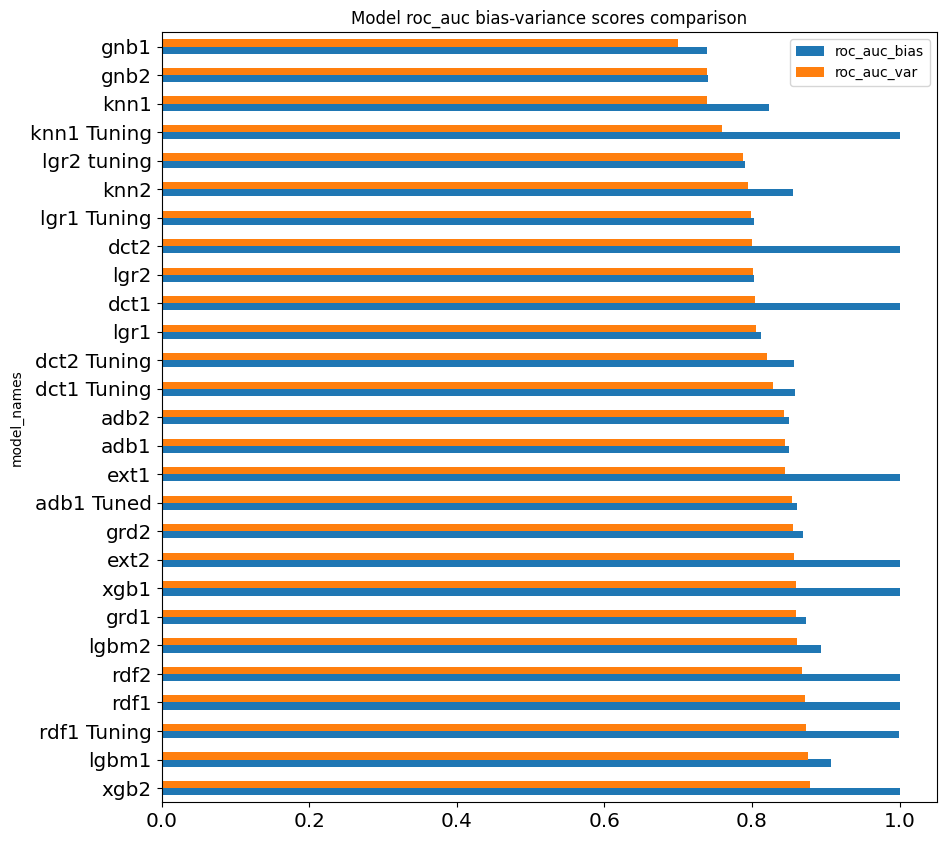

,roc_auc_bias,precision_bias,recall_bias,f1_bias,roc_auc_var,precision_var,recall_var,f1_var
model_names,,,,,,,,
xgb2,0.999933,0.999932,0.999932,0.999932,0.878505,0.896506,0.853001,0.874213
lgbm1,0.906618,0.926029,0.881591,0.903264,0.876334,0.898961,0.845281,0.871295
rdf1 Tuning,0.998432,0.998306,0.998509,0.998407,0.873626,0.900407,0.837561,0.867848
rdf1,0.999933,0.999932,0.999932,0.999932,0.871352,0.899235,0.833780,0.865271
rdf2,0.999934,0.999864,1.000000,0.999932,0.868200,0.898546,0.827478,0.861549
lgbm2,0.893685,0.914888,0.865528,0.889524,0.861466,0.883666,0.829368,0.855657
grd1,0.872989,0.890377,0.847228,0.868267,0.860127,0.883333,0.826690,0.854073
xgb1,0.999934,0.999864,1.000000,0.999932,0.859780,0.875248,0.835670,0.855001
ext2,0.999932,1.000000,0.999864,0.999932,0.857038,0.888908,0.813140,0.849338


In [182]:
# run this to compare all model
compare_all_models()